In [ ]:
#Mounting Drive
from google.colab import drive 
drive.mount('/content/drive')

#Imports

import matplotlib.pyplot as plt
from PIL import Image as im
from skimage.color import rgb2gray
import cv2 as cv

from google.colab import files
import os
import math
import random

import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense,Activation,Dropout,Flatten
from keras.preprocessing.image import ImageDataGenerator
import keras.backend as K


Mounted at /content/drive


In [ ]:
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img
import os
from skimage import io
import scipy.ndimage as ndi
import scipy.signal as sig
from skimage import measure as sk
import glob
import datetime
import multiprocessing

from skimage import data
from skimage.color import rgb2gray

In [ ]:
def valueToIndex(list, value):
    index = np.abs(np.array(list) - value).argmin()
    #print(index)
    return index

def findCenter(img, xSlice, ySlice, verbose=True): #original Slice values
#def findCenter(img, xSlice=0, ySlice=0, blur=30, verbose=True):
    # Apply median filter to get rid of noisy peaks
    gaySauce = img
    #img = ndi.gaussian_filter(img, sigma=blur)
    #img = np.uint32(ndi.median_filter(img))

    # Find image dimensions
    xSize = img.shape[1] - 1
    ySize = img.shape[0] - 1

    # Define slice start points and end points
    x1, y1 = [0, xSize], [ySize / 2 + ySlice, ySize / 2 + ySlice]
    x2, y2 = [xSize / 2 + xSlice, xSize / 2 + xSlice], [0, ySize]

    # Take profile of image along slice
    xProfile = sk.profile_line(img, (y1[0], x1[0]), (y1[1], x1[1]), mode='reflect')
    yProfile = sk.profile_line(img, (y2[0], x2[0]), (y2[1], x2[1]), mode='reflect')
    # Assign xCenter and yCenter to position of maximum of profile
    #print(np.array(xProfile).shape)
    xCenter = valueToIndex(xProfile, max(xProfile[500:680]))
    yCenter = valueToIndex(yProfile, max(yProfile[450:615]))
    print('Center(x,y):')    
    print(xCenter, yCenter)

    # Plot stuff if verbose is True
    if verbose:
        # Get max value for scaling.

        plt.imshow(gaySauce, extent=[0, xSize, ySize, 0])
        #plt.clim(0, 2000)
        
        plt.plot(x1, y1)
        plt.plot(x2, y2)
        plt.plot(xCenter, yCenter, marker='.')

        plt.gcf().gca().add_artist(plt.Circle((xCenter, yCenter), 150, fill=False))

        plt.plot(xProfile/max(xProfile)*500)
        plt.plot(yProfile/max(yProfile)*500)
        
        plt.show()

    return (xCenter, yCenter)

def cropImage(img, xCenter, yCenter, cropWidth):
    return img[yCenter - cropWidth:yCenter + cropWidth, xCenter - cropWidth:xCenter + cropWidth]

In [ ]:
#This first function isn't used

def center_image(file_loc):
    
    #testing_dir = '/content/drive/MyDrive/Bismuth_Data_Unchanged' + directory + '/'
    #img_file = testing_dir + image
    

    img = rgb2gray(np.array(Image.open(file_loc)).astype(np.int16))
    #img = rgb2gray(np.array(np.load(file_loc)).astype(np.int16))    
    #print(img.shape)
    xCenter, yCenter = findCenter(img, 0, 0, False)
    centered_img = cropImage(img, xCenter, yCenter, 375)
    
    return centered_img


def preprocess_img(file_loc):
    
    #"""inputs the file location of the image, ouputs the image and its center coordinates"""
    
    #testing_dir = '/content/drive/MyDrive/Bismuth_Data_Unchanged' + directory + '/'
    #img_file = testing_dir + image
    #img = rgb2gray(np.array(np.load(file_loc)).astype(np.int16))
    img = rgb2gray(np.array(Image.open(file_loc)).astype(np.int16))
    """
    plt.imshow(img)
    plt.show()

    """    
    xCenter, yCenter = findCenter(img, 0, 0, False)    
    
    #resizing
    #onimg = np.array(Image.fromarray(onimg).resize((250,250))).astype(np.int16)
    
    return img, xCenter, yCenter


In [ ]:
def radialProfile(data, center):
    y, x = np.indices((data.shape))
    r = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    r = r.astype(np.int16)

    tbin = np.bincount(r.ravel(), data.ravel())
    nr = np.bincount(r.ravel())
    radialprofile = tbin / nr  # does this divide by number of pixels? Then it is truly average
    return radialprofile

In [ ]:
pixel_to_s = 2.126e-3
scattering_scale = pixel_to_s * np.arange(815)

In [ ]:
def B(T):
    
    """Inputs temperature, outputs the debye-waller factor of Bismuth"""
    a0 = 0.0361
    a1 = 0.358*(10**-2)
    a2 = 0.1111*(10**-5)
    a3 = -0.1855*(10**-8)
    a4 = 0.114*(10**-11)
    
    return a0 + (a1*T)+ (a2*(T**2)) + (a3*(T**3)) + (a4*(T**4)) 

def DB(T):
    """The derivative of B"""
    a1 = 0.358*(10**-2)
    a2 = 0.1111*(10**-5)
    a3 = -0.1855*(10**-8)
    a4 = 0.114*(10**-11)
    
    return a1 + (2*a2*T) + (3*a3*(T**2)) + (4*a4*(T**3))

def newton(f,Df,x0,epsilon,max_iter):
    '''Approximate solution of f(x)=0 by Newton's method.

    Parameters
    ----------
    f : function
        Function for which we are searching for a solution f(x)=0.
    Df : function
        Derivative of f(x).
    x0 : number
        Initial guess for a solution f(x)=0.
    epsilon : number
        Stopping criteria is abs(f(x)) < epsilon.
    max_iter : integer
        Maximum number of iterations of Newton's method.

    Returns
    -------
    xn : number
        Implement Newton's method: compute the linear approximation
        of f(x) at xn and find x intercept by the formula
            x = xn - f(xn)/Df(xn)
        Continue until abs(f(xn)) < epsilon and return xn.
        If Df(xn) == 0, return None. If the number of iterations
        exceeds max_iter, then return None.

    Examples
    --------
    >>> f = lambda x: x**2 - x - 1
    >>> Df = lambda x: 2*x - 1
    >>> newton(f,Df,1,1e-8,10)
    Found solution after 5 iterations.
    1.618033988749989
    '''
    xn = x0
    for n in range(0,max_iter):
        fxn = f(xn)
        if abs(fxn) < epsilon:
            #print('Found solution after',n,'iterations.')
            return xn
        Dfxn = Df(xn)
        if Dfxn == 0:
            #print('Zero derivative. No solution found.')
            return None
        xn = xn - fxn/Dfxn
    #print('Exceeded maximum iterations. No solution found.')
    return None

def B_inverse(b):
    
    def func(T):
        return B(T) - b
    
    root = newton(func, DB, 300, 0.0001, 500)
    print("TEMP: " + str(root))
    return root

In [ ]:
B_r = B(293)

In [ ]:
def bounds_max_scattering(profile):
    """
    Outputs the recommended bounds of integration, as well as the maximum point of the first peak, and the scattering
    vector corresponding to it.
    """
    
    maximum = np.argmax(profile[200:250]) + 200
    lower_bound = maximum - 20
    upper_bound = maximum + 20
    scattering_vector = maximum * pixel_to_s
    
    return maximum, scattering_vector, lower_bound, upper_bound

In [ ]:
def integrate(profile, lower_bound, upper_bound):
    """Integrates between the bounds"""
    
    return np.sum(profile[lower_bound: upper_bound])

In [ ]:
def image_to_B(roomtemp_profile_integral, profile, scattering_vec, lower_bound, upper_bound):
    
    """Inputs a profile and the integral of the room temperature peak, and outputs its debye-waller factor"""
    
    profile_integral = integrate(profile, lower_bound, upper_bound)
    log = np.log(roomtemp_profile_integral/profile_integral)
    
    return B_r + 2*log/(scattering_vec**2)

def image_to_temp(equilibrium_profile_integral, profile, scattering_vec, lower_bound, upper_bound):
    
    """Inputs a profile and the integral of the room temperature peak, and outputs its temperature"""
    
    debye = image_to_B(equilibrium_profile_integral, profile, scattering_vec, lower_bound, upper_bound)
    
    return B_inverse(debye)

In [ ]:
def create_prediction(file_loc):
    
    """Inputs a directory of diffraction images and outputs the predicted temperature of each image in the form of a list"""
    
    #files = os.listdir('/content/drive/MyDrive/Bismuth_Data_Unchanged' + directory)

    test_images = []
    
    #for file in files:
    img, x, y = preprocess_img(file_loc)#file, directory)
    test_images.append((img, x, y))
    
    half_images = []
    
    for triplet in test_images:
        
        #The [0:y,:] means we're only taking the top half of the image. I'm doing this because I don't want to include the 
        #wire and stopper in the radial average, and the top half of the image doesn't have these.
        half_images.append((triplet[0][0:y,:], triplet[1], triplet[2]))
        
    profiles = []
    
    for triplet in half_images:
        profiles.append(radialProfile(triplet[0], (triplet[1], triplet[2])))
        
    eq_profile = profiles[0]
    maxm, s, l, u = bounds_max_scattering(eq_profile)
    eq_profile_integral = integrate(eq_profile, l, u)
    
    #predictions = []
    
    return image_to_temp(eq_profile_integral, profiles[0], s, l, u)
    #for profile in profiles:
    #predictions.append(image_to_temp(eq_profile_integral, profile, s, l, u))
        
    #return predictions

In [ ]:
#Opens files with lab data, processes the image arrays and 
def process_data(data_dir,keep_on_only = False):
  Y,X = np.ogrid[:resolution,:resolution]
  centre_val = resolution/2

  dist_from_center = np.sqrt((X-78)**2+(Y-79)**2)
  mask = (dist_from_center > 13) 
  data_dict = {}
  file_name_array = []
  first_file_max_val = 12000
  for file in os.scandir(data_dir):
    #print(file.path)
    file_loc = file.path.split('Bismuth_Data_Unchanged')[1]

    #Lab data is stored in .npy numpy array files
    if file_loc.endswith(".tiff"):
      
      if keep_on_only:    
        if 'on' in file_loc.lower():
          file_loc_cropped = file_loc.lower().strip().replace(' ','')   
          
          #Loading image array from file  
          img_arr = np.array(Image.open(file.path)).astype(np.int16)
          #img_arr = rgb2gray(np.array(np.load(file_loc)).astype(np.int16))
          #plt.imshow(img_arr)
          #plt.show()
          
          #image = img_arr[:,74:-74]
          #print(image.shape)
          #Converting array into image in order to crop it
          image = im.fromarray(img_arr)
          #Converting image to array to append to array for neural net (not sure if this step is needed but TF can be finicky with image arrays)
          #image = cv.resize(np.float32(image),(150,150))
          #plt.imshow(image)
          #plt.show()

          #image[~mask] = 0        
          
          #determines max pixel value for the first file (for normalization)
          #if len(file_name_array) == 0:
          #  first_file_max_val = max(np.ndarray.flatten(image))
          
          file_name_array.append(file.path)
          data_dict[file.path]=image#/first_file_max_val
      else:  
        file_loc_cropped = file_loc.lower().strip().replace(' ','')   
          
        #Loading image array from file  
        img_arr = np.array(Image.open(file.path)).astype(np.int16)
        #img_arr = rgb2gray(np.array(np.load(file_loc)).astype(np.int16))
        #plt.imshow(img_arr)
        #plt.show()
        
        #image = img_arr[:,74:-74]
        #print(image.shape)
        #Converting array into image in order to crop it
        image = im.fromarray(img_arr)
        #Converting image to array to append to array for neural net (not sure if this step is needed but TF can be finicky with image arrays)
        #image = cv.resize(np.float32(image),(150,150))
        #plt.imshow(image)
        #plt.show()

        #image[~mask] = 0        
        
        #determines max pixel value for the first file (for normalization)
        #if len(file_name_array) == 0:
        #  first_file_max_val = max(np.ndarray.flatten(image))
        
        file_name_array.append(file.path)
        data_dict[file.path]=image#/first_file_max_val

  print("Done! Added {} images".format(len(data_dict.values())))
  return file_name_array, data_dict

In [ ]:
#Defining Parameters for Image Conversion
scale = 4.5 #Scales the radii of the diffraction profiles (large scale increases space between 'rings')
resolution = 150#150#126*2 #Determines image resolution
noise_level = 0.2

In [ ]:
#array of dates of scans to be opened
#dates = [16,17,21]
dates = [8]#list(range(7,25))

Y,X = np.ogrid[:resolution,:resolution]
centre_val = resolution/2

#dist_from_center = np.sqrt((X-78)**2+(Y-79)**2)
#mask = (dist_from_center > 13)      

#opens scans 0-15
dirs_to_open=range(1,15)
data_dir = '/content/drive/MyDrive/Bismuth_Data_Unchanged/'
for date in dates:
  series_arr = []
  if date < 10:
    date = "2021-02-" + "0"+str(date) + "/"+ "2021-02-" + "0"+str(date) + "/scans/scan"
  else:
    date = "2021-02-" + str(date) + "/"+ "2021-02-" + str(date) + "/scans/scan"
  for i in dirs_to_open:
    #print("----------STARTING NEW TEST------")
    scan_num = str(i)
    dir_name = data_dir + date + scan_num + "/"
    if os.path.exists(dir_name):
      print("Directory name: "+dir_name)
      
      file_name_array, data_dict = process_data(dir_name)
      #file_name_array.sort()
      data_arr = []

      for file_name in file_name_array:
        #full_name = "/content/drive/MyDrive/Bismuth_Data_Processed"+file_name
        print("Working on: " + file_name)
        data_arr.append([data_dict[file_name],file_name])     
        try:
          if create_prediction(file_name) != 293.0007670658719:
            print("----------------------------WE GOT AN ANOMALY----------------------------")
        except Exception as e:
          print("Oops!", e, "occurred.")
          print("Next entry.")
          print()
      
      """
      for i in data_arr:
        
        image = i[0]
        #plt.imshow(image,cmap='gray')
        #plt.show()
        #image[~mask] = 0        
        plt.imshow(image,cmap='gray')
        plt.show()
        plt.plot(image[78])
        plt.show()
      """
     
#img = data_arr[0][0]
#print(img.shape)
#plt.imshow(img)
#plt.show()

In [ ]:
#Used for classification task
def generate_one_hot_vecs(num):
  #Generating one hot vectors for labels
  one_hot_vecs = []
  for i in range(0,num):
    one_hot_vec =[0] * num
    one_hot_vec[i] = 1
    one_hot_vecs.append(one_hot_vec)
  return one_hot_vecs

----RETRIEVING DATA----
0.0%
0.0%
20.0%
20.0%
20.0%
20.0%
40.0%
40.0%
40.0%
40.0%
60.0%
60.0%
60.0%
60.0%
80.0%
80.0%
80.0%
80.0%
----DONE----


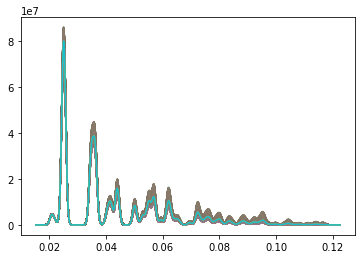

Have 360 datapoints for training


In [ ]:
#Open and processes data in all files in a given directory
#Returns one list of radii and another of intensities


def retrieve_data(directory="/content/drive/MyDrive/AI for UED/Bismuth Profiles",uiso_lower_bound = 0, uiso_increment=0.1,uiso_upper_bound=1,intensity_scale=1):
  
  #Creating an array of file names for all Bi files 
  files_to_open = []
  uiso_vals_in_range = np.arange(uiso_lower_bound,uiso_upper_bound,uiso_increment)  
  uiso_vals_in_range = [round(elem, 5) for elem in uiso_vals_in_range ]  

  """
  for val in range(0,11,1):
    #print(val/10)
    file_name = directory + str(val/10) + ".txt" 
    files_to_open.append(file_name)
  """
  #Opening files and processing data into lists of radii and intensities 
  
  radii = [] 
  intensities = []
  uiso_labels = []
  print("----RETRIEVING DATA----")
  for subdirectories, directories, files in os.walk(directory):
    index = 0
    denom = len(uiso_vals_in_range)
    for file_name in files:
      #print(subdirectories + os.path.sep + file_name)
      if '(1)' not in file_name.split("reciprocal_")[1].split(".txt")[0]:          
        uiso_val = float(file_name.split("reciprocal_")[1].split(".txt")[0])
        if uiso_val in uiso_vals_in_range:          
          file = open(subdirectories + os.path.sep + file_name, "r")        
          array_vals = []
          #percent_val = round(100*uiso_vals_in_range.index(uiso_val)/len(uiso_vals_in_range),0)
          percent_val = round(100*index/denom,0)
          index+=1
          if percent_val%20 == 0:
            print(str(percent_val)+"%")
          for line in file:
            data_point = line.split() #X and Y values are separated by a space
            array_vals.append([scale*math.tan(math.radians(float(data_point[0]))/2),intensity_scale*float(data_point[1])]) #converts angles into radii          
          radius,intensity = zip(*array_vals) #Unzipping array of [x_values,y_values] into list of x_values and y_values
          radii.append(radius)
          intensities.append(intensity)
          uiso_labels.append(uiso_val)
  print("----DONE----")
  for i in range(0,len(radii)):
    plt.plot(radii[i],intensities[i])
  plt.show()
  print("Have {} datapoints for training".format(len(radii)))  
  

  return uiso_labels, radii, intensities

def add_multiplicative_noise(input_img):
  noise = 1+(noise_level*np.random.randn(resolution,resolution))
  noisy_img = input_img*noise
  return noisy_img

uiso_labels, radii, intensities = retrieve_data(uiso_lower_bound = 0.0138, uiso_increment=0.0001,uiso_upper_bound=0.05)

In [ ]:
"""
X = []
Y = []
X_array = []
Y_array = []

#Calling functions to generate diffraction data
uiso_labels, radii, intensities = retrieve_data(uiso_lower_bound = 0.0138, uiso_increment=0.0005,uiso_upper_bound=0.05)
images = generate_diffraction_patterns(uiso_labels,radii,intensities,False)
print(len(images))
for i in range(0,10):  
  plt.imshow(images[i][0])
  print(images[i][1])
  plt.show()
  plt.plot(images[i][0][78])
  plt.show()
  #print(images[i][0].shape)
  #print(max(np.ndarray.flatten(images[i][0])))

#Extracting and reshaping arrays of X and Y values from dataset

X,Y = zip(*images)
X_array = np.array(X).reshape(-1,int(resolution),int(resolution),1)
Y_array = np.array(Y).reshape(-1,1)
X = []
Y = []
#Array shape is checked to ensure they are of equal length and of correct size
print(X_array.shape)
print(Y_array.shape)
"""

'\nX = []\nY = []\nX_array = []\nY_array = []\n\n#Calling functions to generate diffraction data\nuiso_labels, radii, intensities = retrieve_data(uiso_lower_bound = 0.0138, uiso_increment=0.0005,uiso_upper_bound=0.05)\nimages = generate_diffraction_patterns(uiso_labels,radii,intensities,False)\nprint(len(images))\nfor i in range(0,10):  \n  plt.imshow(images[i][0])\n  print(images[i][1])\n  plt.show()\n  plt.plot(images[i][0][78])\n  plt.show()\n  #print(images[i][0].shape)\n  #print(max(np.ndarray.flatten(images[i][0])))\n\n#Extracting and reshaping arrays of X and Y values from dataset\n\nX,Y = zip(*images)\nX_array = np.array(X).reshape(-1,int(resolution),int(resolution),1)\nY_array = np.array(Y).reshape(-1,1)\nX = []\nY = []\n#Array shape is checked to ensure they are of equal length and of correct size\nprint(X_array.shape)\nprint(Y_array.shape)\n'

In [ ]:
#Defining neural net

def build_cnn_model():
  cnn_model = keras.Sequential([
      keras.layers.Conv2D(filters=18,kernel_size=(5,5),activation=tf.nn.relu),           
      keras.layers.MaxPool2D(pool_size=(2, 2)),

      keras.layers.Conv2D(filters=36,kernel_size=(5,5),activation=tf.nn.relu), 
      keras.layers.MaxPool2D(pool_size=(2, 2)),

      keras.layers.Conv2D(filters=72,kernel_size=(5,5),activation=tf.nn.relu), 
      keras.layers.MaxPool2D(pool_size=(2, 2)),
      

      keras.layers.Flatten(),
      keras.layers.Dense(128, activation=tf.nn.relu),
      #keras.layers.Dropout(0.6),
      keras.layers.Dense(1)#, activation=tf.nn.softmax)
  ])
    
  return cnn_model

def compile_cnn(model,init_lr=0.001):
  initial_learning_rate = init_lr
  lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
      initial_learning_rate,
      decay_steps=300,
      decay_rate=0.96,
      staircase=True)
  model.compile(loss = 'mean_squared_error', optimizer = tf.keras.optimizers.RMSprop(learning_rate = lr_schedule), 
                  metrics = [linear_regression_equality])
  return model

def load_model(epoch_to_load,base_type):
  model = build_cnn_model()
  model = compile_cnn(model,0.0007)
  if base_type == 0:
    model.load_weights("/content/drive/MyDrive/Bismuth_Data_Processed/CNN_weights_normal_1_scaled{}.ckpt".format(epoch_to_load)).expect_partial()
  elif base_type == 1:
    model.load_weights("/content/drive/MyDrive/Bismuth_Data_Processed/CNN_weights_inv_sq_1_scaled{}.ckpt".format(epoch_to_load)).expect_partial()      
  else:
    model.load_weights("/content/drive/MyDrive/Bismuth_Data_Processed/CNN_weights_unspecified_fn_1_scaled{}.ckpt".format(epoch_to_load)).expect_partial()    
  return model


"""
These metrics check the accuracy of the network. 
The second metric (which has a larger allowed error) determines whether the network's prediction is 'in the ballpark'
"""
#accepted_diff = 0.0005 
accepted_diff = 0.00025
def linear_regression_equality(y_true, y_pred):
    diff = K.abs(y_true-y_pred)
    return K.mean(K.cast(diff < accepted_diff, tf.float32))

In [ ]:
#Converts Radii-Intensity data into Diffraction Patterns
#Returns 2D array in which each element is: [diffraction pattern, label]

def generate_diffraction_patterns(uiso_labels,radii,intensities,one_hot_vecs,invert=False,num_augmentations=2,num_img_to_generate=4):

  #This code generates a two-part circular mask 
  #This mask obscures all points greater than a distance of 'curr_rad' and less than a distance of 'prev_rad'
  #This creates a circle, the radius of which depends on the resolution of the angle data
  #This mask is applied to a white image in order to generate a fully white circle 
  #source: https://stackoverflow.com/questions/44865023/how-can-i-create-a-circular-mask-for-a-numpy-array
  #Added an invert option because it looks cool

  images = [] #images will be a list of [diffraction patterns, labels]

  #Setting up a (resolution,resolution) sized array for the mask
  #Ogrid is used to setup a row and column vector of values ranging from 0 to resolution

  Y,X = np.ogrid[:resolution,:resolution]
  centre_val = resolution/2

  #The values stored in each vector are squared and the vectors are added (using broadcasting)
  #The value at each point of the resulting array is the 'distance' between that point and the centre
  dist_from_center = np.sqrt((X-centre_val)**2+(Y-centre_val)**2)

  #white image used to generate white circles
  #array_ones = np.ones((resolution,resolution))

  datagen = ImageDataGenerator(
    #zoom_range = 0.1,
    #rotation_range=180,
    horizontal_flip=True,
    vertical_flip=True,
    )
  print("----GENERATING DIFFRACTION PATTERNS----")
  for i in range(0,len(radii)): #iterates through all diffraction profiles
    percent_val = round(100*i/len(radii),0)
    if percent_val%20 == 0:
      print(str(percent_val)+"%")
    #creates a 'base image' for the background of the image
    """
    if invert:
      base_img = np.ones((resolution,resolution))*255
    else:
      base_img = np.zeros((resolution,resolution))
    """
    
    base_img = np.zeros((resolution,resolution))
    uiso_label = uiso_labels[i]
    radius = radii[i]
    intensity = intensities[i]
    
    #Scaling the radii of each diffraction pattern
    #This ensures that the smallest radii rings (the brightest rings) have a radius equal to 8.5% of the image's width/height
    min_rad = radius[0]
    radius_adjustment_value = (resolution/2)*0.17/min_rad

    prev_rad = radius[0]*radius_adjustment_value
    max_intensity = max(intensity)
    for j in range(0,len(radius)):         
      curr_rad = radius[j]*radius_adjustment_value

      #Defining the two-part mask
      mask = (dist_from_center <= curr_rad) & (dist_from_center > prev_rad)      
      white_image = np.ones((resolution,resolution)) #np.copy(array_ones)
      
      #applies mask to white image
      white_image[~mask]=0
      
      #normalizing by setting uiso_0 images equal to OFF images in lab data
      base_img += white_image*intensity[j]#*8000/max(intensities[0])
      prev_rad = curr_rad

    base_img = base_img*8000/90247000
    max_image_brightness = max(np.ndarray.flatten(base_img))

    # Setting up stopper + bright spot
    X_centered = X - resolution/2
    Y_centered = Y - resolution/2

    #making x/y square arrays
    lin_combination_image = Y_centered+X_centered

    X_square = lin_combination_image-Y_centered
    Y_square = X_centered-lin_combination_image

    #determining distance of each point in array from centre (this will be used in bright spot's the mask)
    dist_from_center = (np.sqrt((X-centre_val)**2+(Y-centre_val)**2))

    max_dist = max(np.ndarray.flatten(dist_from_center))

    #normalizes distance values
    normalized_bright_spot = (max_dist-dist_from_center)/max_dist

    #defines mask for the bright spot in the middle (with a dark spot because of the stopper)
    bright_spot_mask = (normalized_bright_spot>0.955) & (normalized_bright_spot<0.97)

    #applies mask
    normalized_bright_spot[~bright_spot_mask] = 0

    #Brightens spot based on rest of image
    normalized_bright_spot *= max_image_brightness

    #Defining mask for stopper's wire

    lin_eq_square =Y_square + 4*X_square #Defines the stopper wire's equation as b = Y + 4*X , with b ranging from +-0.04*resolution in order to give the wire some thickness
    quadrant_mask = (X_square>0) #Only want the stopper's wire in the 4th quadrant, so we limit X > 0
    wire_mask = (lin_eq_square<resolution*0.04) & (lin_eq_square>-resolution*0.04)         

  
    #applies both masks to white image to create image of stopper
    
    #Subtracts image of stopper from the base image, and adds the bright spot in the middle
    
    #base_img = np.clip(base_img - white_image + normalized_bright_spot,0,max_image_brightness)

    
    
    mean = resolution/2
    div_param = 1
    mult_param = 82500
    exp_param = 2
    stdev = 0.425*resolution

    #gaussian_base = np.clip(mult_param*(1/(((X-mean)/div_param)**(2)+((Y-mean)/div_param)**(2)))**(1/exp_param),0,999999999)    
    gaussian_base = 4000*np.exp((-(X-mean)**(2)-(Y-mean)**2)/(stdev)**2)
    dist_from_center = np.sqrt((X-75)**2+(Y-75)**2)
    mask = (dist_from_center > 13)   
    gaussian_base[~mask]=0
    base_img = base_img + gaussian_base

    max_image_brightness = max(np.ndarray.flatten(base_img))
    white_image = max_image_brightness*np.ones((resolution,resolution))#
    white_image[~wire_mask]=0
    white_image[~quadrant_mask]=0
    base_img = np.clip(base_img - white_image ,0,max_image_brightness)
    
    #add multiplicative/additive noise (turned off for now)
    #base_img_noisy = add_multiplicative_noise(base_img)
    
    #Blurring and randomly translating images to generate more datapoints            
    #We'll repeat the augmentation code multiple times, each time with a different blur    
    #"""
  
    for augmentation in range(0,2):
      
      max_translation = int(0.05*resolution)
      for q in range(0,10):
        M = np.float32([
        [1, 0, random.randint(-max_translation,max_translation)],
        [0, 1, random.randint(-max_translation,max_translation)]
        ])    
        new_image = cv.warpAffine(base_img, M, (resolution,resolution))

        blurry_img_expanded=np.expand_dims(np.expand_dims(new_image,-1),0)

        num_images_generated = 0
        for augmented_image in datagen.flow(blurry_img_expanded):
          if num_images_generated < num_img_to_generate:
            num_images_generated+=1
            reshaped_augmented_image = np.reshape(augmented_image,(resolution,resolution)) 

            reshaped_augmented_image_blurry = cv.GaussianBlur(reshaped_augmented_image,(5,5),0.3+random.uniform(-0.3, 0.3))
            
            if invert:
              max_blurry_image_brightness = max(np.ndarray.flatten(reshaped_augmented_image_blurry))
              inverted_image = max_blurry_image_brightness - reshaped_augmented_image_blurry              
              images.append((uiso_label,inverted_image))#round(float(i/(len(radii)-1)),2)])
            else:              
              images.append((uiso_label,reshaped_augmented_image_blurry/12000))#round(float(i/(len(radii)-1)),2)])
              
          else:
            break  
    #"""         
  #Shuffles dataset
  #random.shuffle(images)
  print("----DONE----")
  return images

----RETRIEVING DATA----
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
20.0%
20.0%
20.0%
20.0%
20.0%
20.0%
20.0%
20.0%
20.0%
20.0%
20.0%
40.0%
40.0%
40.0%
40.0%
40.0%
40.0%
40.0%
40.0%
40.0%
40.0%
40.0%
----DONE----


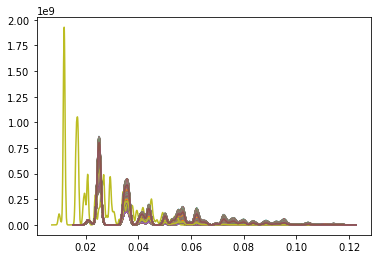

Have 586 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
0.0%
0.0%
20.0%
20.0%
20.0%
20.0%
20.0%
20.0%
40.0%
40.0%
40.0%
40.0%
40.0%
40.0%
60.0%
60.0%
60.0%
60.0%
60.0%
60.0%
80.0%
80.0%
80.0%
80.0%
80.0%
80.0%
100.0%
100.0%
----DONE----
23440


In [ ]:
uiso_labels, radii, intensities = retrieve_data(uiso_lower_bound = 0#0.0138
                                                , uiso_increment=0.0003
                                                ,uiso_upper_bound=0.3#uiso_upper_bound=0.1259#0.05
                                                ,intensity_scale=10)
images = generate_diffraction_patterns(uiso_labels,radii,intensities,False,num_img_to_generate=2)
images.sort(key=lambda a: a[0])
print(len(images))
Y,X = zip(*images)

In [ ]:
#Y_arr = np.array(Y)
"""
min_val = np.min(Y_arr)
max_val = np.max(Y_arr)
uiso_const = (max_val- min_val)/10
for i in range(0,10):
  index_val = uiso_const*i +min_val
  print(index_val)
print('--')
"""
for i in range(0,10):
  index_val = len(Y)*i/10
  print(Y[int(index_val)])
  img = X[int(index_val)]
  plt.imshow(img)
  plt.show()
  plt.plot(img[75])
  plt.show()

In [ ]:
X_arr_reshaped = []
i = 0

for image in X:
  if (i < 5860 or i >= (23440-5860)):
    X_img = Image.fromarray(image)
    X_img = X_img.resize((32,32))
    X_img_arr = np.array(X_img)
    X_arr_reshaped.append(X_img_arr)
  i+=1
X_arr = np.array(X_arr_reshaped)
print(X_arr.shape)

(11720, 32, 32)


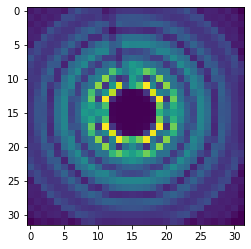

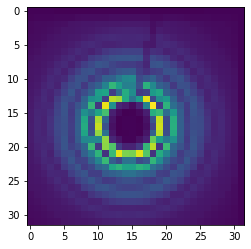

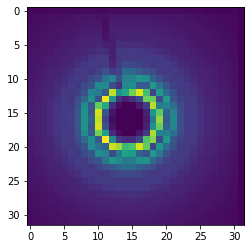

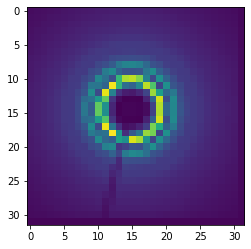

In [ ]:

plt.imshow(X_arr[0])
plt.show()
#plt.imshow(X_arr[int(14040/4)])
#plt.show()
plt.imshow(X_arr[int(11720/2-1)])
plt.show()
plt.imshow(X_arr[int(11720/2)])
plt.show()
#plt.imshow(X_arr[int(3*14040/4)])
#plt.show()
plt.imshow(X_arr[-1])
plt.show()


In [ ]:

#this converts uiso labels to temperature with a quadratic approximation

A_0 = 0.03610
A_1 = 0.003580
A_2 = 0.000001111
temp_array = []
for i in Y_array:
  C = A_0 - 8 * (np.pi**2) * i[0]
  quad_val = (-A_1 + (A_1**2-4*A_2*C)**(1/2))/(2*A_2)
  temp_array.append(quad_val)

In [ ]:
a = [0] * 3510 + [1] * 3510 + [2] * 3510 + [3] * 3510
Y_array = np.array(a).reshape(-1,1)

(14040, 1)


In [ ]:
#^^^ Data generation is done. Time to code up cgan and separate data into labels

In [ ]:
X_array = np.array(X_arr).reshape(-1,32,32,1)
#Y = [1,0,0,0] * 3510 + [0,1,0,0] * 3510 + [0,0,1,0] * 3510 + [0,0,0,1] * 3510
Y = [1,0] * 5860 + [0,1]* 5860
Y_array = np.array(Y).reshape(-1,2)
X = []
Y = []
#Array shape is checked to ensure they are of equal length and of correct size
print(X_array.shape)
print(Y_array.shape)

(11720, 32, 32, 1)
(11720, 2)


In [ ]:
labels = tf.convert_to_tensor(np.array(Y_array), 'float32')
imgs = tf.convert_to_tensor(X_array,'float32')
dataset = tf.data.Dataset.from_tensor_slices((imgs, labels))
dataset = dataset.repeat(50)

In [ ]:
batch_size = 16
num_channels = 1
num_classes = 2
image_size = 32
latent_dim = 500

dataset = dataset.shuffle(buffer_size=1024).batch(batch_size)
print(imgs.shape)
print(labels.shape)
dataset

(11720, 32, 32, 1)
(11720, 2)


<BatchDataset shapes: ((None, 32, 32, 1), (None, 2)), types: (tf.float32, tf.float32)>

In [ ]:
generator_in_channels = latent_dim + num_classes
discriminator_in_channels = num_channels + num_classes
print(generator_in_channels, discriminator_in_channels)

502 3


In [ ]:
from tensorflow.keras.layers import Conv2D, AveragePooling2D, MaxPooling2D, Flatten, Dense, Dropout, Lambda
from tensorflow.keras import layers

# Create the discriminator.
discriminator = keras.Sequential(
    [
        keras.layers.InputLayer((32, 32, discriminator_in_channels)),
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding="same"),
        MaxPooling2D(2,2),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding="same"),
        MaxPooling2D(2,2),
        layers.LeakyReLU(alpha=0.2),
        layers.GlobalMaxPooling2D(),
        layers.Dense(1),
    ],
    name="discriminator",
)

# Create the generator.

generator = keras.Sequential(
    [
        keras.layers.InputLayer((generator_in_channels,)),
        # We want to generate 128 + num_classes coefficients to reshape into a
        # 7x7x(128 + num_classes) map.
        layers.Dense(162*2),
        layers.ReLU(),
        layers.Reshape((9, 9, 2*2)),
        layers.Conv2DTranspose(4, (4, 4), strides=(2, 2), padding="same"),
        layers.ReLU(),
        layers.Conv2DTranspose(8, (4, 4), strides=(2, 2), padding="same"),
        layers.ReLU(),
        layers.Conv2D(1, (5, 5), activation="sigmoid"),
    ],
    name="generator",
)

In [ ]:
generator.summary()
discriminator.summary()

In [ ]:
class ConditionalGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(ConditionalGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.gen_loss_tracker = keras.metrics.Mean(name="generator_loss")
        self.disc_loss_tracker = keras.metrics.Mean(name="discriminator_loss")

    @property
    def metrics(self):
        return [self.gen_loss_tracker, self.disc_loss_tracker]

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(ConditionalGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    def train_step(self, data):
        # Unpack the data.
        real_images, one_hot_labels = data

        # Add dummy dimensions to the labels so that they can be concatenated with
        # the images. This is for the discriminator.
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = tf.repeat(
            image_one_hot_labels, repeats=[image_size * image_size]
        )
        image_one_hot_labels = tf.reshape(
            image_one_hot_labels, (-1, image_size, image_size, num_classes)
        )

        # Sample random points in the latent space and concatenate the labels.
        # This is for the generator.
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        random_vector_labels = tf.concat(
            [random_latent_vectors, one_hot_labels], axis=1
        )

        # Decode the noise (guided by labels) to fake images.
        generated_images = self.generator(random_vector_labels)

        # Combine them with real images. Note that we are concatenating the labels
        # with these images here.
        fake_image_and_labels = tf.concat([generated_images, image_one_hot_labels], -1)
        real_image_and_labels = tf.concat([real_images, image_one_hot_labels], -1)
        combined_images = tf.concat(
            [fake_image_and_labels, real_image_and_labels], axis=0
        )

        # Assemble labels discriminating real from fake images.
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0
        )

        # Train the discriminator.
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space.
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        random_vector_labels = tf.concat(
            [random_latent_vectors, one_hot_labels], axis=1
        )

        # Assemble labels that say "all real images".
        misleading_labels = tf.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_vector_labels)
            fake_image_and_labels = tf.concat([fake_images, image_one_hot_labels], -1)
            predictions = self.discriminator(fake_image_and_labels)
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Monitor loss.
        self.gen_loss_tracker.update_state(g_loss)
        self.disc_loss_tracker.update_state(d_loss)
        return {
            "g_loss": self.gen_loss_tracker.result(),
            "d_loss": self.disc_loss_tracker.result(),
        }

In [ ]:
cond_gan = ConditionalGAN(
    discriminator=discriminator, generator=generator, latent_dim=latent_dim
)
cond_gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0002,beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002,beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

In [ ]:
cond_gan.fit(dataset, epochs = 1000, steps_per_epoch = 339//batch_size, verbose = 1)

Epoch 1/1000
21/21 [==============================] - 2s 8ms/step - g_loss: 0.7703 - d_loss: 0.5909
Epoch 2/1000
21/21 [==============================] - 0s 8ms/step - g_loss: 1.1972 - d_loss: 0.3371
Epoch 3/1000
 1/21 [>.............................] - ETA: 0s - g_loss: 1.6150 - d_loss: 0.2043

KeyboardInterrupt: ignored

epoch 500
CLASS 0


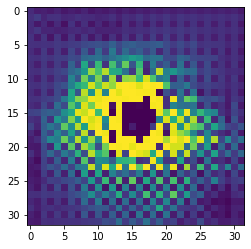

CLASS 1


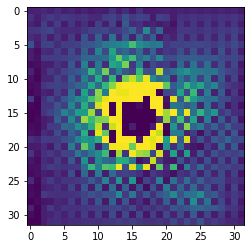

epoch 1000
CLASS 0


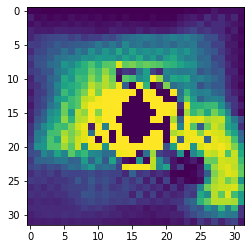

CLASS 1


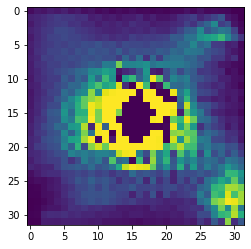

epoch 1500
CLASS 0


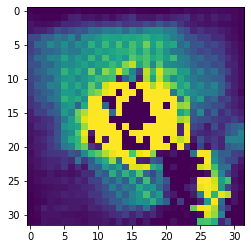

CLASS 1


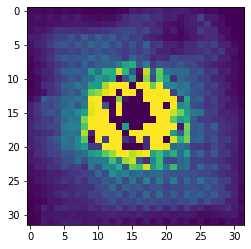

epoch 2000
CLASS 0


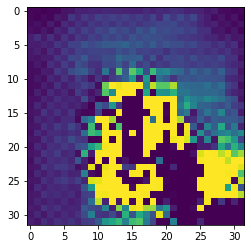

CLASS 1


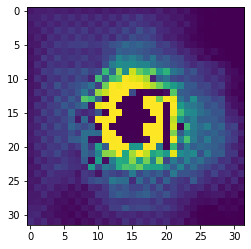

epoch 2500
CLASS 0


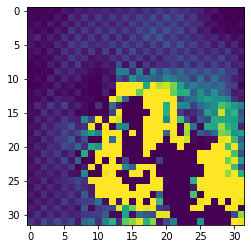

CLASS 1


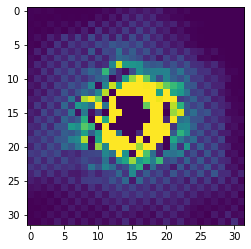

epoch 3000
CLASS 0


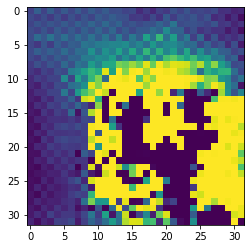

CLASS 1


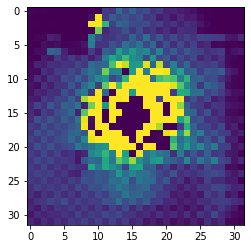

epoch 3500
CLASS 0


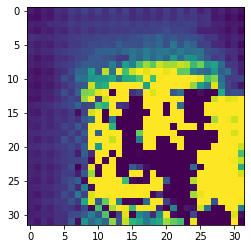

CLASS 1


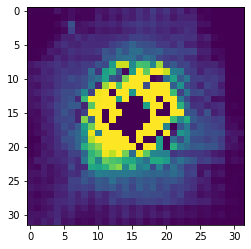

epoch 4000
CLASS 0


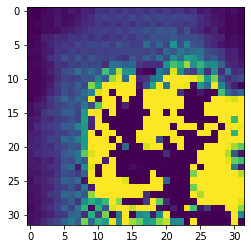

CLASS 1


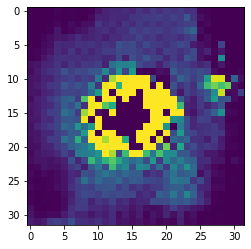

epoch 4500
CLASS 0


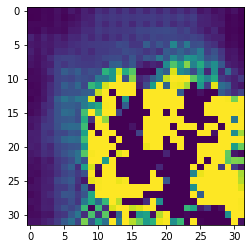

CLASS 1


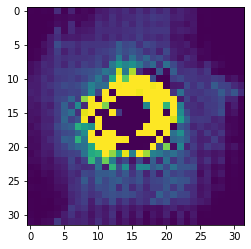

epoch 5000


KeyboardInterrupt: ignored

In [122]:
for i in range(0,10):
  print("epoch {}".format((i+1)*500))
  cond_gan.fit(dataset, epochs = 500, steps_per_epoch = 339//batch_size,verbose=0)
  trained_gen = cond_gan.generator

  random_latent_vector = tf.random.normal(shape=(1, latent_dim))
  label = keras.utils.to_categorical([0], 2)
  noise_and_labels = tf.concat([random_latent_vector, label], 1)

  fake_image = trained_gen.predict(noise_and_labels)
  
  print("CLASS 0")
  plt.imshow(fake_image.reshape(32,32))
  plt.show()
  
  random_latent_vector = tf.random.normal(shape=(1, latent_dim))
  label = keras.utils.to_categorical([1], 2)
  noise_and_labels = tf.concat([random_latent_vector, label], 1)

  fake_image = trained_gen.predict(noise_and_labels)
  print("CLASS 1")
  plt.imshow(fake_image.reshape(32,32))
  plt.show()

In [ ]:
trained_gen = cond_gan.generator

random_latent_vector = tf.random.normal(shape=(1, latent_dim))
label = keras.utils.to_categorical([0], 4)
noise_and_labels = tf.concat([random_latent_vector, label], 1)

fake_image = trained_gen.predict(noise_and_labels)

plt.imshow(fake_image.reshape(32,32))

In [ ]:
discriminator_complex = keras.Sequential(
    [
        keras.layers.InputLayer((32, 32, discriminator_in_channels)),
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding="same"),
        MaxPooling2D(2,2),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding="same"),
        MaxPooling2D(2,2),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(momentum=0.5),
        layers.GlobalMaxPooling2D(),
        layers.Dense(10),
        layers.LeakyReLU(alpha = 0.2),
        layers.Dense(1),
    ],
    name="discriminator",
)

generator_complex = keras.Sequential(
    [
        keras.layers.InputLayer((generator_in_channels,)),
        # We want to generate 128 + num_classes coefficients to reshape into a
        # 7x7x(128 + num_classes) map.
        layers.Dense(500),
        layers.ReLU(),
        layers.BatchNormalization(momentum=0.5),
        layers.Dense(1620),
        layers.ReLU(),
        layers.BatchNormalization(momentum=0.5),
        layers.Reshape((18, 18, 5)),
        layers.Conv2DTranspose(8, (2, 2), strides=(1, 1), padding = "same"),
        layers.ReLU(),
        layers.Conv2DTranspose(16, (4, 4), strides = (2, 2), padding = "same"),
        layers.ReLU(),
        layers.Conv2D(1, (5, 5), activation="sigmoid"),
    ],
    name="generator",
)

In [ ]:
generator_complex.summary()
discriminator_complex.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 500)               251500    
                                                                 
 re_lu_6 (ReLU)              (None, 500)               0         
                                                                 
 batch_normalization_1 (Batc  (None, 500)              2000      
 hNormalization)                                                 
                                                                 
 dense_7 (Dense)             (None, 1620)              811620    
                                                                 
 re_lu_7 (ReLU)              (None, 1620)              0         
                                                                 
 batch_normalization_2 (Batc  (None, 1620)             6480      
 hNormalization)                                         

In [ ]:
cond_gan = ConditionalGAN(
    discriminator=discriminator_complex, generator=generator_complex, latent_dim=latent_dim
)
cond_gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0003,beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0002,beta_1=0.4),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

epoch 500


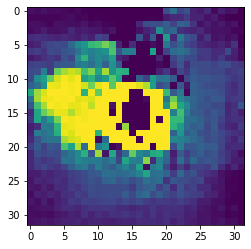

epoch 1000


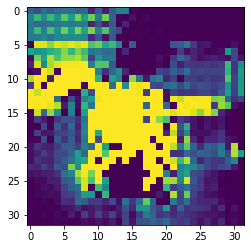

epoch 1500


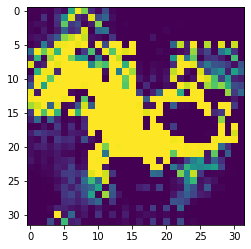

epoch 2000


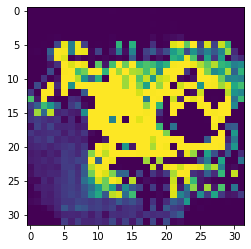

epoch 2500


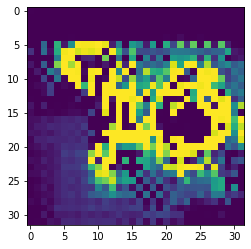

epoch 3000


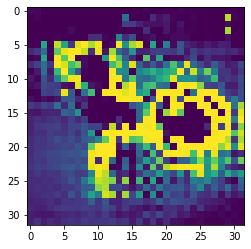

epoch 3500


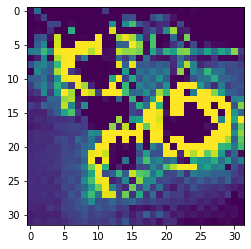

epoch 4000


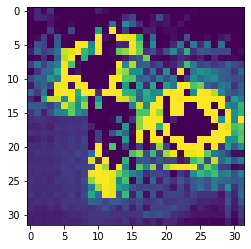

epoch 4500


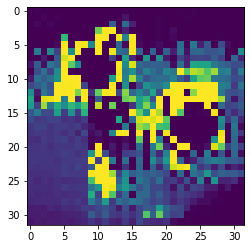

epoch 5000


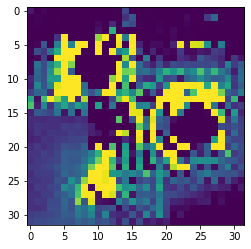

epoch 5500


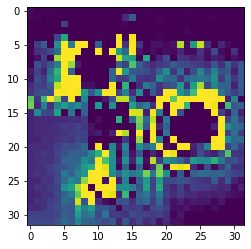

epoch 6000


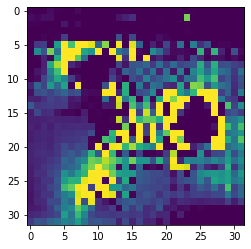

epoch 6500


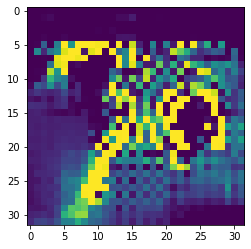

epoch 7000


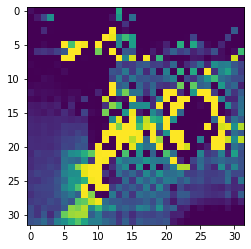

epoch 7500


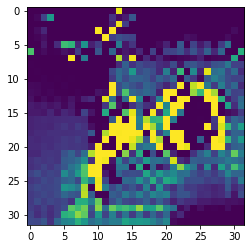

epoch 8000


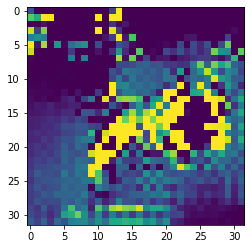

epoch 8500


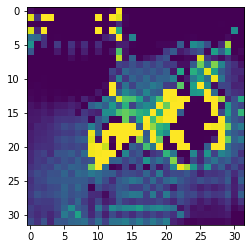

epoch 9000


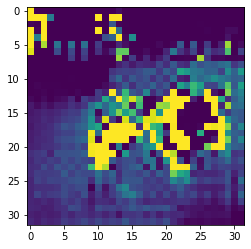

epoch 9500


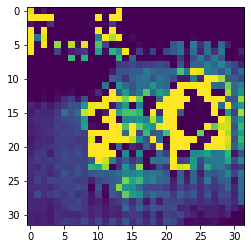

epoch 10000


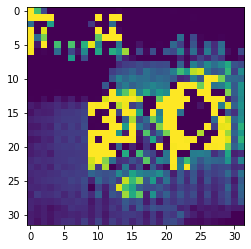

epoch 10500


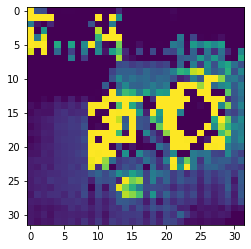

epoch 11000


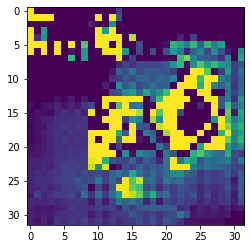

epoch 11500


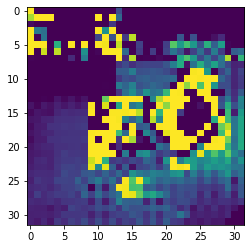

epoch 12000


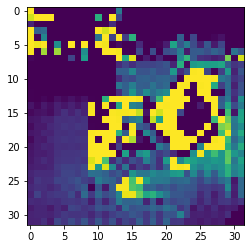

epoch 12500


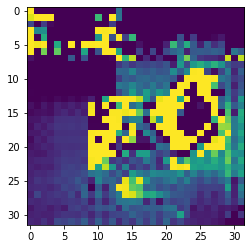

epoch 13000


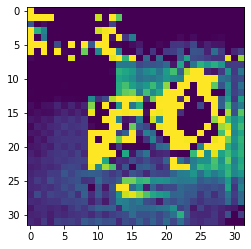

epoch 13500


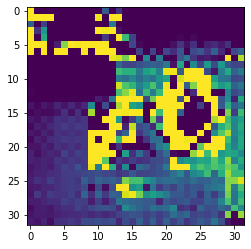

epoch 14000


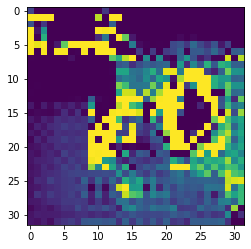

epoch 14500


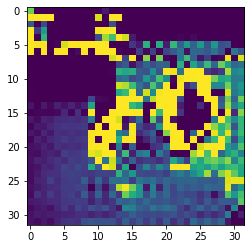

epoch 15000


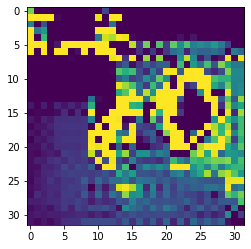

epoch 15500


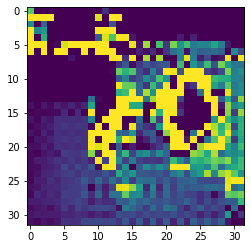

epoch 16000


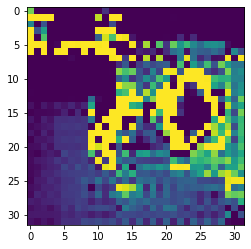

epoch 16500


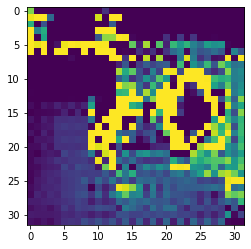

epoch 17000


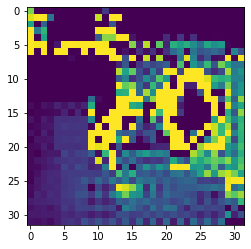

epoch 17500


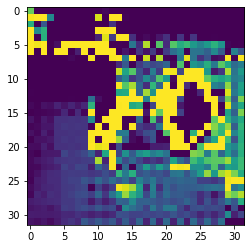

epoch 18000


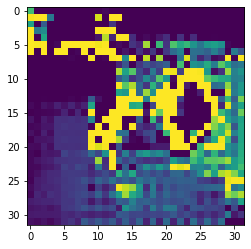

epoch 18500


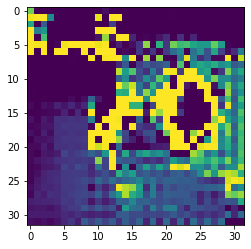

epoch 19000


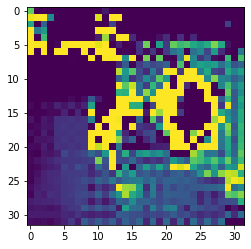

epoch 19500


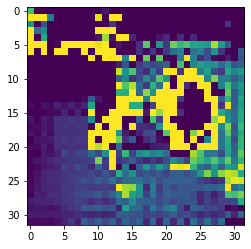

epoch 20000


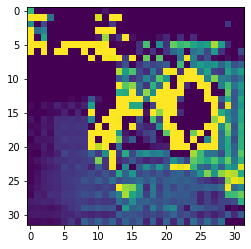

epoch 20500


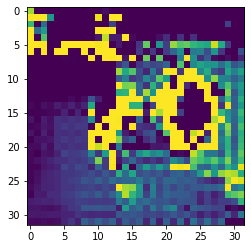

epoch 21000


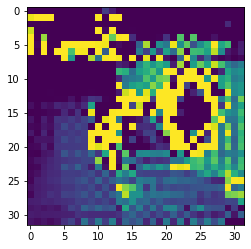

epoch 21500


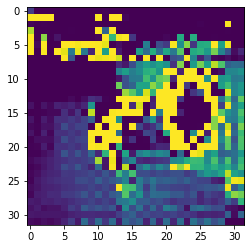

epoch 22000


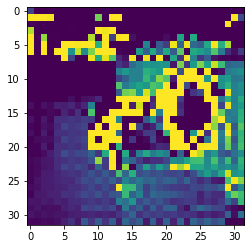

epoch 22500


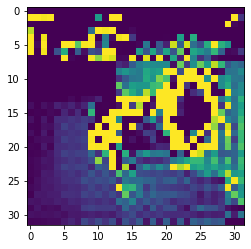

epoch 23000


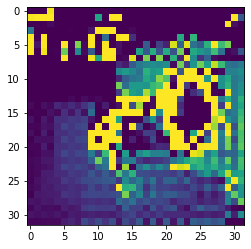

epoch 23500


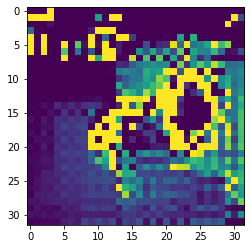

epoch 24000


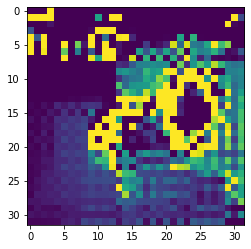

epoch 24500


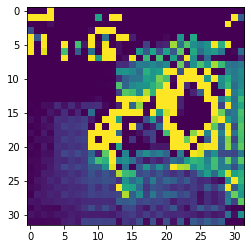

epoch 25000


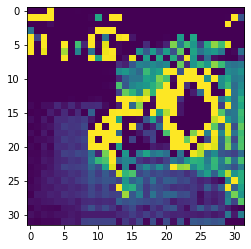

epoch 25500


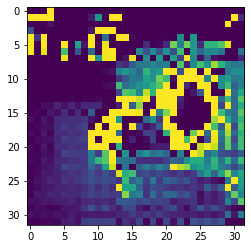

epoch 26000


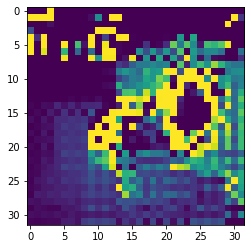

epoch 26500


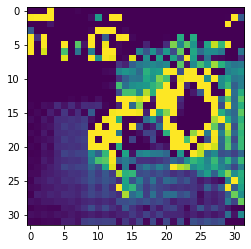

epoch 27000


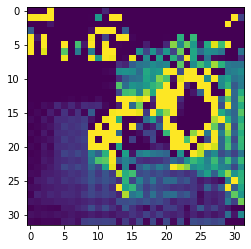

epoch 27500


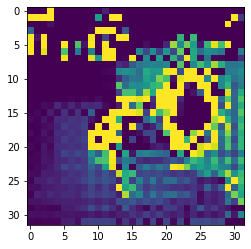

epoch 28000


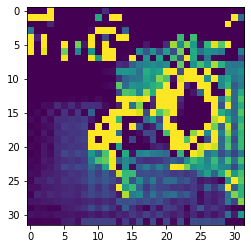

epoch 28500


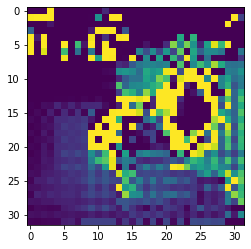

epoch 29000


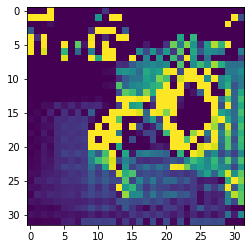

epoch 29500


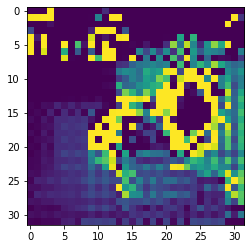

epoch 30000


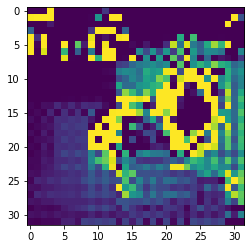

epoch 30500


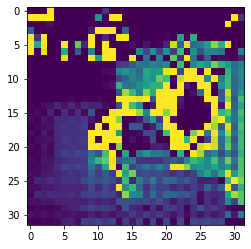

epoch 31000


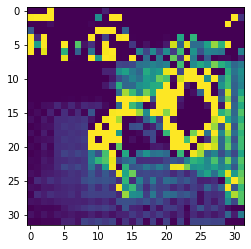

epoch 31500


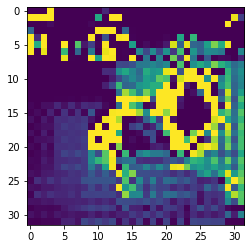

epoch 32000


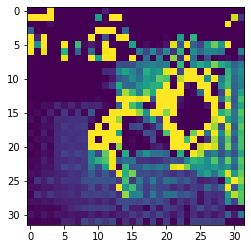

epoch 32500


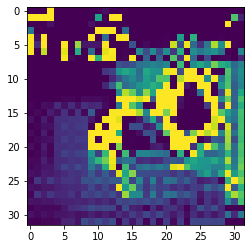

epoch 33000


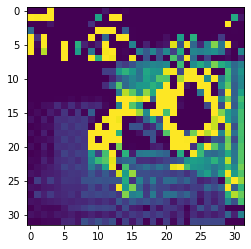

epoch 33500


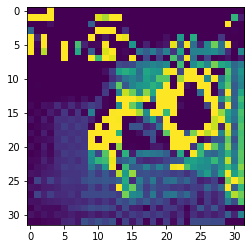

epoch 34000


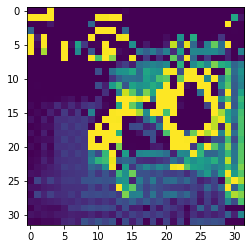

epoch 34500


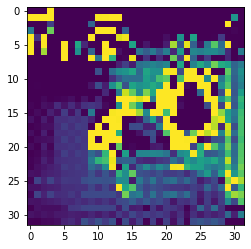

epoch 35000


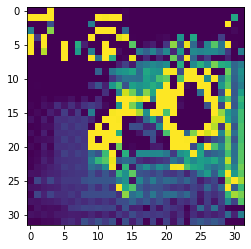

epoch 35500


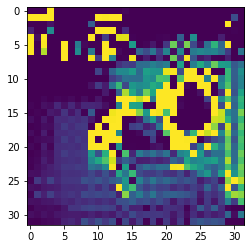

epoch 36000


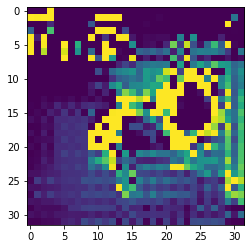

epoch 36500


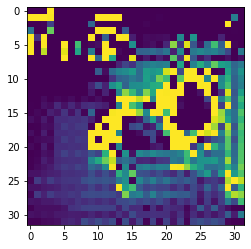

epoch 37000


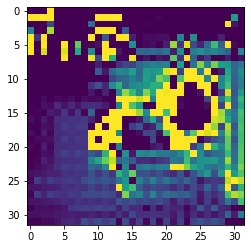

epoch 37500


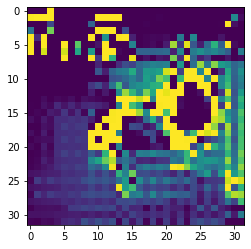

epoch 38000


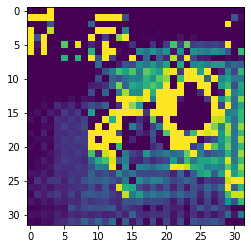

epoch 38500


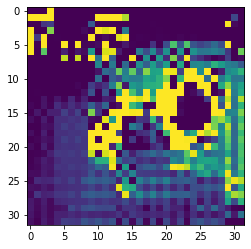

epoch 39000


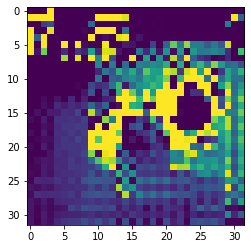

epoch 39500


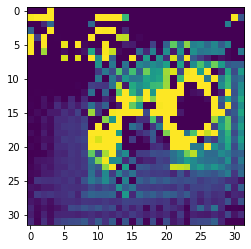

epoch 40000


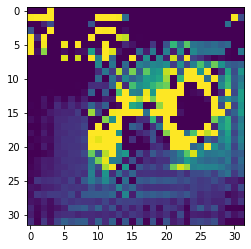

epoch 40500


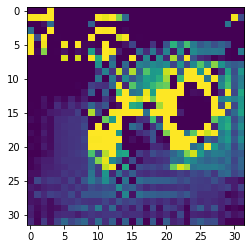

epoch 41000


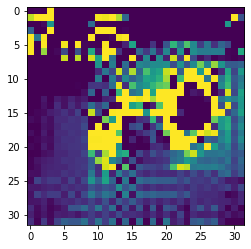

epoch 41500


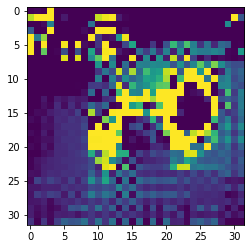

epoch 42000


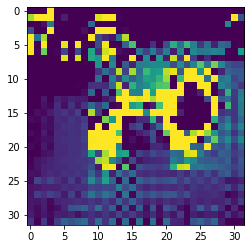

epoch 42500


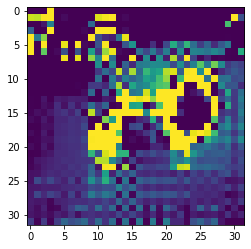

epoch 43000


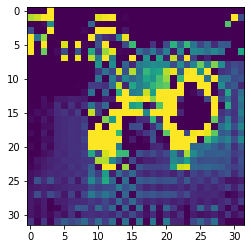

epoch 43500


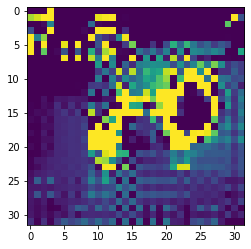

epoch 44000


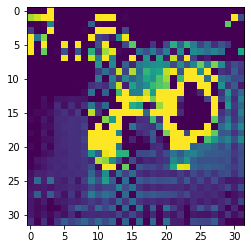

epoch 44500


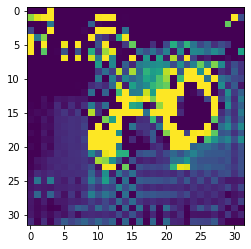

epoch 45000


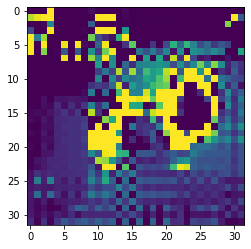

epoch 45500


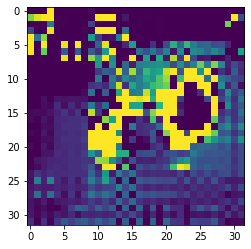

epoch 46000


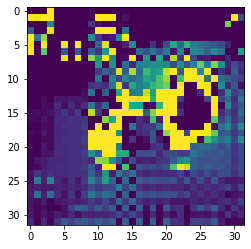

epoch 46500


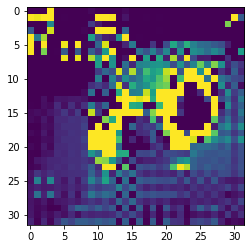

epoch 47000


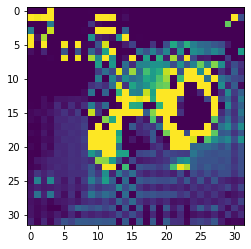

epoch 47500


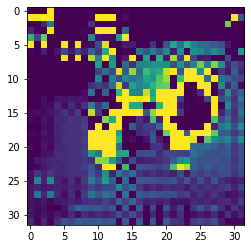

epoch 48000


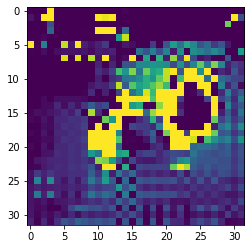

epoch 48500


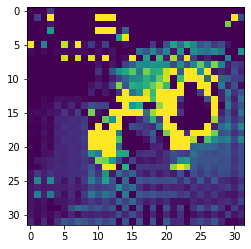

epoch 49000


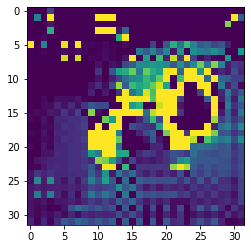

epoch 49500


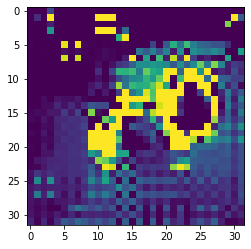

epoch 50000


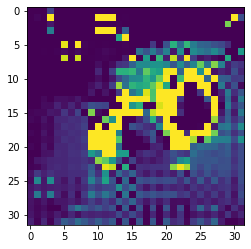

In [ ]:
for i in range(0,100):
  print("epoch {}".format((i+1)*500))
  cond_gan.fit(dataset, epochs = 500, steps_per_epoch = 339//batch_size, verbose = 0)
  trained_gen = cond_gan.generator

  random_latent_vector = tf.random.normal(shape=(1, latent_dim))
  label = keras.utils.to_categorical([0], 4)
  noise_and_labels = tf.concat([random_latent_vector, label], 1)

  fake_image = trained_gen.predict(noise_and_labels)

  plt.imshow(fake_image.reshape(32,32))
  plt.show()

epoch 500


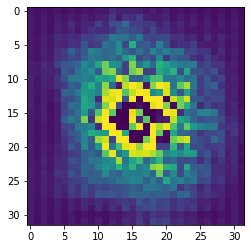

epoch 1000


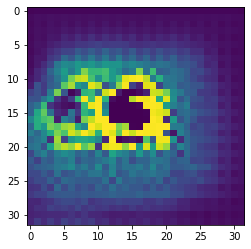

epoch 1500


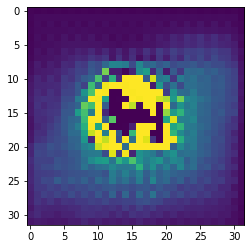

epoch 2000


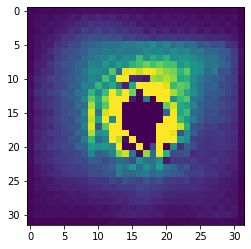

epoch 2500


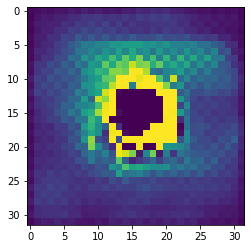

epoch 3000


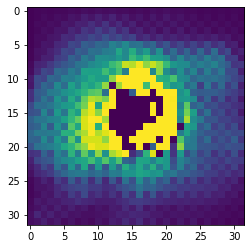

epoch 3500


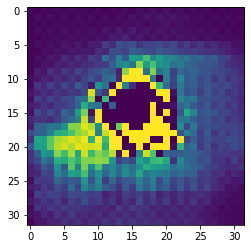

epoch 4000


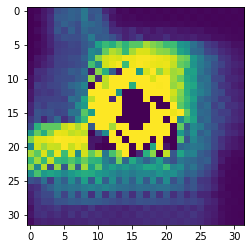

epoch 4500


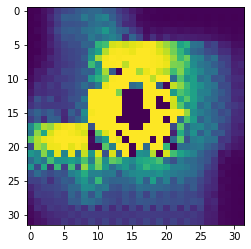

epoch 5000


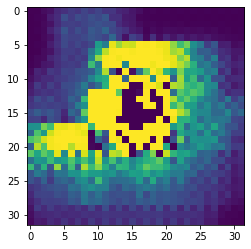

epoch 5500


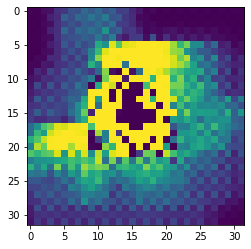

epoch 6000


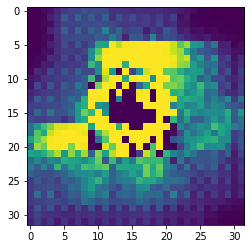

epoch 6500


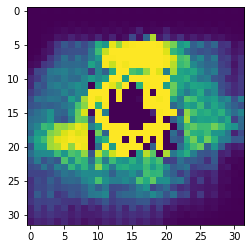

epoch 7000


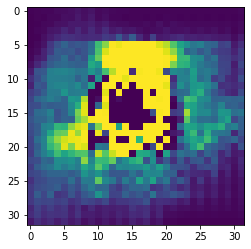

epoch 7500


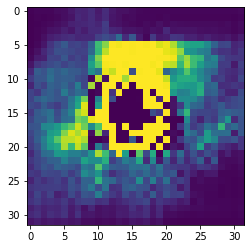

epoch 8000


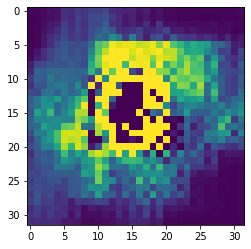

epoch 8500


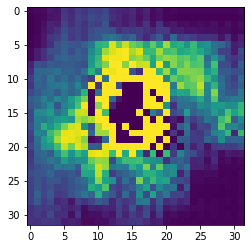

epoch 9000


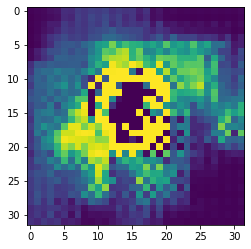

epoch 9500


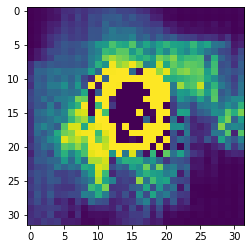

epoch 10000


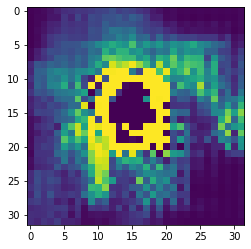

epoch 10500


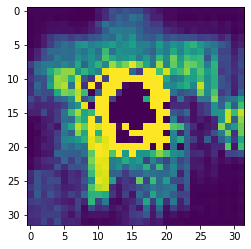

epoch 11000


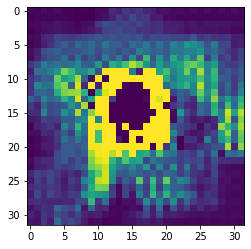

epoch 11500


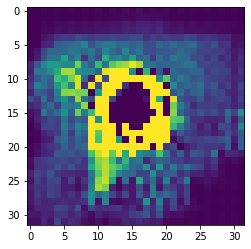

epoch 12000


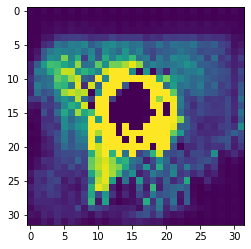

epoch 12500


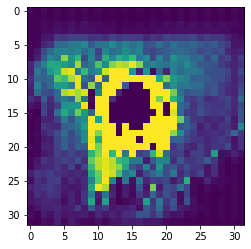

epoch 13000


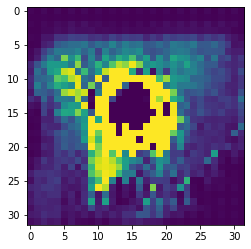

epoch 13500


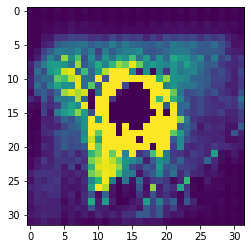

epoch 14000


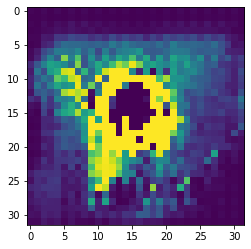

epoch 14500


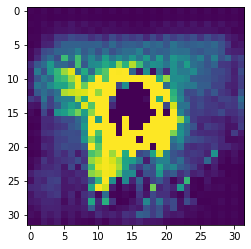

epoch 15000


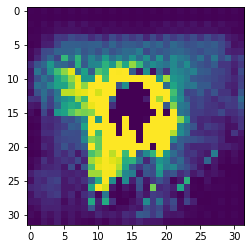

epoch 15500


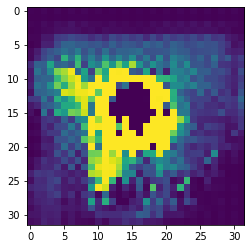

epoch 16000


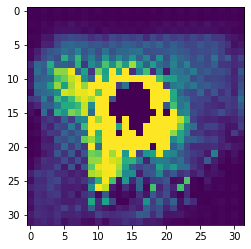

epoch 16500


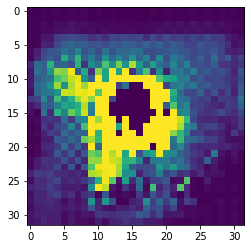

epoch 17000


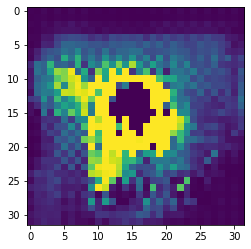

epoch 17500


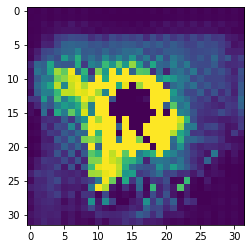

epoch 18000


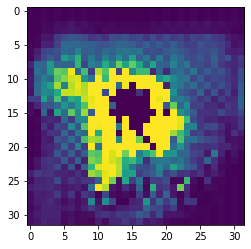

epoch 18500


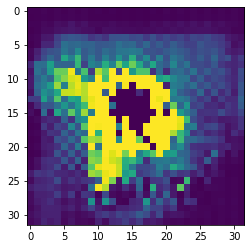

epoch 19000


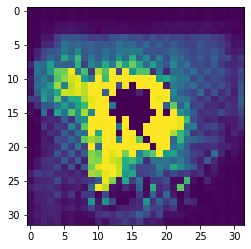

epoch 19500


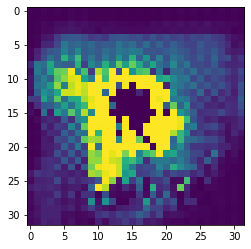

epoch 20000


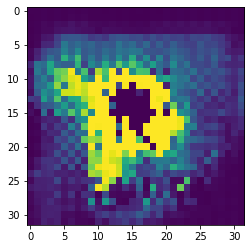

epoch 20500


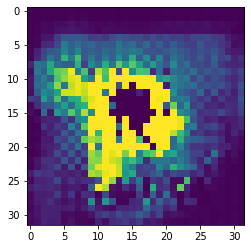

epoch 21000


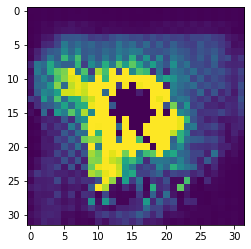

epoch 21500


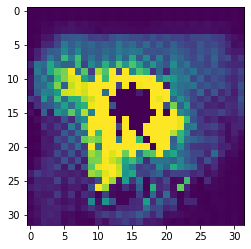

epoch 22000


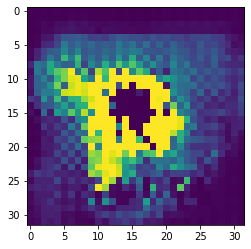

epoch 22500


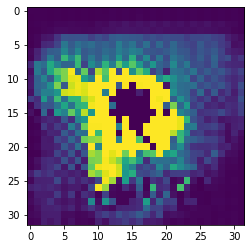

epoch 23000


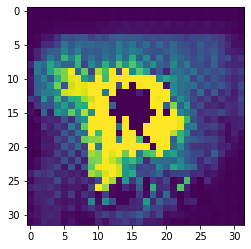

epoch 23500


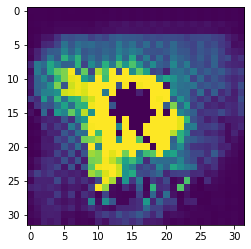

epoch 24000


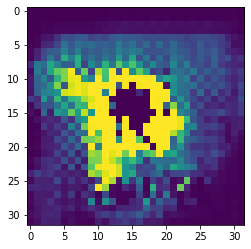

epoch 24500


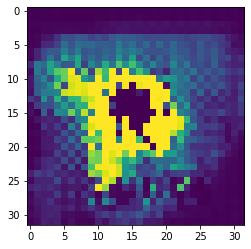

epoch 25000


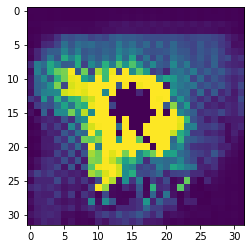

epoch 25500


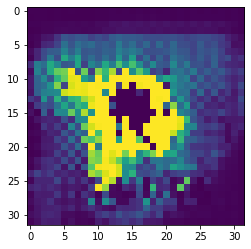

epoch 26000


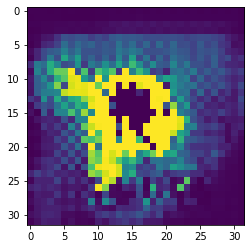

epoch 26500


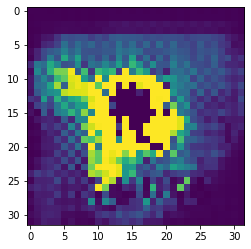

epoch 27000


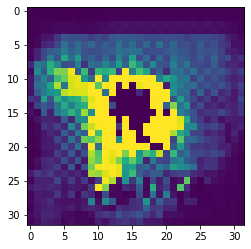

epoch 27500


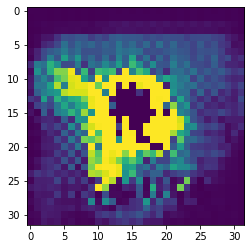

epoch 28000


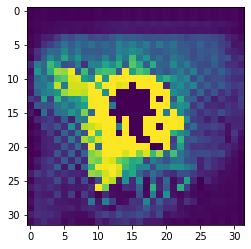

epoch 28500


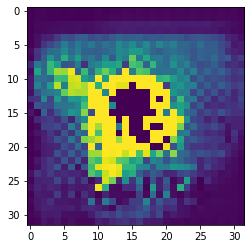

epoch 29000


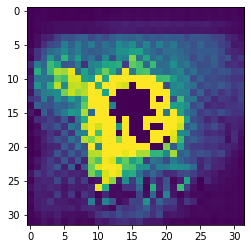

epoch 29500


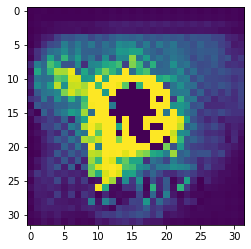

epoch 30000


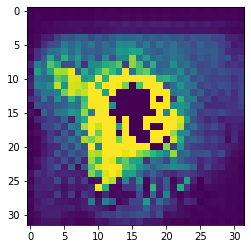

epoch 30500


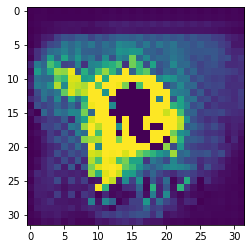

epoch 31000


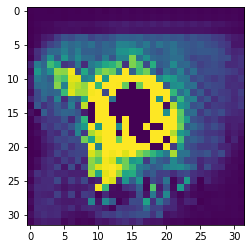

epoch 31500


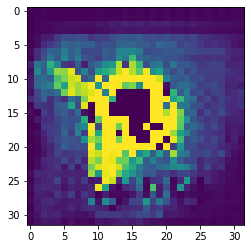

epoch 32000


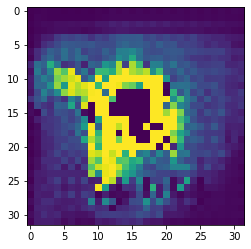

epoch 32500


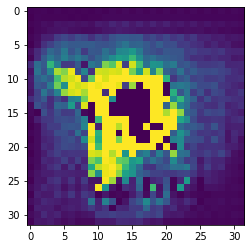

epoch 33000


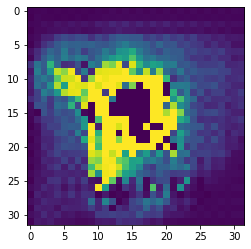

epoch 33500


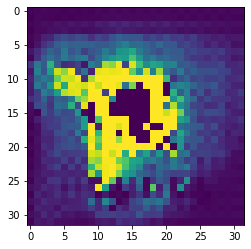

epoch 34000


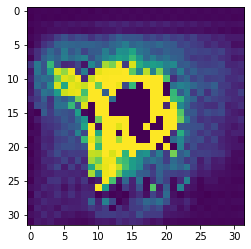

epoch 34500


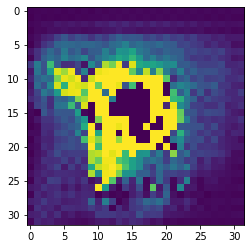

epoch 35000


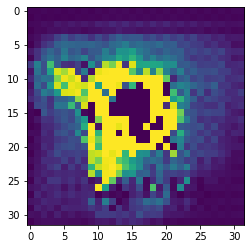

epoch 35500


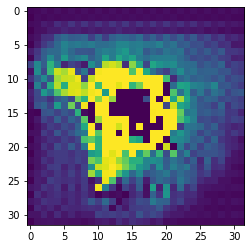

epoch 36000


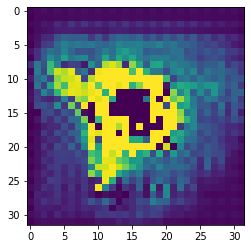

epoch 36500


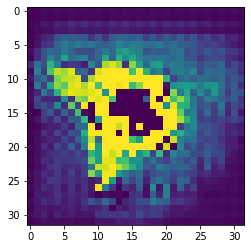

epoch 37000


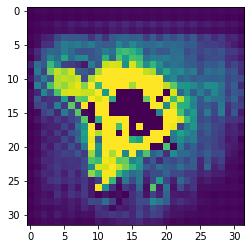

epoch 37500


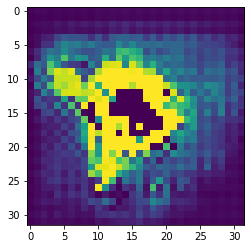

epoch 38000


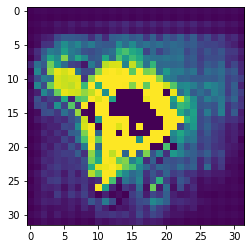

epoch 38500


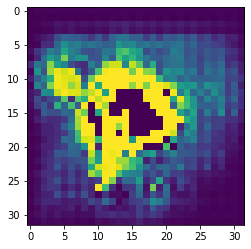

epoch 39000


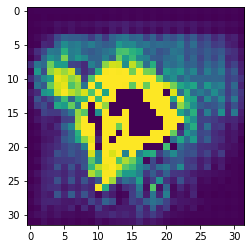

epoch 39500


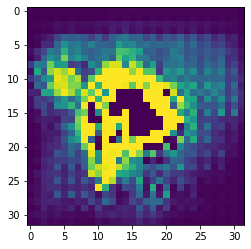

epoch 40000


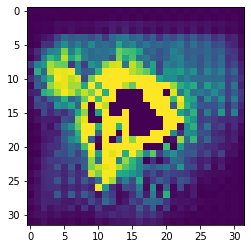

epoch 40500


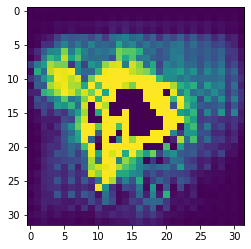

epoch 41000


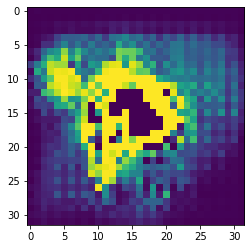

epoch 41500


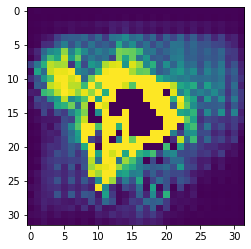

epoch 42000


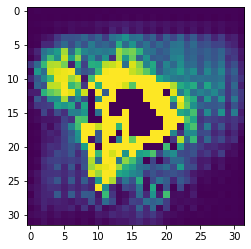

epoch 42500


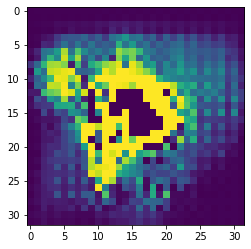

epoch 43000


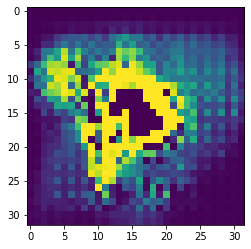

epoch 43500


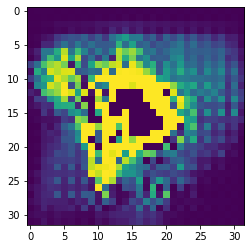

epoch 44000


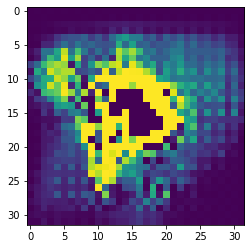

epoch 44500


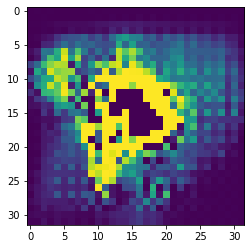

epoch 45000


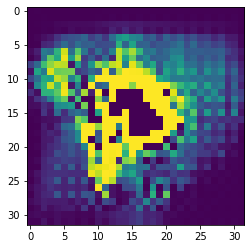

epoch 45500


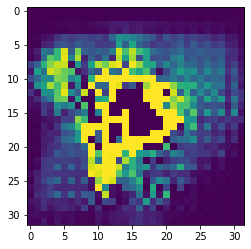

epoch 46000


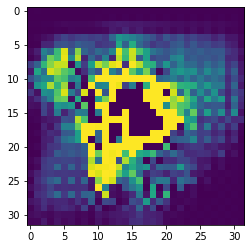

epoch 46500


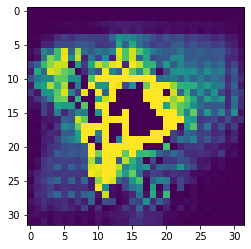

epoch 47000


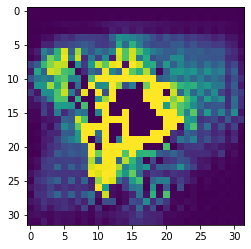

epoch 47500


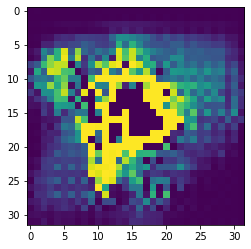

epoch 48000


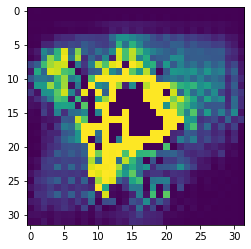

epoch 48500


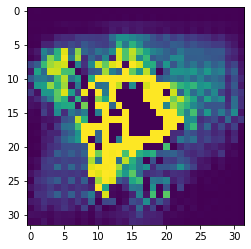

epoch 49000


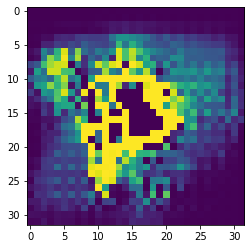

epoch 49500


In [ ]:
for i in range(0,300):
  print("epoch {}".format((i+1)*500))
  cond_gan.fit(dataset, epochs = 500, steps_per_epoch = 339//batch_size,verbose=0)
  trained_gen = cond_gan.generator

  random_latent_vector = tf.random.normal(shape=(1, latent_dim))
  label = keras.utils.to_categorical([0], 4)
  noise_and_labels = tf.concat([random_latent_vector, label], 1)

  fake_image = trained_gen.predict(noise_and_labels)

  plt.imshow(fake_image.reshape(32,32))
  plt.show()

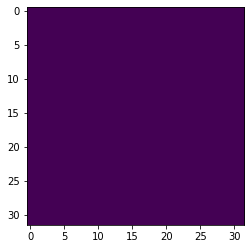

In [ ]:
trained_gen = cond_gan.generator

random_latent_vector = tf.random.normal(shape=(1, latent_dim))
label = keras.utils.to_categorical([0], 4)
noise_and_labels = tf.concat([random_latent_vector, label], 1)

fake_image = trained_gen.predict(noise_and_labels)

plt.imshow(fake_image.reshape(32,32))

In [ ]:
#vvv this is not stuff we wanna use

0.0005
5
----RETRIEVING DATA----
0.0%
40.0%
60.0%
----DONE----


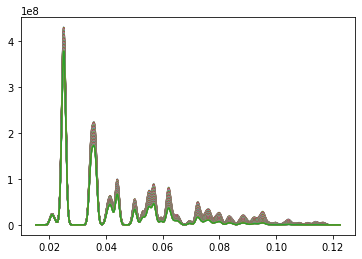

Have 73 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
40.0%
60.0%
----DONE----
17520
(17520, 150, 150, 1)
(17520, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
526/526 [==============================] - 8s 12ms/step - loss: 0.0317 - linear_regression_equality: 0.0124 - val_loss: 1.0637e-04 - val_linear_regression_equality: 0.0124
Epoch 2/10
526/526 [==============================] - 6s 12ms/step - loss: 5.5989e-05 - linear_regression_equality: 0.0276 - val_loss: 3.6099e-05 - val_linear_regression_equality: 0.0023
Epoch 3/10
526/526 [==============================] - 6s 12ms/step - loss: 1.2759e-05 - linear_regression_equality: 0.0410 - val_loss: 1.4165e-06 - val_linear_regression_equality: 0.1932
Epoch 4/10
526/526 [==============================] - 6s 12ms/step - loss: 7.0441e-06 - linear_regression_equality: 0.0493 - val_loss: 1.5403e-06 - val_linear_regression_equality: 0.1311
Epoch 5/10
526/526 [=============================

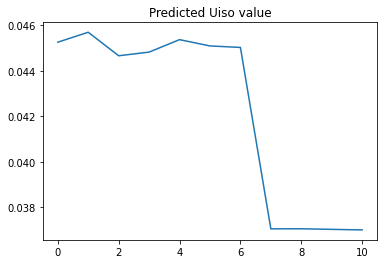

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


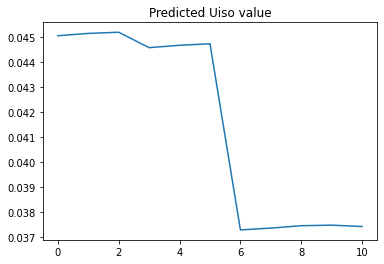

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

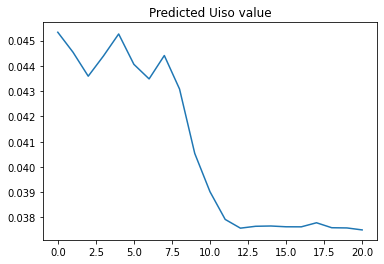

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

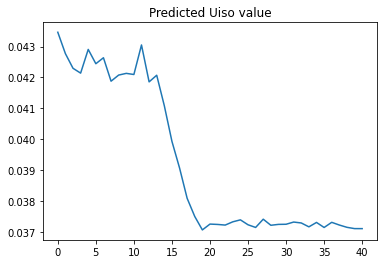

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

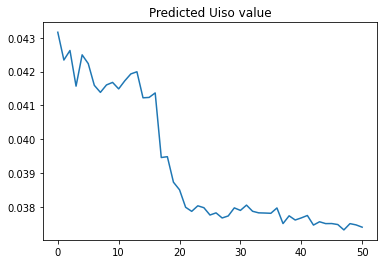

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


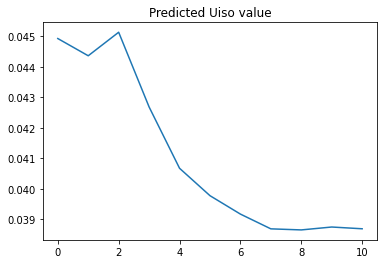

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

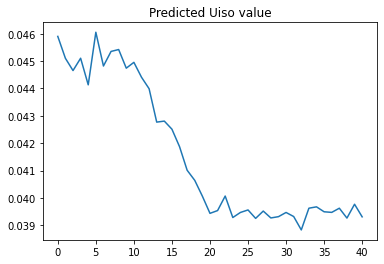

7
7
7
7
7
7
7


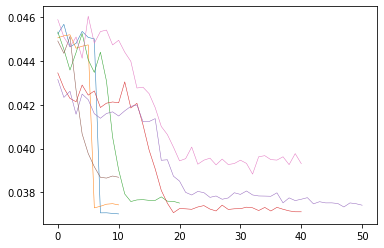

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


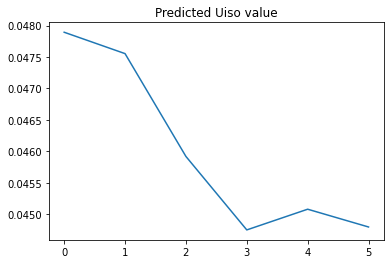

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

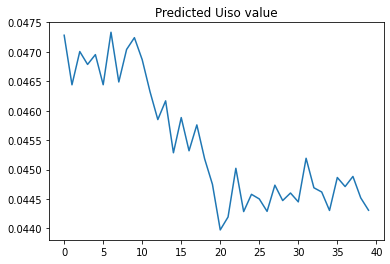

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


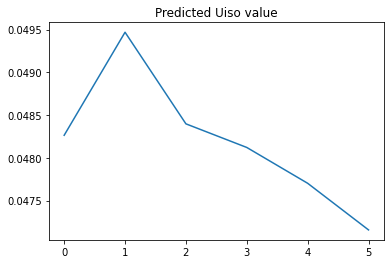

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

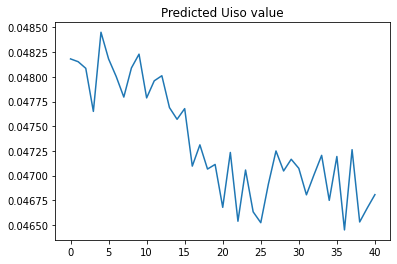

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


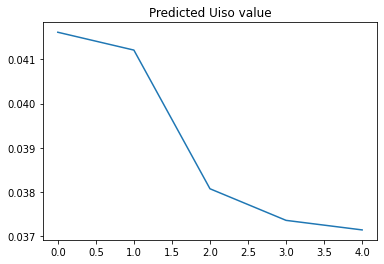

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

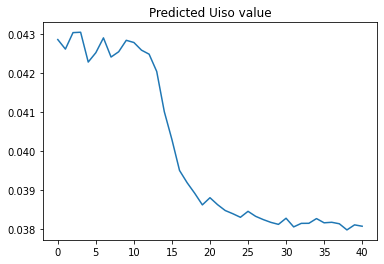

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


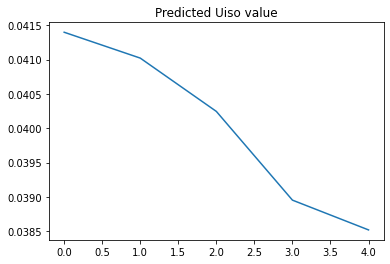

7
7
7
7
7
7
7


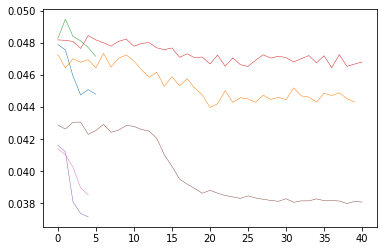

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


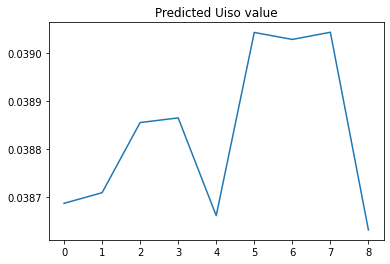

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


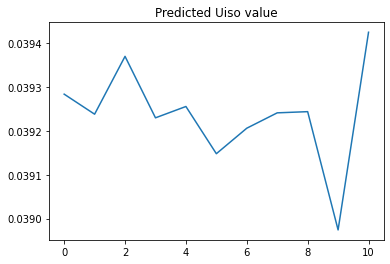

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

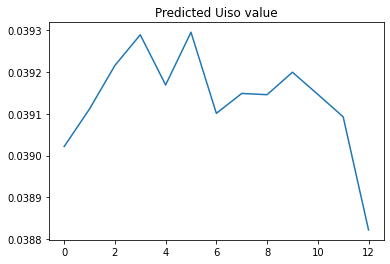

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

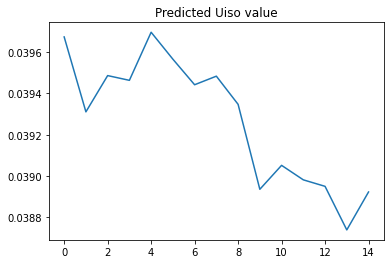

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

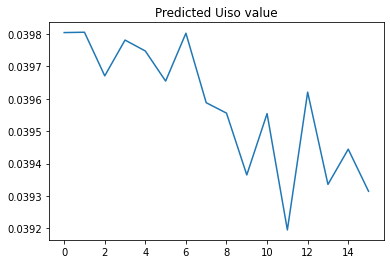

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

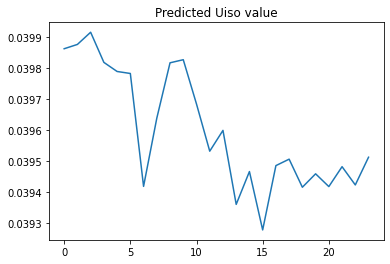

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

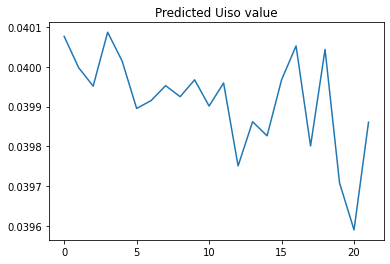

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

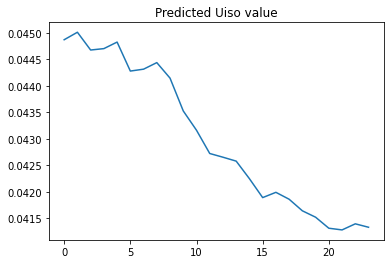

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

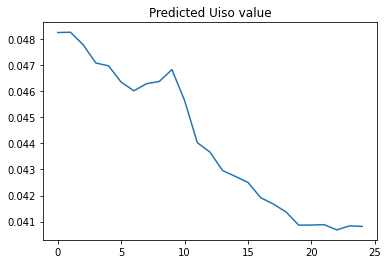

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

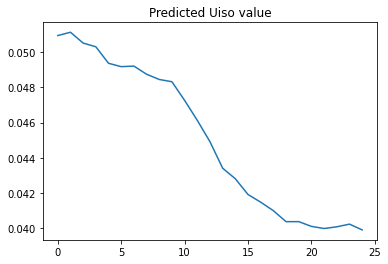

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

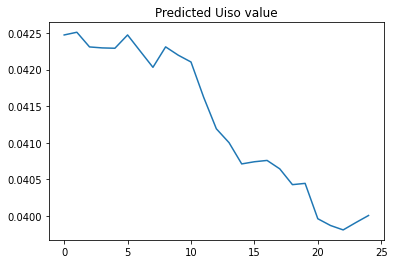

11
11
11
11
11
11
11
11
11
11
11


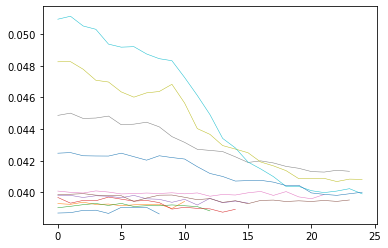

0.0005
10
----RETRIEVING DATA----
0.0%
40.0%
60.0%
----DONE----


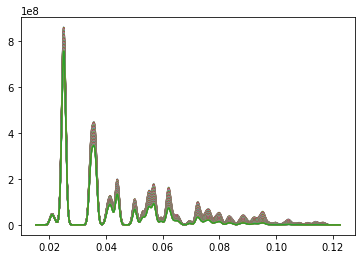

Have 73 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
40.0%
60.0%
----DONE----
17520
(17520, 150, 150, 1)
(17520, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
526/526 [==============================] - 7s 13ms/step - loss: 0.6753 - linear_regression_equality: 0.0127 - val_loss: 1.1019e-04 - val_linear_regression_equality: 0.0090
Epoch 2/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1501e-04 - linear_regression_equality: 0.0143 - val_loss: 1.0972e-04 - val_linear_regression_equality: 0.0116
Epoch 3/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1383e-04 - linear_regression_equality: 0.0150 - val_loss: 1.0984e-04 - val_linear_regression_equality: 0.0169
Epoch 4/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1334e-04 - linear_regression_equality: 0.0141 - val_loss: 1.1069e-04 - val_linear_regression_equality: 0.0130
Epoch 5/10
526/526 [=============================

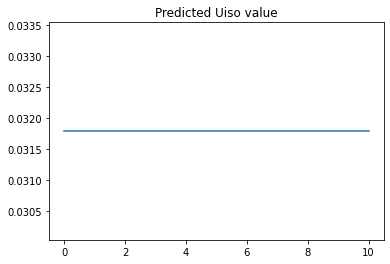

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


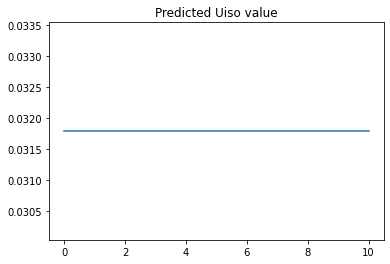

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

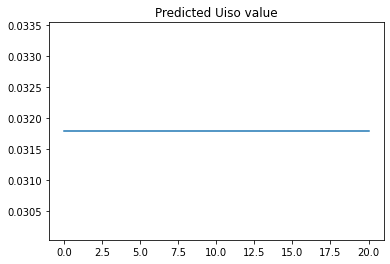

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

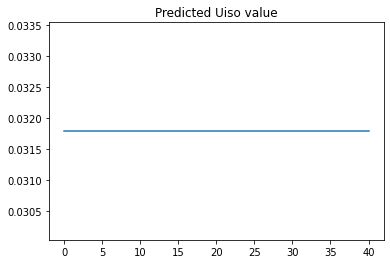

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

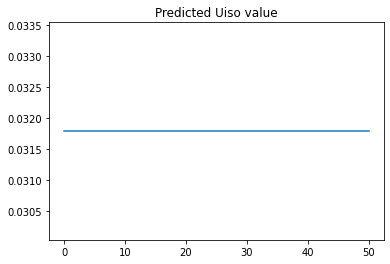

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


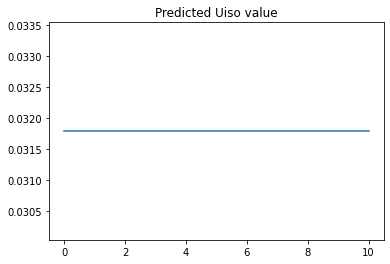

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

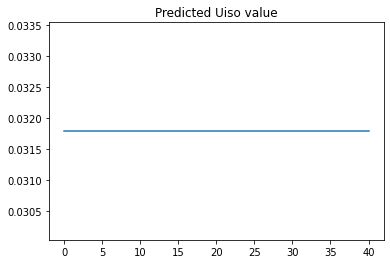

7
7
7
7
7
7
7


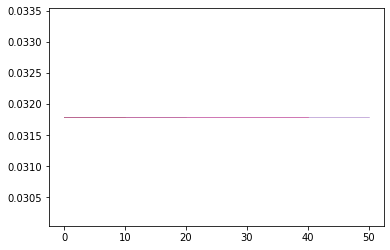

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


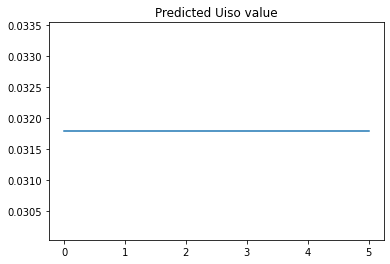

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

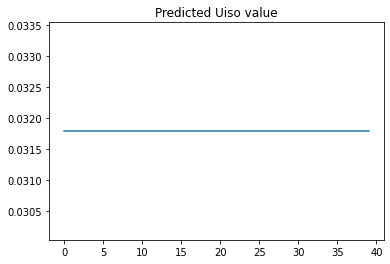

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


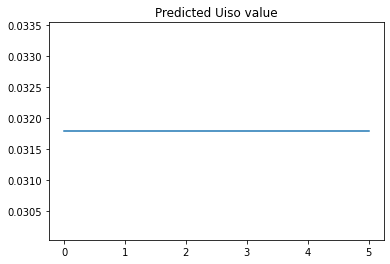

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

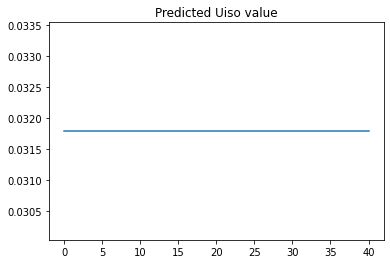

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


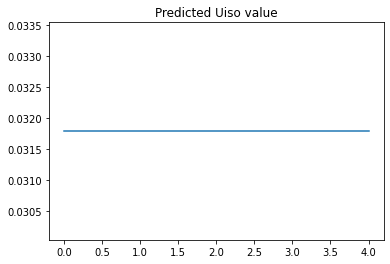

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

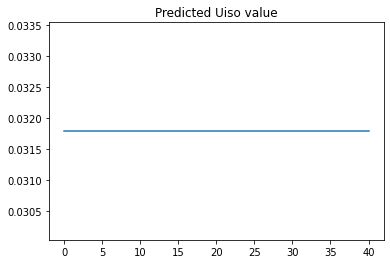

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


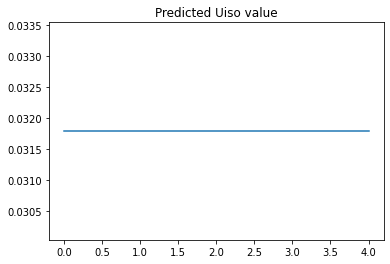

7
7
7
7
7
7
7


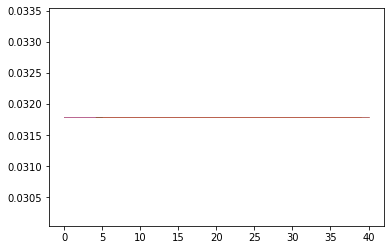

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


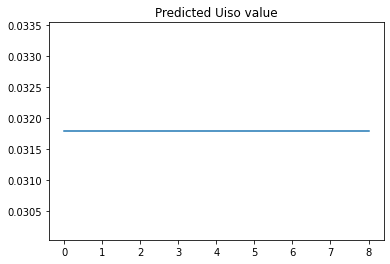

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


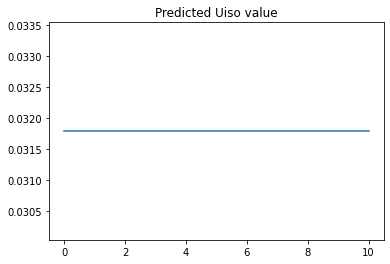

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

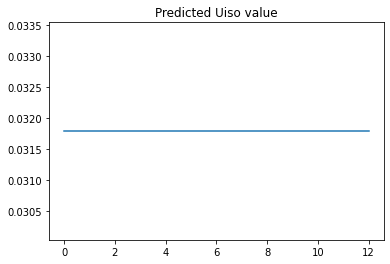

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

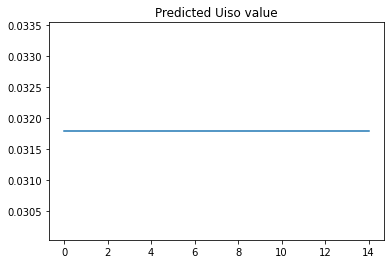

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

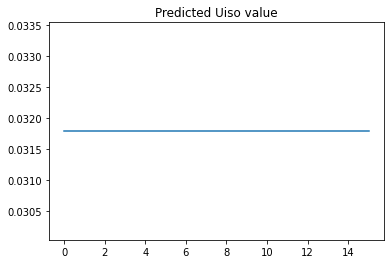

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

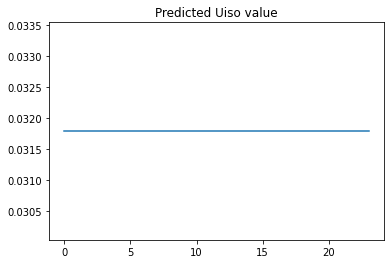

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

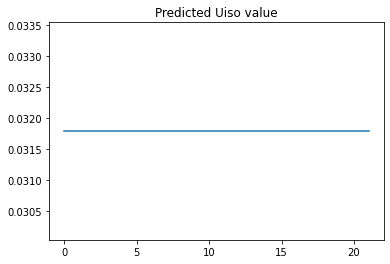

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

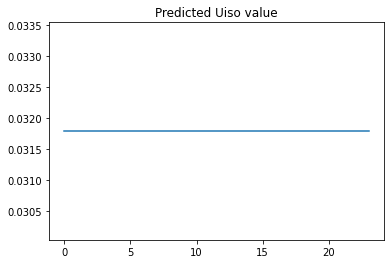

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

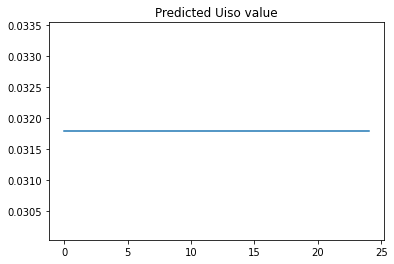

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

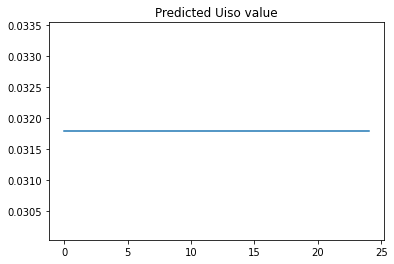

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

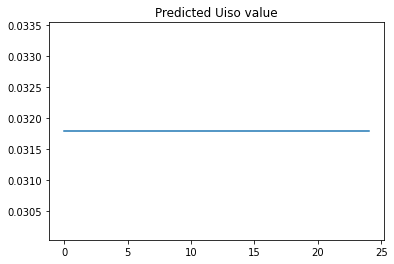

11
11
11
11
11
11
11
11
11
11
11


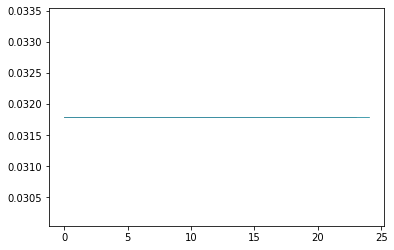

0.0005
20
----RETRIEVING DATA----
0.0%
40.0%
60.0%
----DONE----


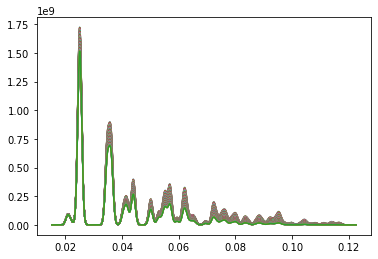

Have 73 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
40.0%
60.0%
----DONE----
17520
(17520, 150, 150, 1)
(17520, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
526/526 [==============================] - 8s 13ms/step - loss: 5.6577 - linear_regression_equality: 0.0094 - val_loss: 1.3096e-04 - val_linear_regression_equality: 0.0147
Epoch 2/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1423e-04 - linear_regression_equality: 0.0117 - val_loss: 1.2750e-04 - val_linear_regression_equality: 0.0147
Epoch 3/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1354e-04 - linear_regression_equality: 0.0137 - val_loss: 1.1128e-04 - val_linear_regression_equality: 0.0124
Epoch 4/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1256e-04 - linear_regression_equality: 0.0138 - val_loss: 1.1221e-04 - val_linear_regression_equality: 0.0175
Epoch 5/10
526/526 [=============================

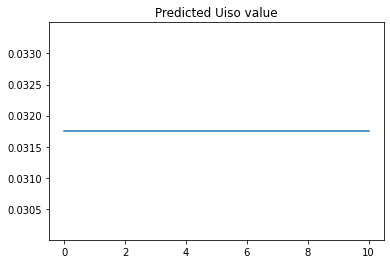

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


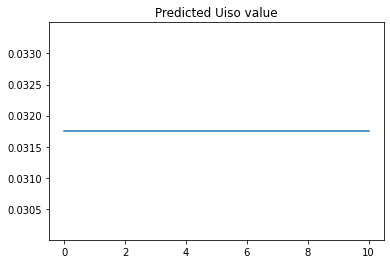

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

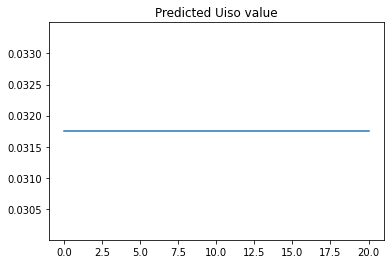

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

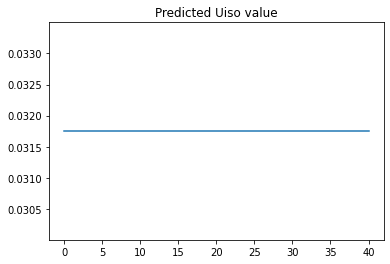

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

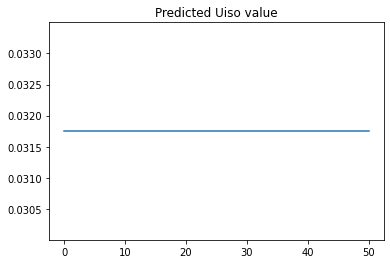

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


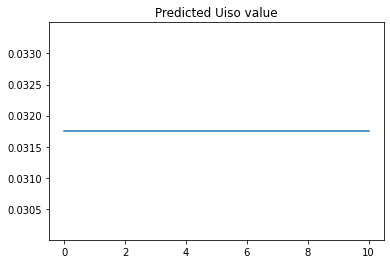

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

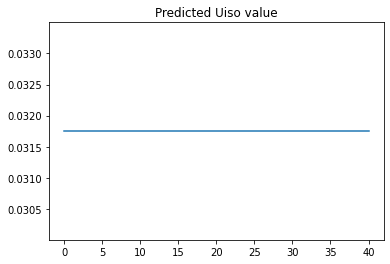

7
7
7
7
7
7
7


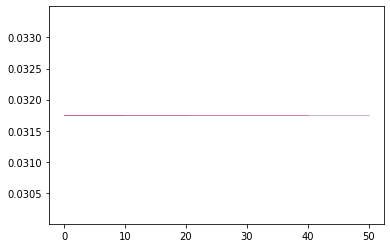

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


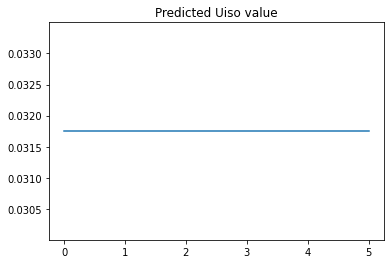

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

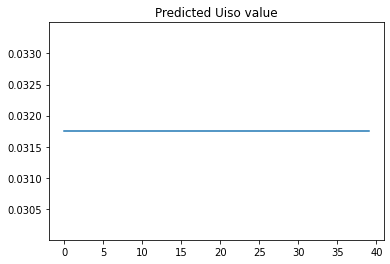

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


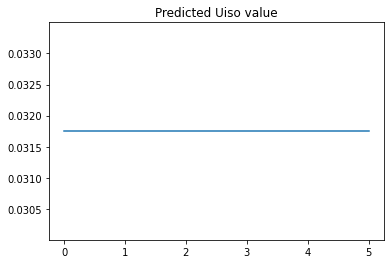

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

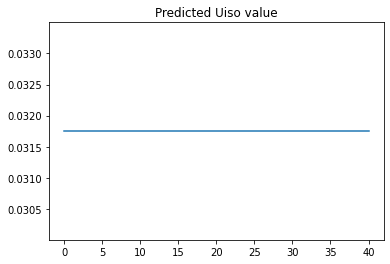

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


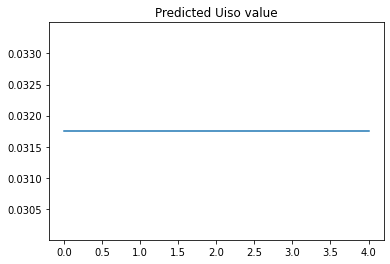

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

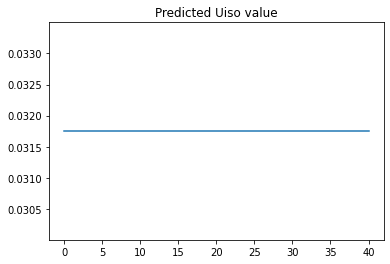

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


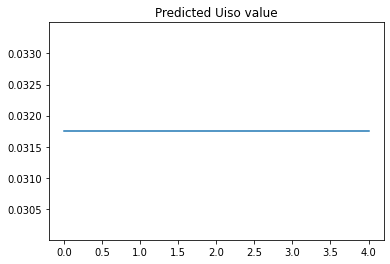

7
7
7
7
7
7
7


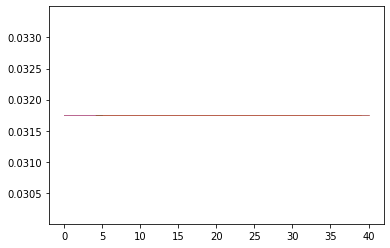

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


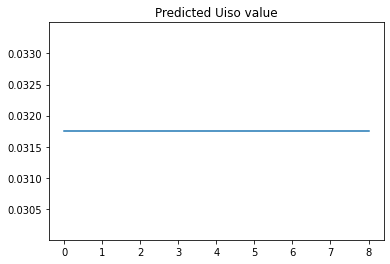

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


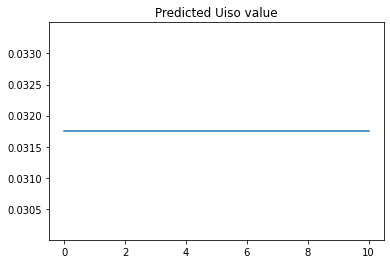

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

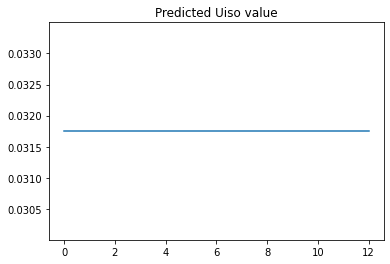

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

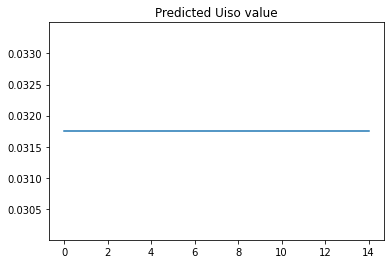

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

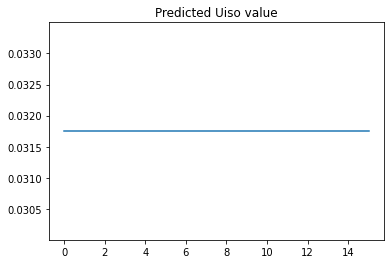

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

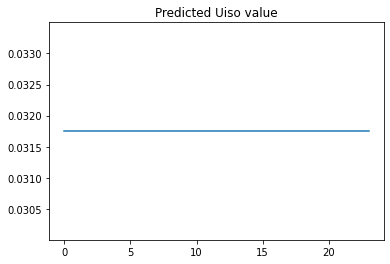

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

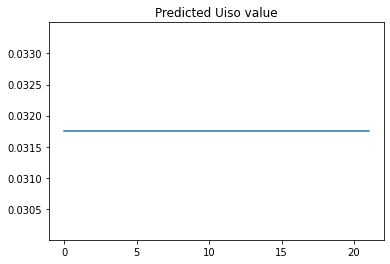

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

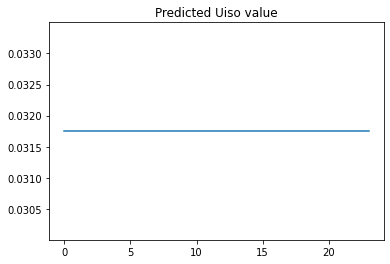

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

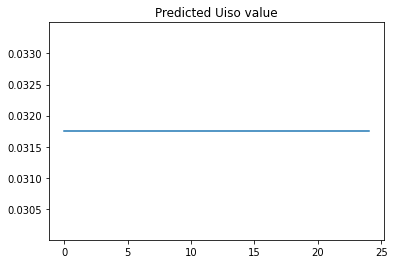

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

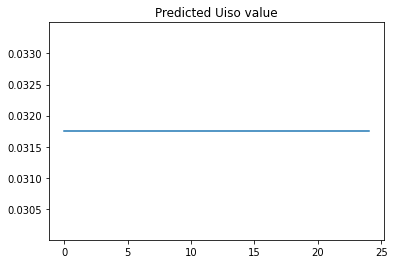

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

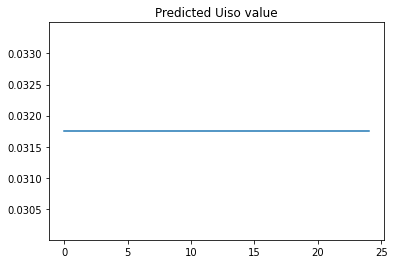

11
11
11
11
11
11
11
11
11
11
11


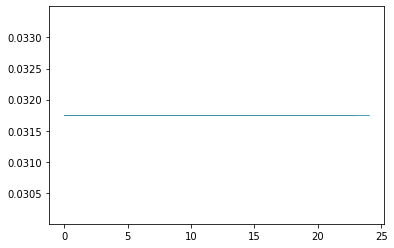

0.0005
50
----RETRIEVING DATA----
0.0%
40.0%
60.0%
----DONE----


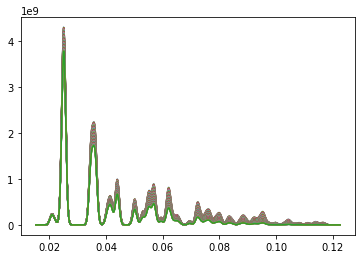

Have 73 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
40.0%
60.0%
----DONE----
17520
(17520, 150, 150, 1)
(17520, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
526/526 [==============================] - 8s 13ms/step - loss: 43.0439 - linear_regression_equality: 0.0091 - val_loss: 1.4265e-04 - val_linear_regression_equality: 0.0136
Epoch 2/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1356e-04 - linear_regression_equality: 0.0123 - val_loss: 1.1163e-04 - val_linear_regression_equality: 0.0169
Epoch 3/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1307e-04 - linear_regression_equality: 0.0134 - val_loss: 1.1209e-04 - val_linear_regression_equality: 0.0141
Epoch 4/10
526/526 [==============================] - 6s 12ms/step - loss: 1.1262e-04 - linear_regression_equality: 0.0138 - val_loss: 1.1152e-04 - val_linear_regression_equality: 0.0169
Epoch 5/10
526/526 [============================

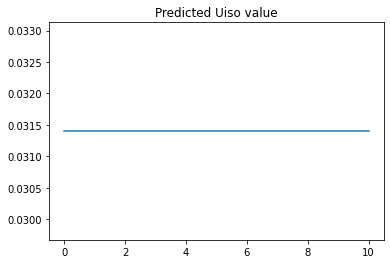

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


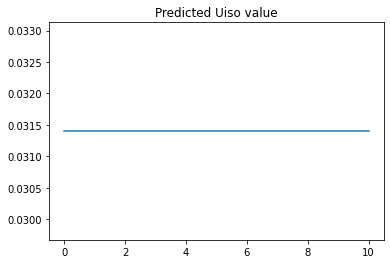

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

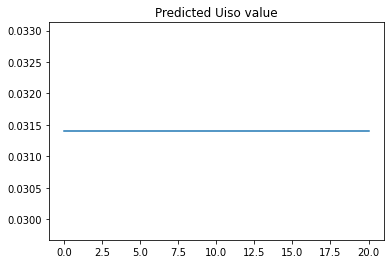

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

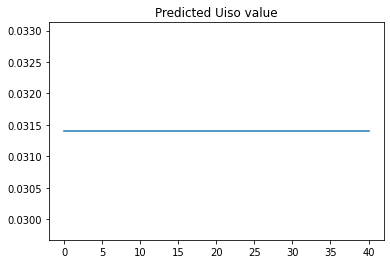

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

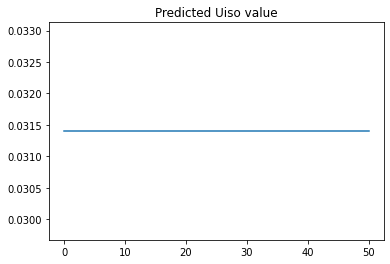

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


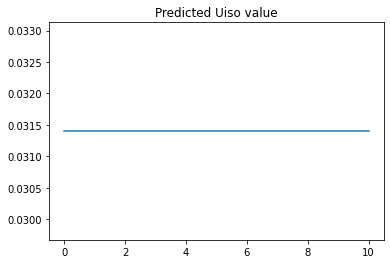

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

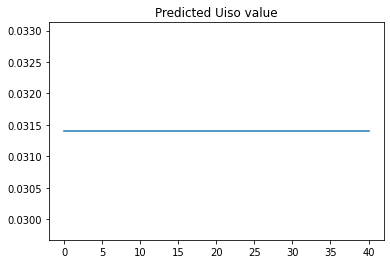

7
7
7
7
7
7
7


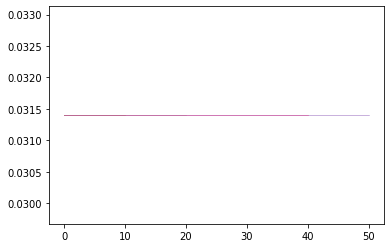

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


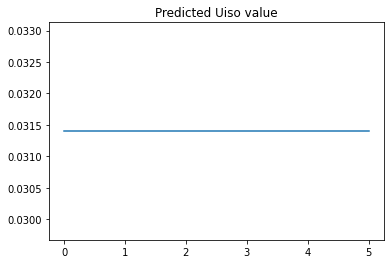

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

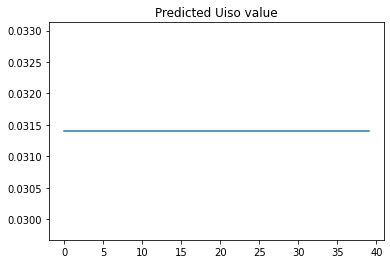

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


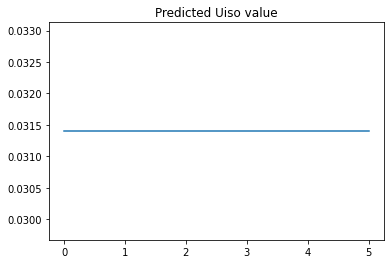

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

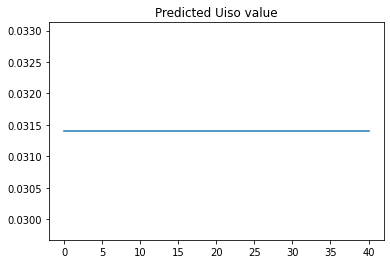

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


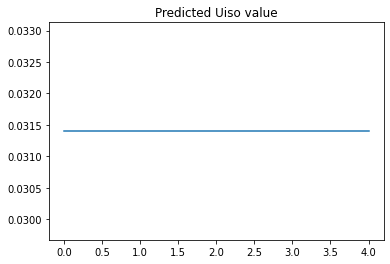

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

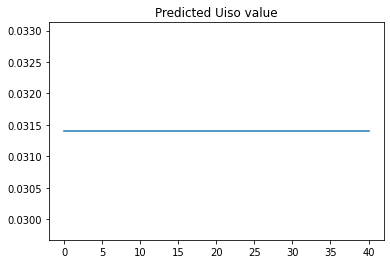

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


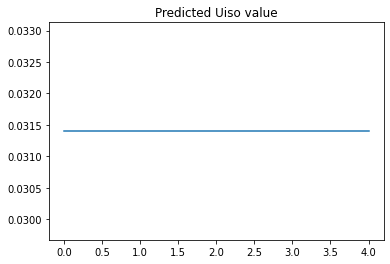

7
7
7
7
7
7
7


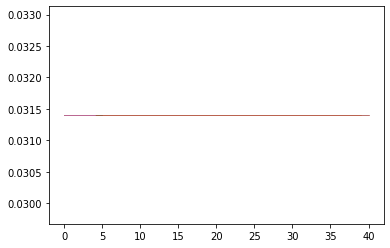

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


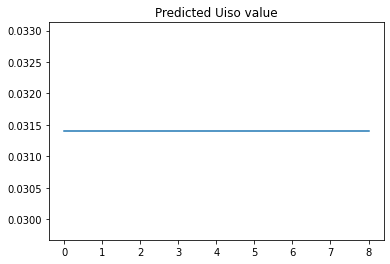

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


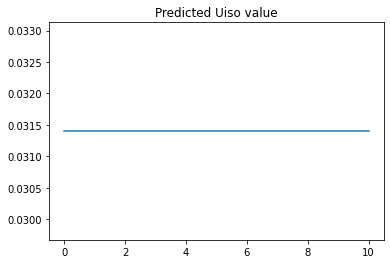

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

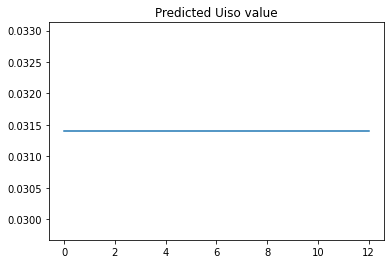

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

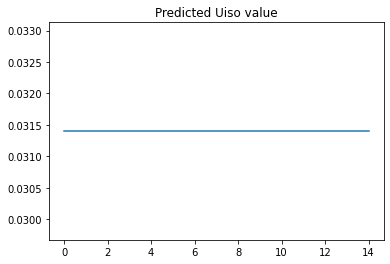

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

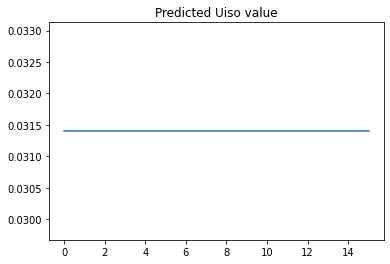

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

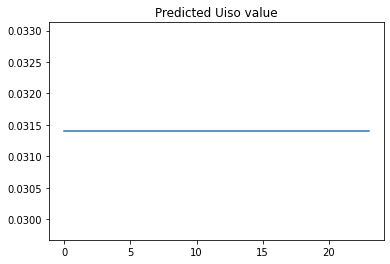

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

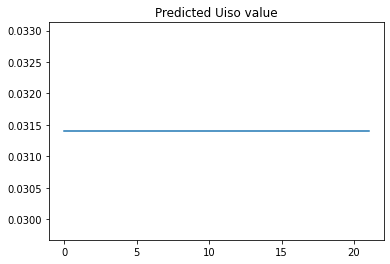

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

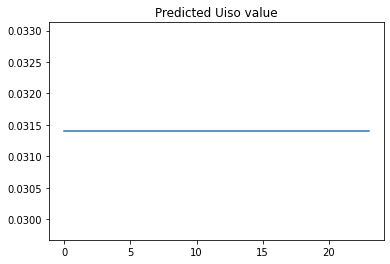

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

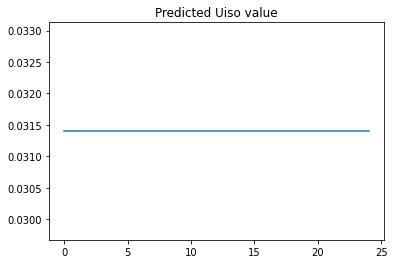

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

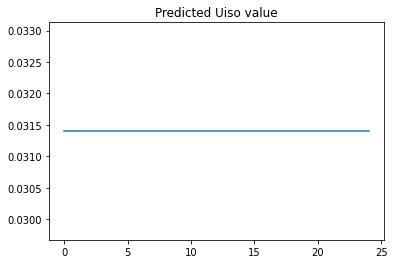

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

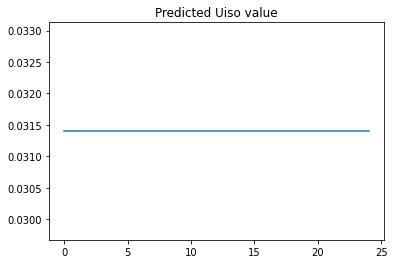

11
11
11
11
11
11
11
11
11
11
11


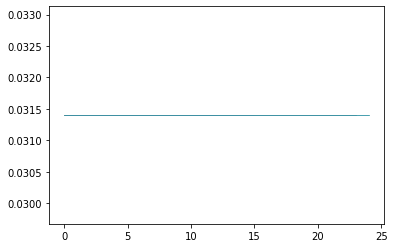

0.001
5
----RETRIEVING DATA----
0.0%
----DONE----


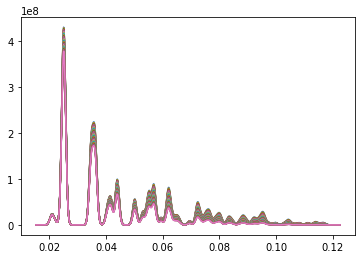

Have 37 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
----DONE----
8880
(8880, 150, 150, 1)
(8880, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
267/267 [==============================] - 5s 13ms/step - loss: 0.2552 - linear_regression_equality: 0.0121 - val_loss: 1.1759e-04 - val_linear_regression_equality: 0.0130
Epoch 2/10
267/267 [==============================] - 3s 12ms/step - loss: 1.1848e-04 - linear_regression_equality: 0.0144 - val_loss: 1.2891e-04 - val_linear_regression_equality: 0.0000e+00
Epoch 3/10
267/267 [==============================] - 3s 12ms/step - loss: 1.1737e-04 - linear_regression_equality: 0.0114 - val_loss: 1.1993e-04 - val_linear_regression_equality: 0.0000e+00
Epoch 4/10
267/267 [==============================] - 3s 12ms/step - loss: 1.1699e-04 - linear_regression_equality: 0.0122 - val_loss: 1.3196e-04 - val_linear_regression_equality: 0.0000e+00
Epoch 5/10
267/267 [==============================] 

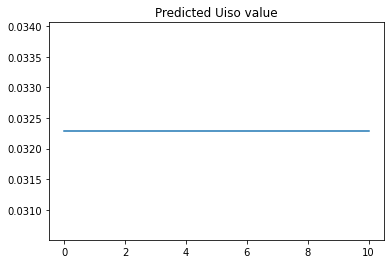

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


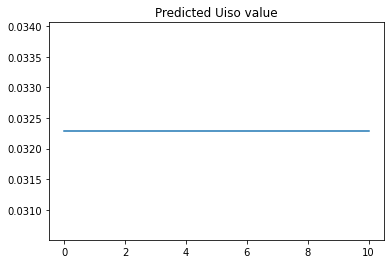

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

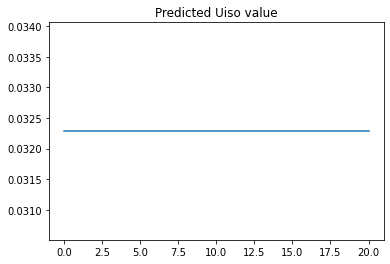

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

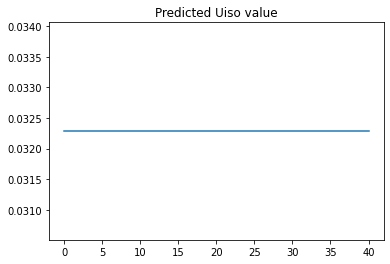

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

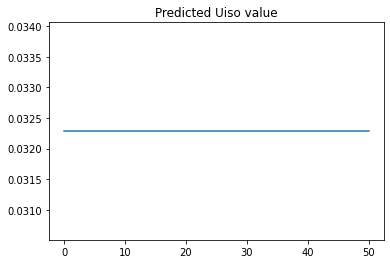

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


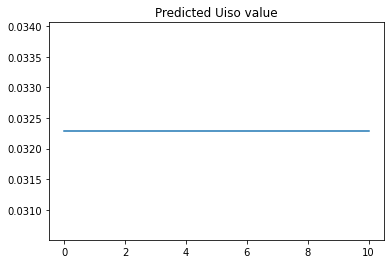

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

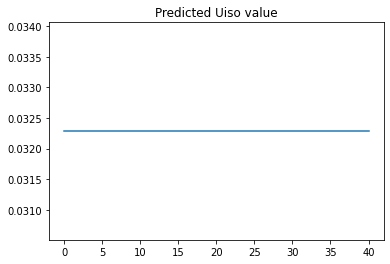

7
7
7
7
7
7
7


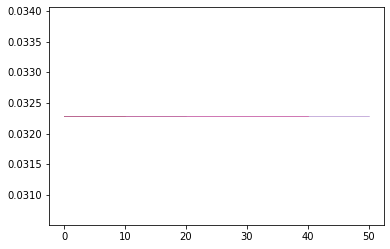

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


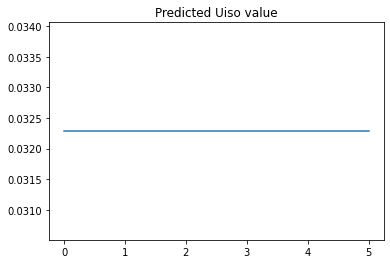

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

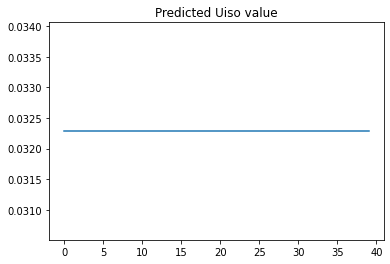

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


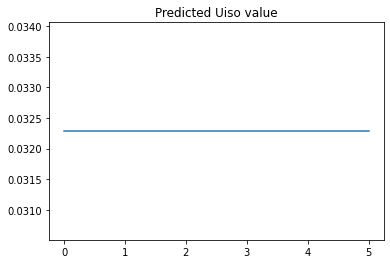

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

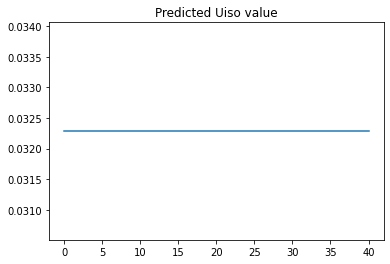

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


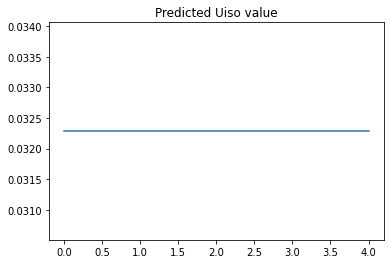

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

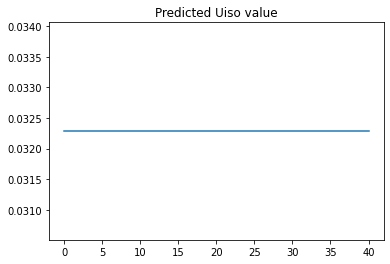

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


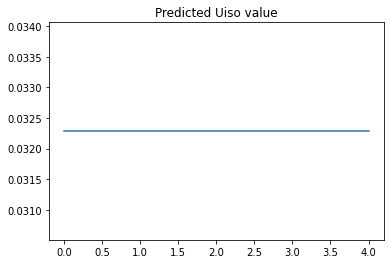

7
7
7
7
7
7
7


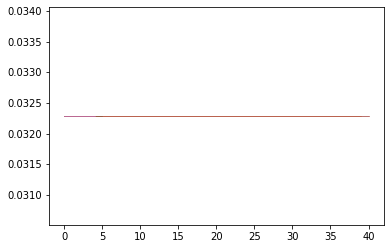

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


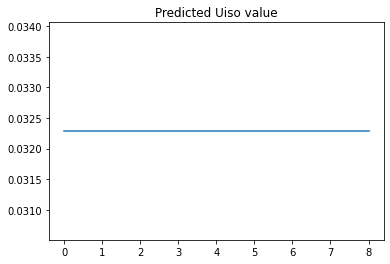

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


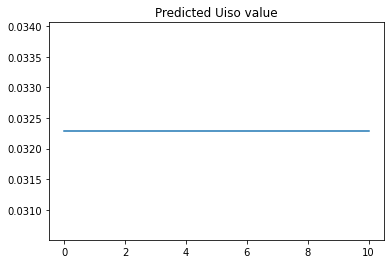

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

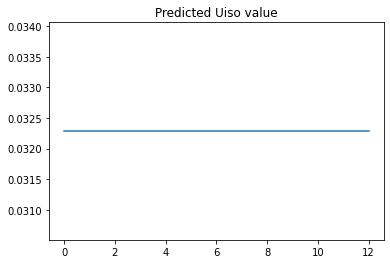

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

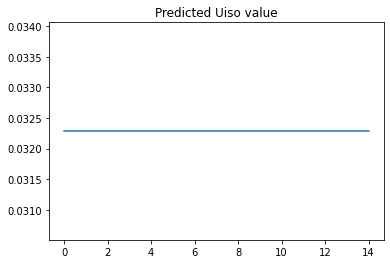

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

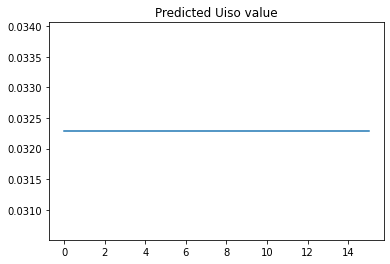

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

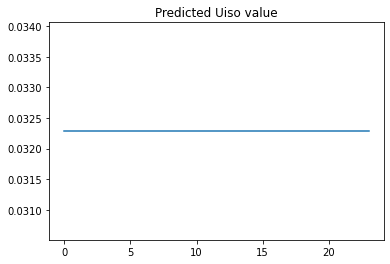

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

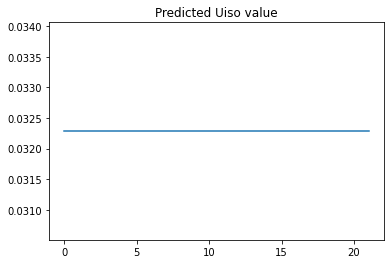

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

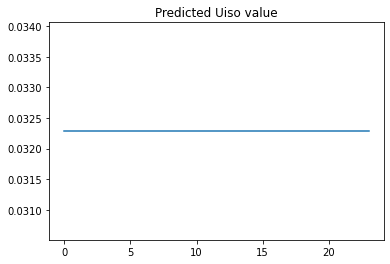

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

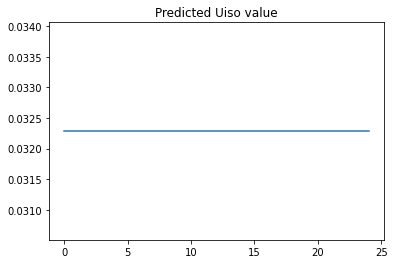

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

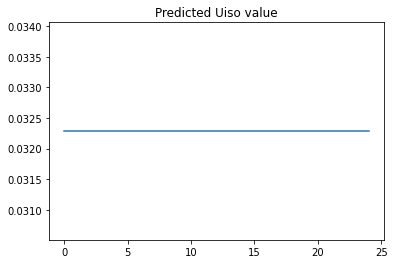

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

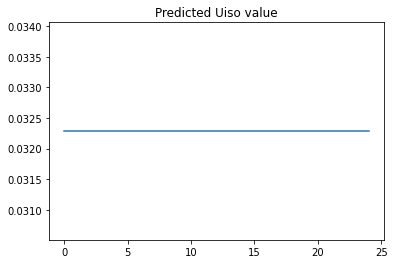

11
11
11
11
11
11
11
11
11
11
11


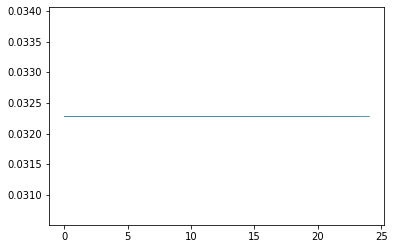

0.001
10
----RETRIEVING DATA----
0.0%
----DONE----


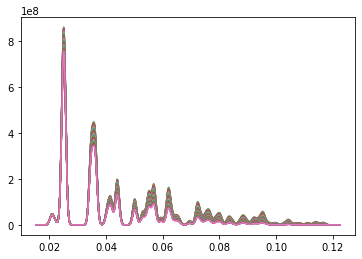

Have 37 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
----DONE----
8880
(8880, 150, 150, 1)
(8880, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
267/267 [==============================] - 4s 13ms/step - loss: 4.0601 - linear_regression_equality: 0.0101 - val_loss: 1.5950e-04 - val_linear_regression_equality: 0.0085
Epoch 2/10
267/267 [==============================] - 3s 12ms/step - loss: 1.3146e-04 - linear_regression_equality: 0.0305 - val_loss: 3.7437e-05 - val_linear_regression_equality: 0.0033
Epoch 3/10
267/267 [==============================] - 3s 12ms/step - loss: 1.7300e-05 - linear_regression_equality: 0.0339 - val_loss: 3.6932e-06 - val_linear_regression_equality: 0.0833
Epoch 4/10
267/267 [==============================] - 3s 12ms/step - loss: 2.0953e-05 - linear_regression_equality: 0.0639 - val_loss: 2.7799e-06 - val_linear_regression_equality: 0.1100
Epoch 5/10
267/267 [==============================] - 3s 12ms/st

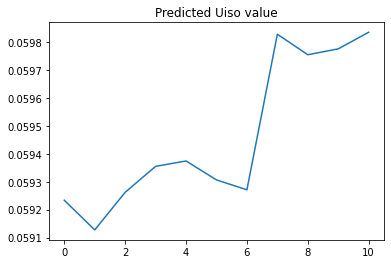

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


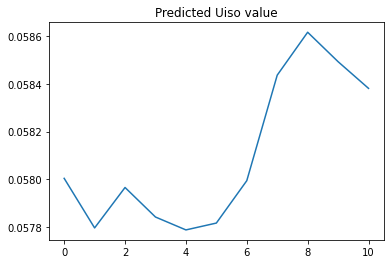

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

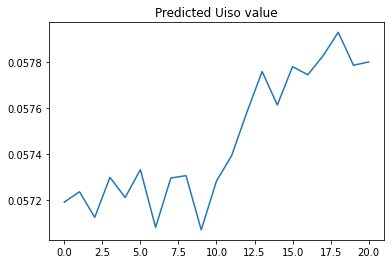

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

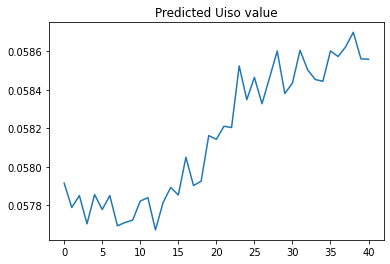

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

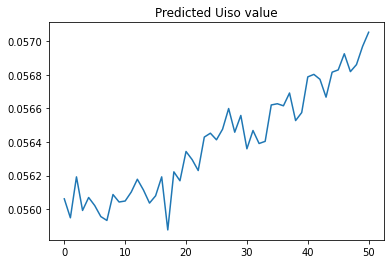

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


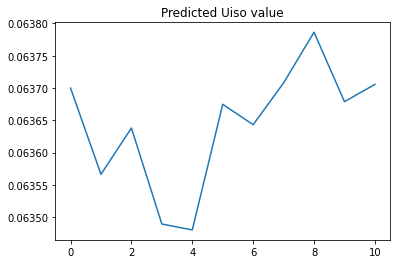

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

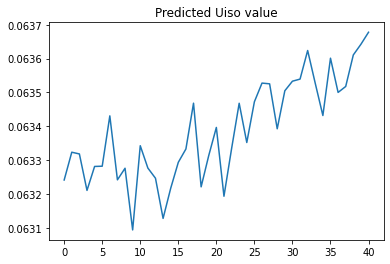

7
7
7
7
7
7
7


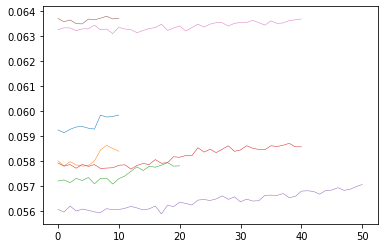

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


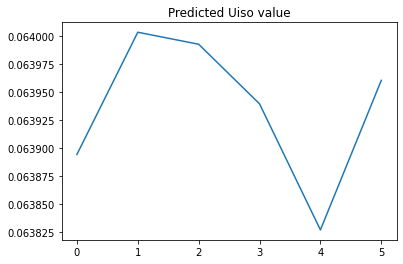

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

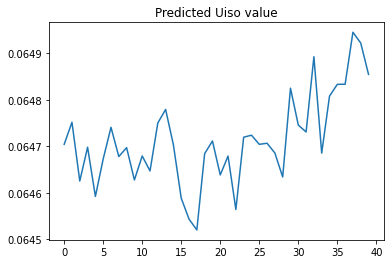

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


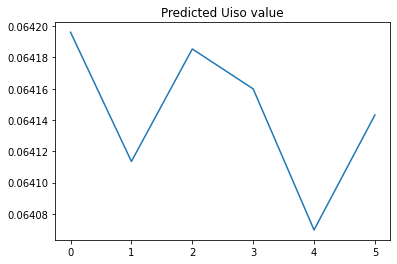

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

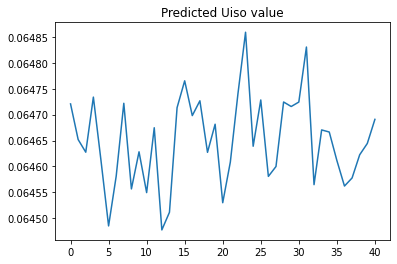

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


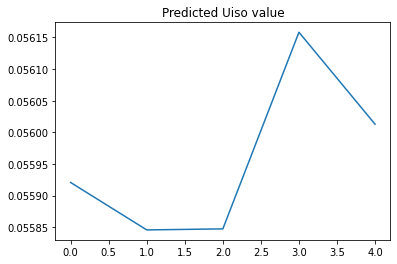

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

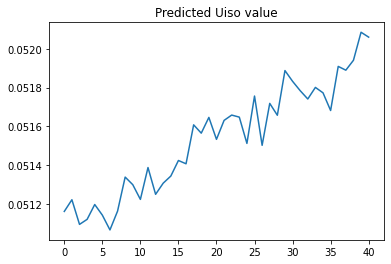

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


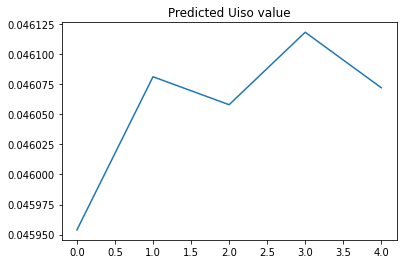

7
7
7
7
7
7
7


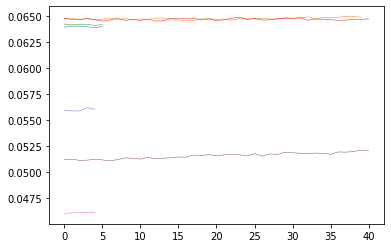

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


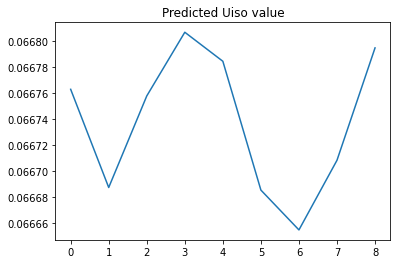

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


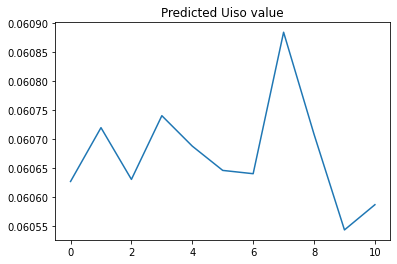

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

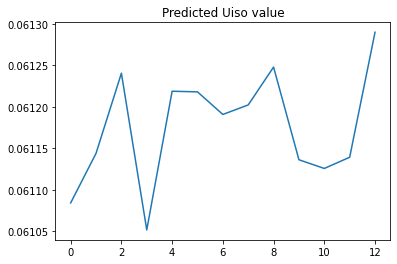

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

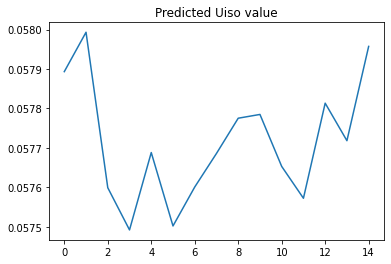

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

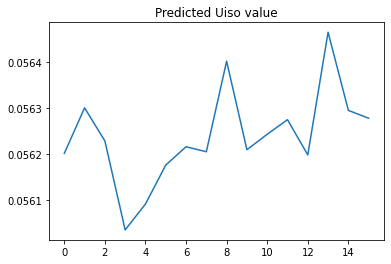

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

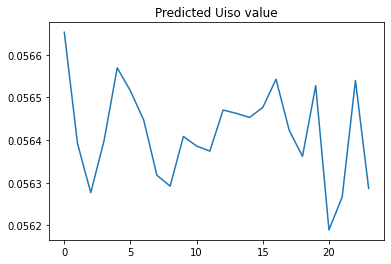

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

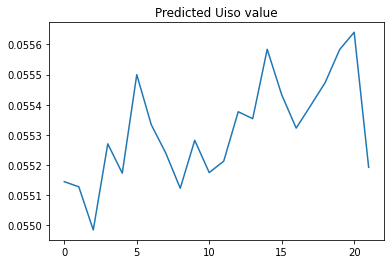

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

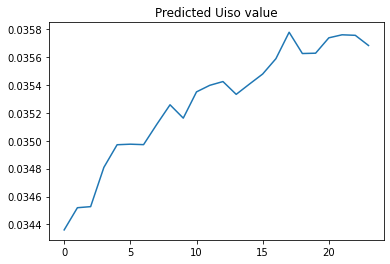

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

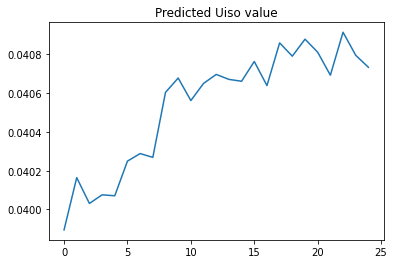

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

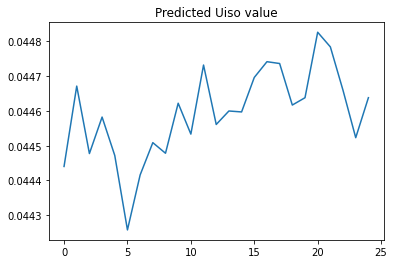

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

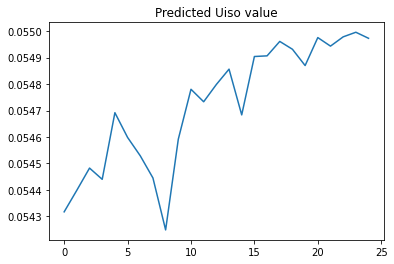

11
11
11
11
11
11
11
11
11
11
11


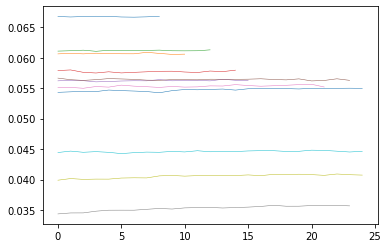

0.001
20
----RETRIEVING DATA----
0.0%
----DONE----


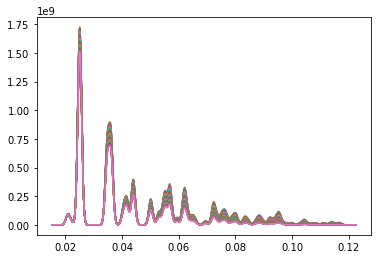

Have 37 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
----DONE----
8880
(8880, 150, 150, 1)
(8880, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
267/267 [==============================] - 4s 13ms/step - loss: 7.9529 - linear_regression_equality: 0.0075 - val_loss: 9.6469e-05 - val_linear_regression_equality: 0.0111
Epoch 2/10
267/267 [==============================] - 3s 12ms/step - loss: 7.2919e-04 - linear_regression_equality: 0.0427 - val_loss: 5.9576e-06 - val_linear_regression_equality: 0.0707
Epoch 3/10
267/267 [==============================] - 3s 12ms/step - loss: 1.7357e-05 - linear_regression_equality: 0.0446 - val_loss: 2.6112e-05 - val_linear_regression_equality: 0.0200
Epoch 4/10
267/267 [==============================] - 3s 12ms/step - loss: 9.1031e-06 - linear_regression_equality: 0.0421 - val_loss: 8.7534e-06 - val_linear_regression_equality: 0.0111
Epoch 5/10
267/267 [==============================] - 3s 12ms/st

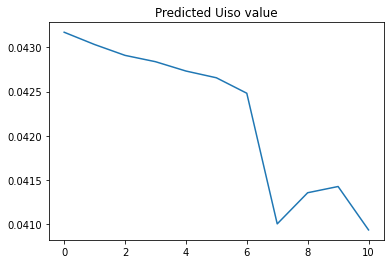

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


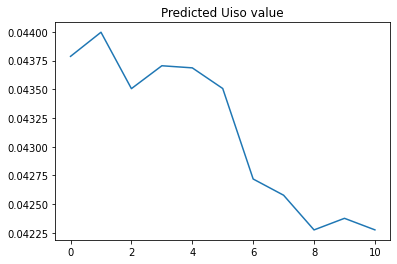

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

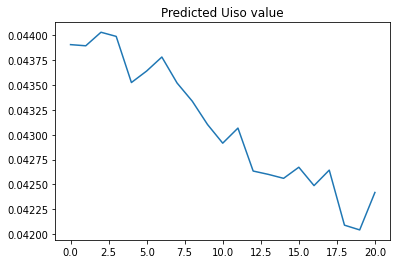

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

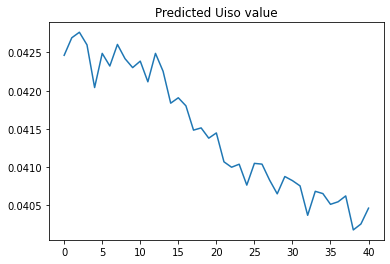

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

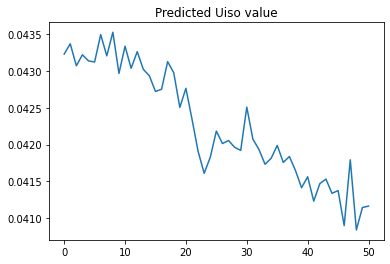

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


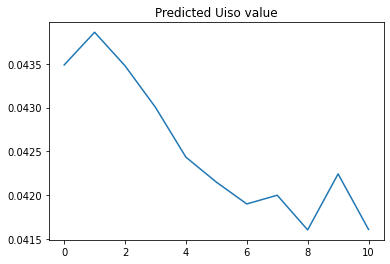

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

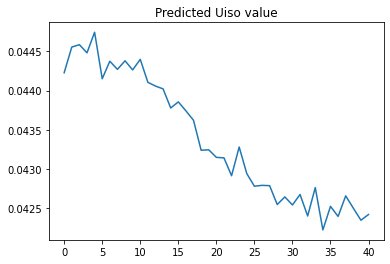

7
7
7
7
7
7
7


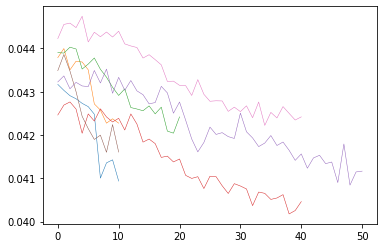

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


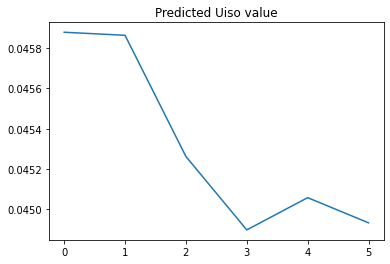

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

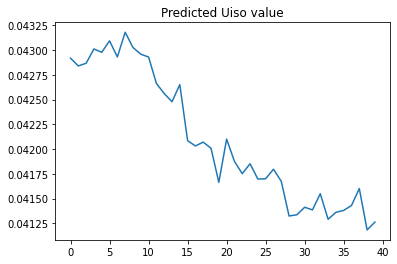

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


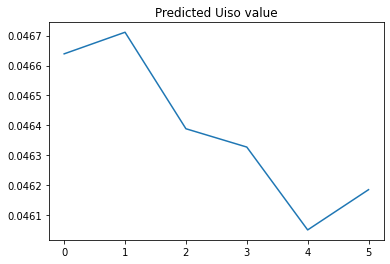

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

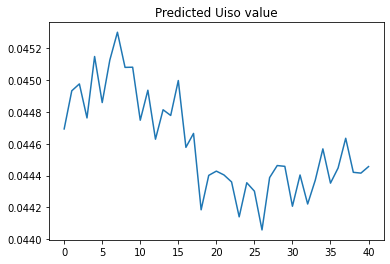

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


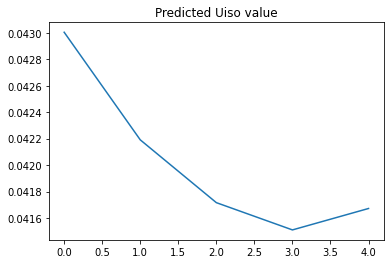

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

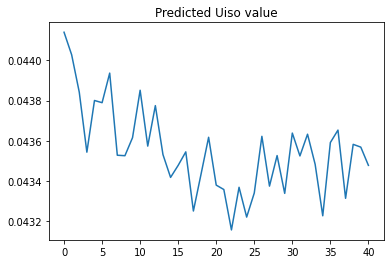

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


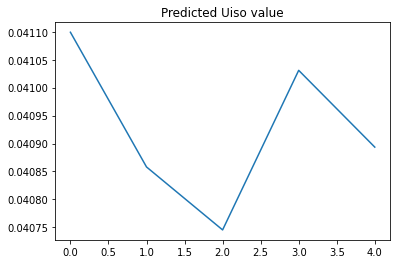

7
7
7
7
7
7
7


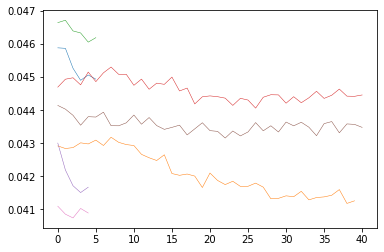

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


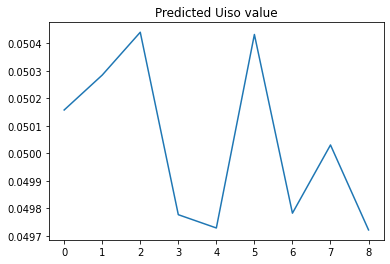

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


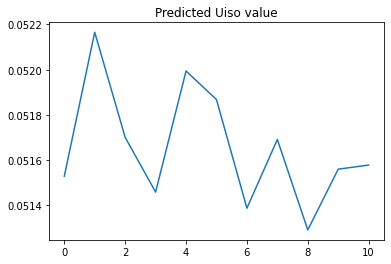

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

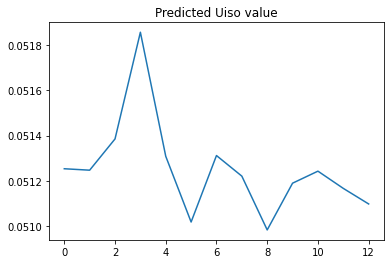

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

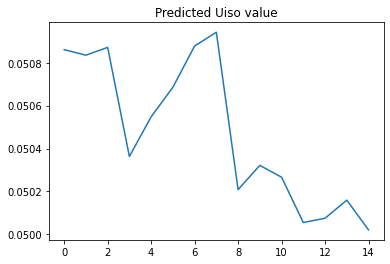

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

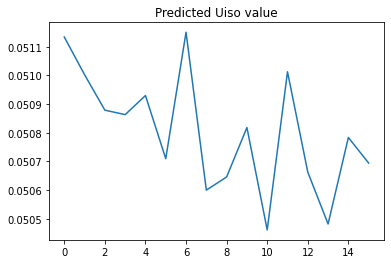

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

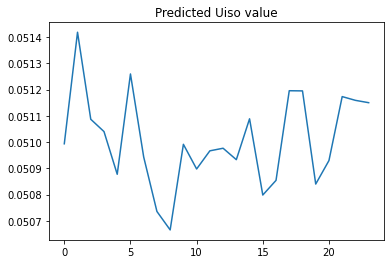

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

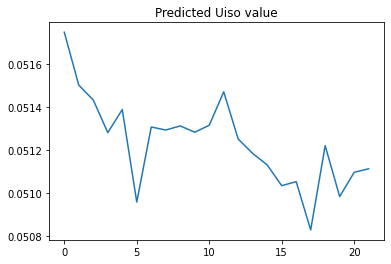

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

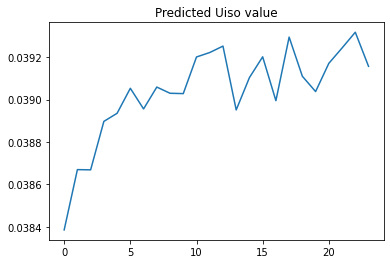

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

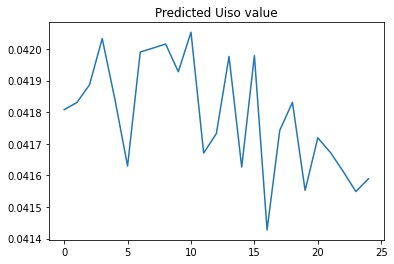

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

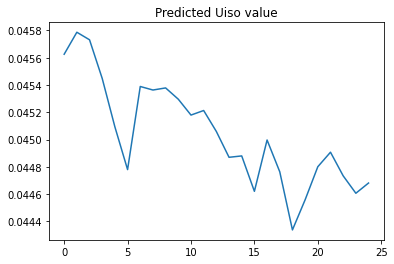

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

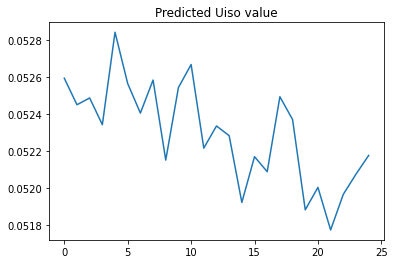

11
11
11
11
11
11
11
11
11
11
11


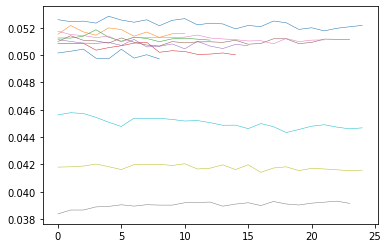

0.001
50
----RETRIEVING DATA----
0.0%
----DONE----


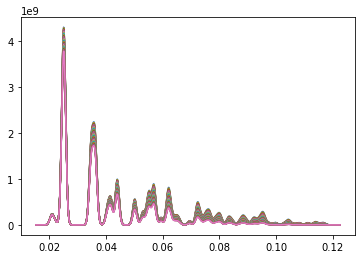

Have 37 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
----DONE----
8880
(8880, 150, 150, 1)
(8880, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
267/267 [==============================] - 4s 13ms/step - loss: 83.5991 - linear_regression_equality: 0.0067 - val_loss: 1.2847e-04 - val_linear_regression_equality: 0.0133
Epoch 2/10
267/267 [==============================] - 3s 12ms/step - loss: 6.2060e-05 - linear_regression_equality: 0.0308 - val_loss: 1.2961e-05 - val_linear_regression_equality: 0.0263
Epoch 3/10
267/267 [==============================] - 3s 12ms/step - loss: 1.1588e-05 - linear_regression_equality: 0.0407 - val_loss: 9.5535e-06 - val_linear_regression_equality: 0.0356
Epoch 4/10
267/267 [==============================] - 3s 12ms/step - loss: 8.1664e-06 - linear_regression_equality: 0.0725 - val_loss: 1.6401e-06 - val_linear_regression_equality: 0.1448
Epoch 5/10
267/267 [==============================] - 3s 12ms/s

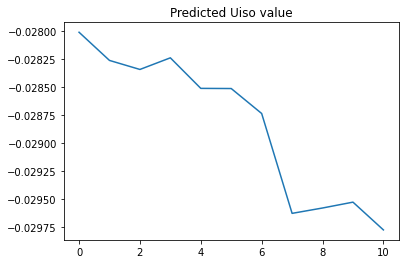

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


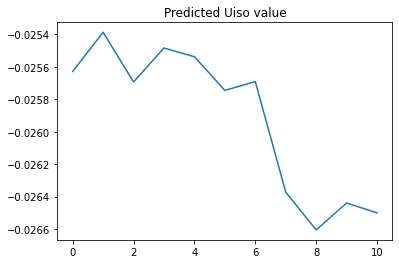

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

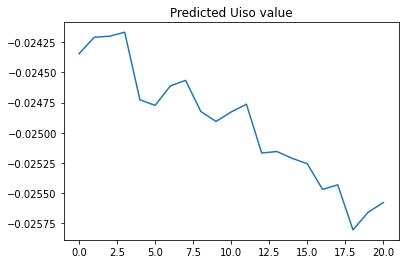

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

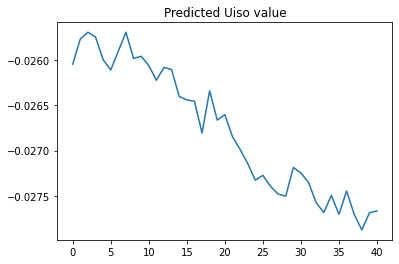

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

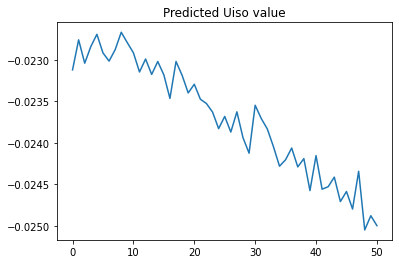

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


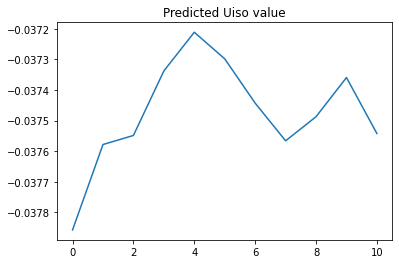

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

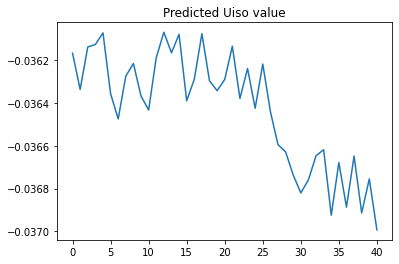

7
7
7
7
7
7
7


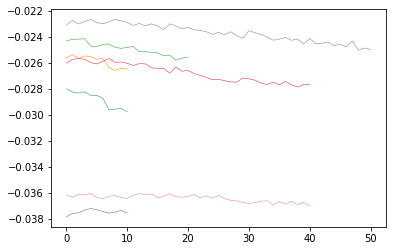

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


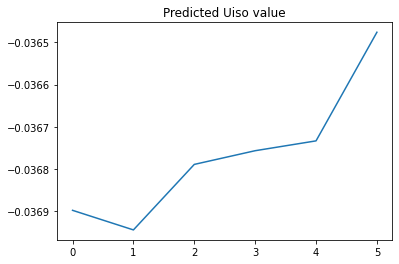

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

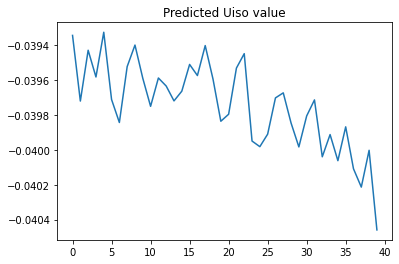

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


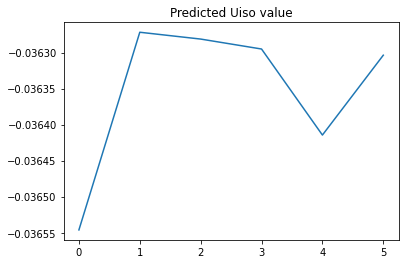

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

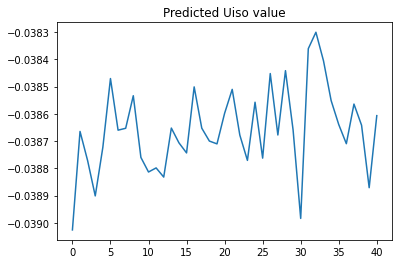

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


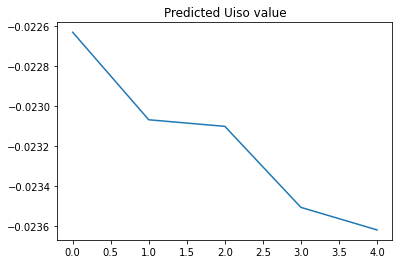

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

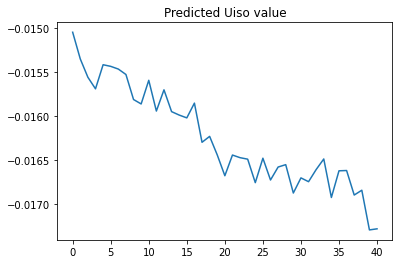

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


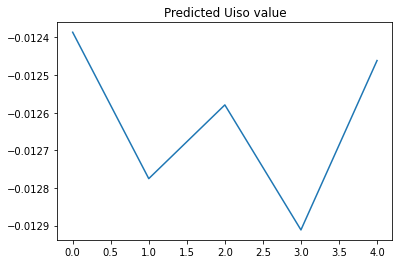

7
7
7
7
7
7
7


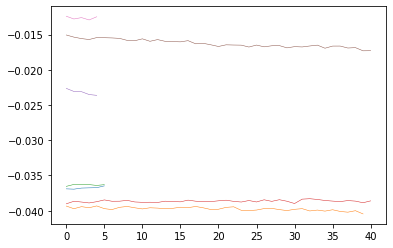

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


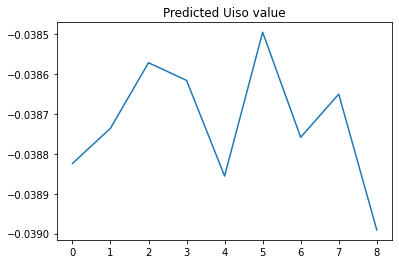

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


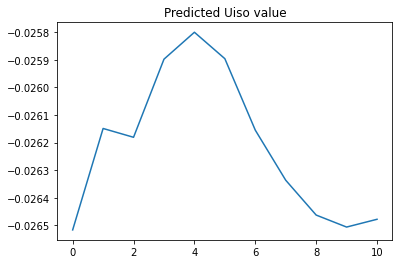

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

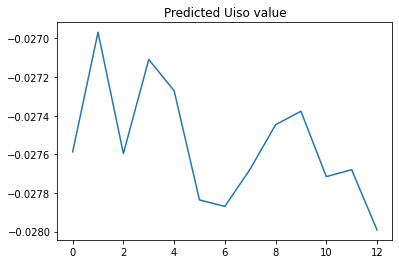

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

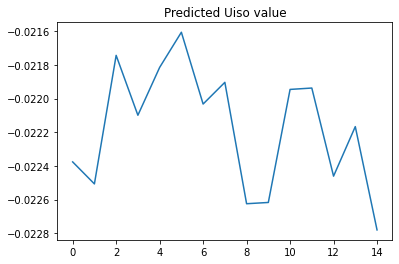

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

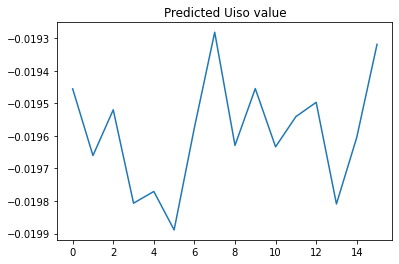

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

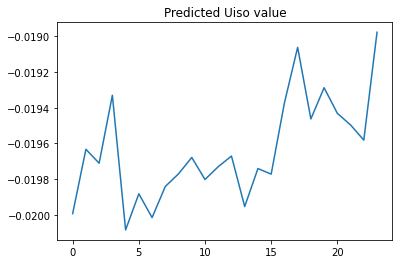

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

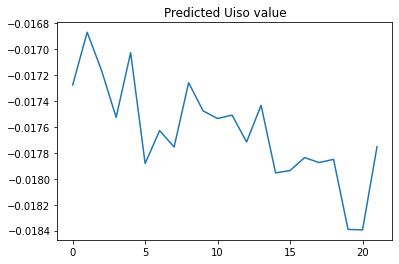

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

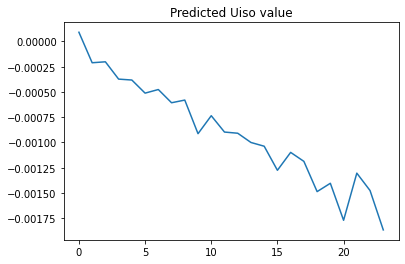

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

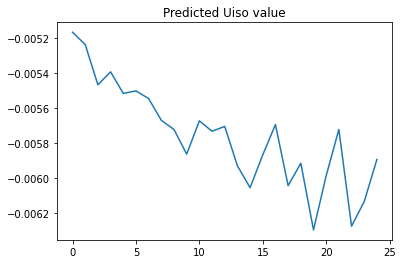

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

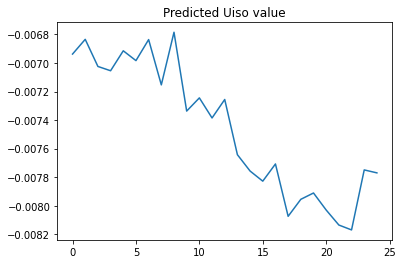

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

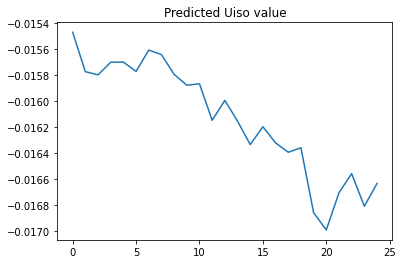

11
11
11
11
11
11
11
11
11
11
11


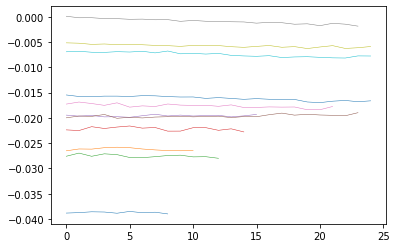

0.0015
5
----RETRIEVING DATA----
0.0%
20.0%
40.0%
60.0%
80.0%
----DONE----


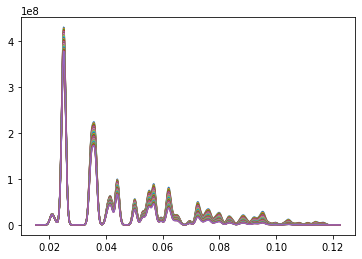

Have 25 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
20.0%
40.0%
60.0%
80.0%
----DONE----
6000
(6000, 150, 150, 1)
(6000, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
180/180 [==============================] - 3s 13ms/step - loss: 1.8205 - linear_regression_equality: 0.0131 - val_loss: 1.1256e-04 - val_linear_regression_equality: 0.0183
Epoch 2/10
180/180 [==============================] - 2s 12ms/step - loss: 2.2627e-04 - linear_regression_equality: 0.0180 - val_loss: 2.2128e-05 - val_linear_regression_equality: 0.0283
Epoch 3/10
180/180 [==============================] - 2s 12ms/step - loss: 3.7348e-04 - linear_regression_equality: 0.0296 - val_loss: 3.2350e-05 - val_linear_regression_equality: 0.0133
Epoch 4/10
180/180 [==============================] - 2s 12ms/step - loss: 3.9638e-05 - linear_regression_equality: 0.0324 - val_loss: 3.7037e-06 - val_linear_regression_equality: 0.0767
Epoch 5/10
180/180 [====================

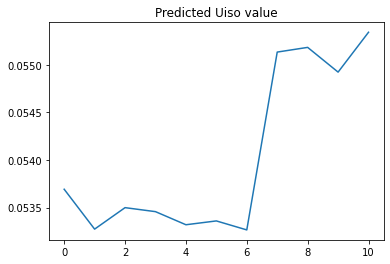

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


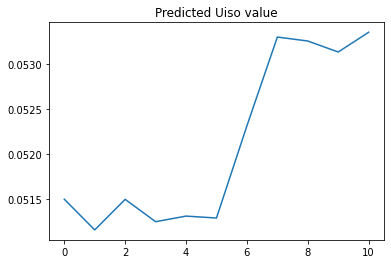

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

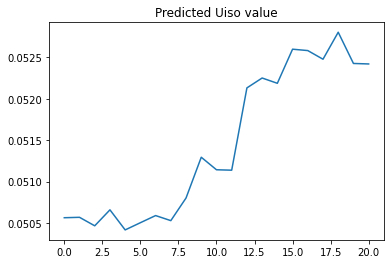

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

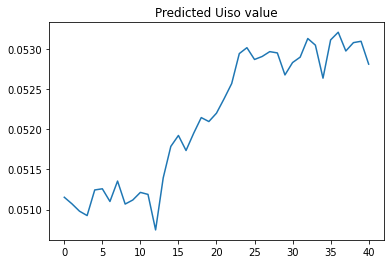

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

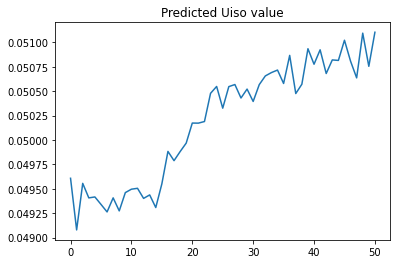

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


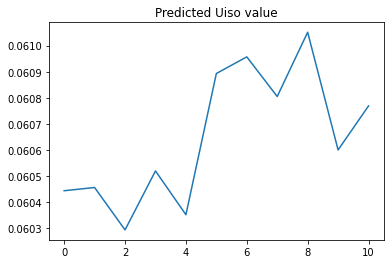

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

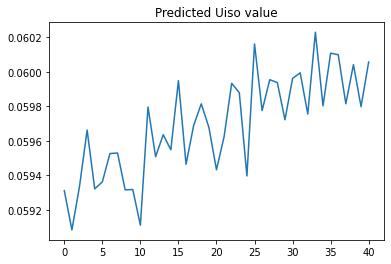

7
7
7
7
7
7
7


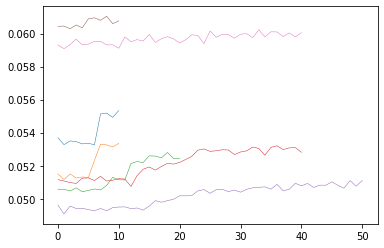

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


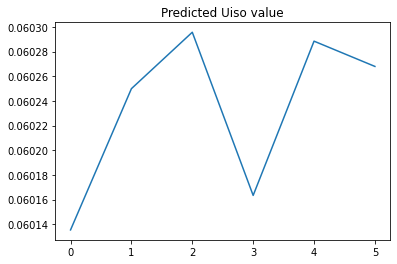

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

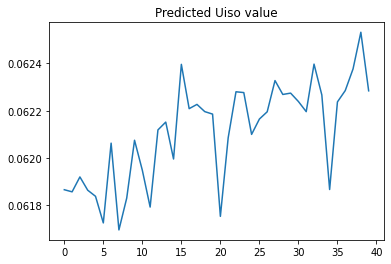

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


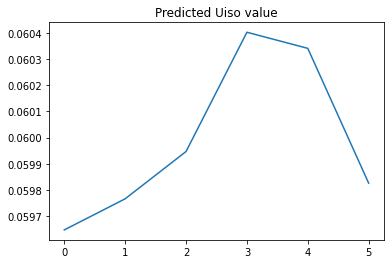

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

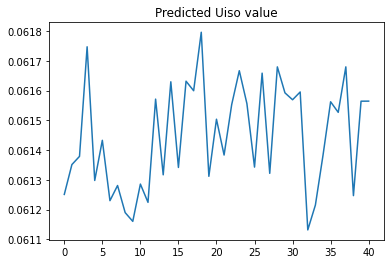

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


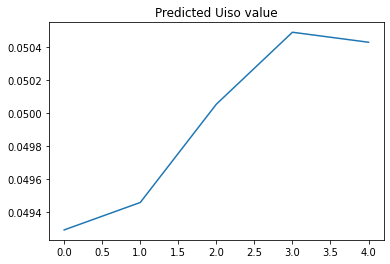

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

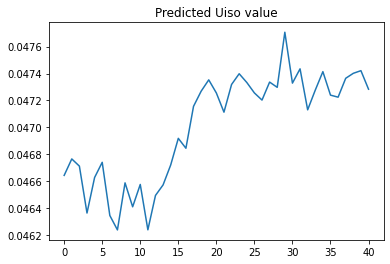

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


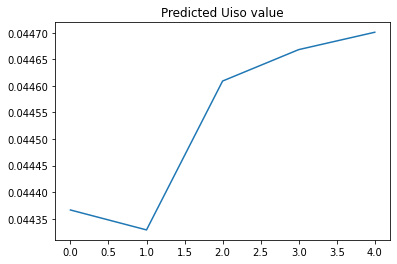

7
7
7
7
7
7
7


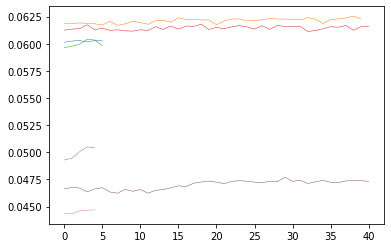

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


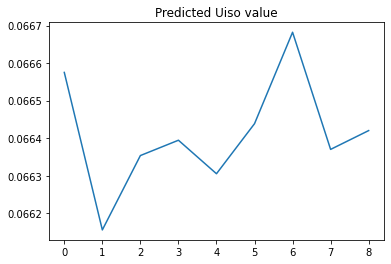

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


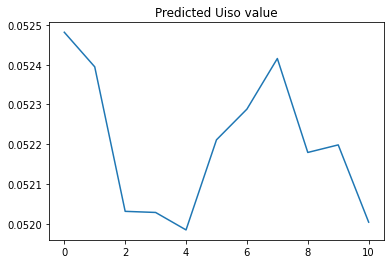

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

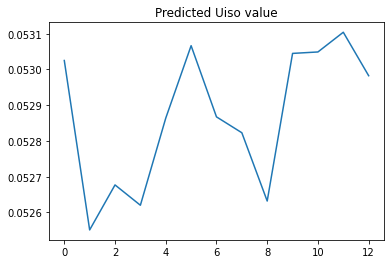

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

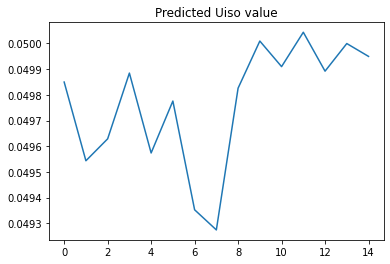

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

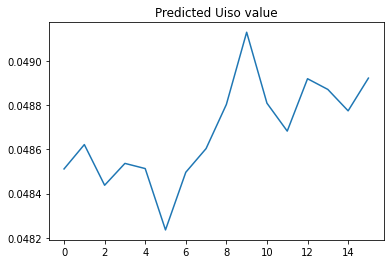

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

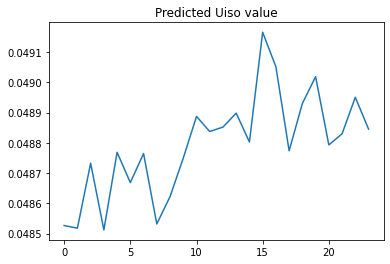

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

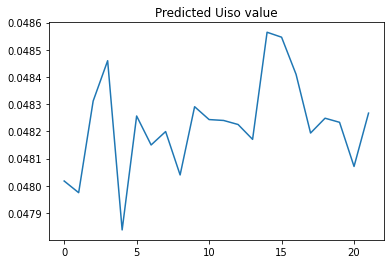

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

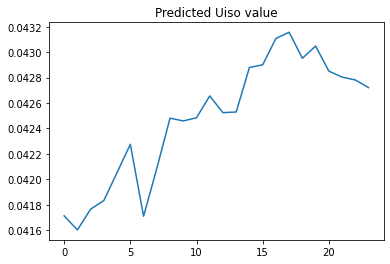

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

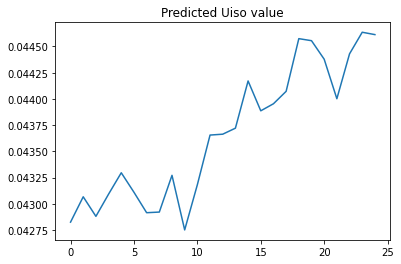

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

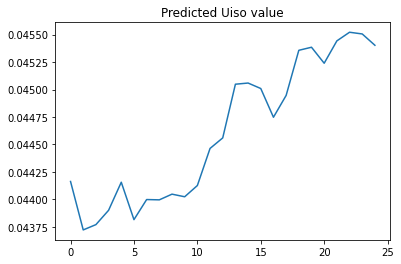

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

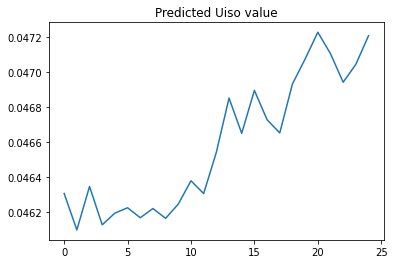

11
11
11
11
11
11
11
11
11
11
11


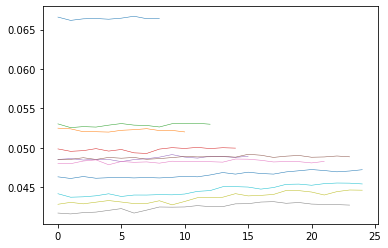

0.0015
10
----RETRIEVING DATA----
0.0%
20.0%
40.0%
60.0%
80.0%
----DONE----


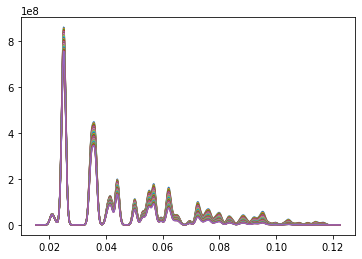

Have 25 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
20.0%
40.0%
60.0%
80.0%
----DONE----
6000
(6000, 150, 150, 1)
(6000, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
180/180 [==============================] - 3s 13ms/step - loss: 4.0762 - linear_regression_equality: 0.0094 - val_loss: 1.7570e-04 - val_linear_regression_equality: 0.0167
Epoch 2/10
180/180 [==============================] - 2s 12ms/step - loss: 0.0072 - linear_regression_equality: 0.0187 - val_loss: 1.7221e-05 - val_linear_regression_equality: 0.0383
Epoch 3/10
180/180 [==============================] - 2s 12ms/step - loss: 3.7655e-05 - linear_regression_equality: 0.0296 - val_loss: 2.4108e-05 - val_linear_regression_equality: 0.0133
Epoch 4/10
180/180 [==============================] - 2s 12ms/step - loss: 1.8325e-05 - linear_regression_equality: 0.0533 - val_loss: 6.4694e-06 - val_linear_regression_equality: 0.0483
Epoch 5/10
180/180 [========================

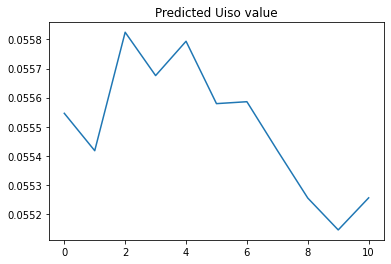

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


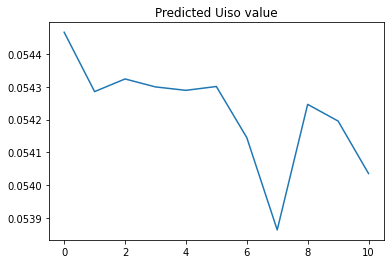

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

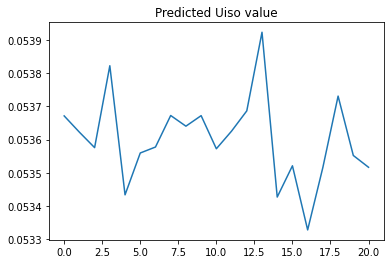

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

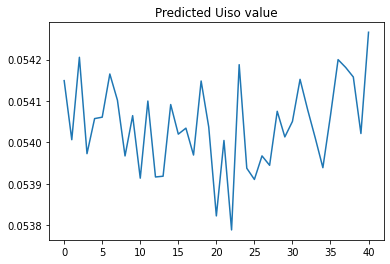

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

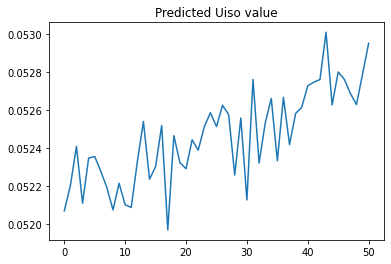

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


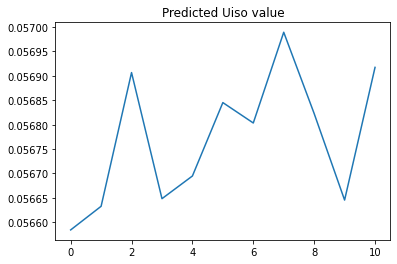

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

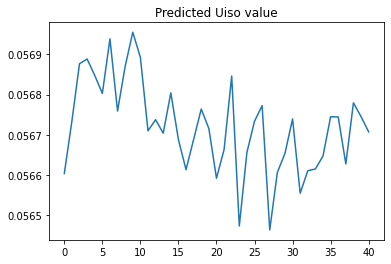

7
7
7
7
7
7
7


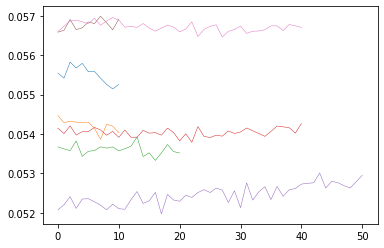

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


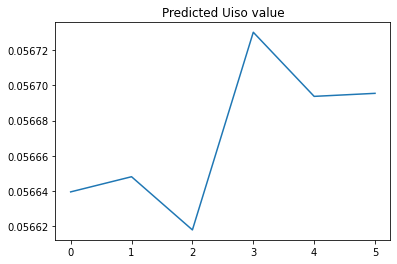

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

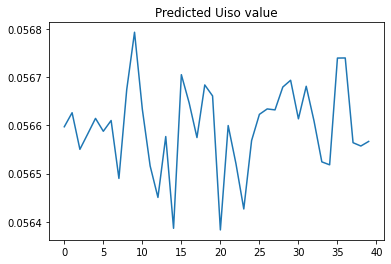

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


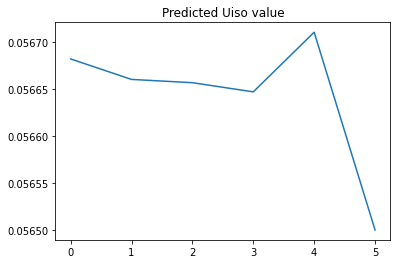

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

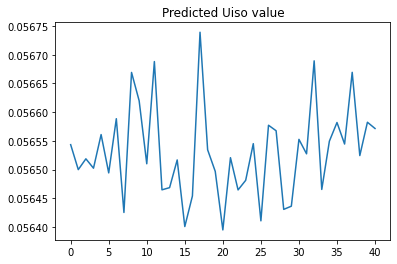

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


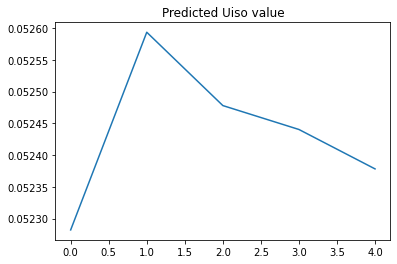

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

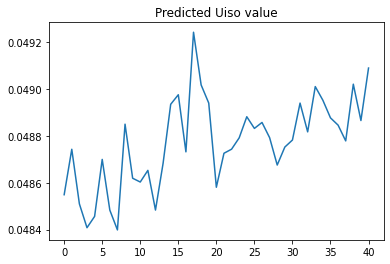

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


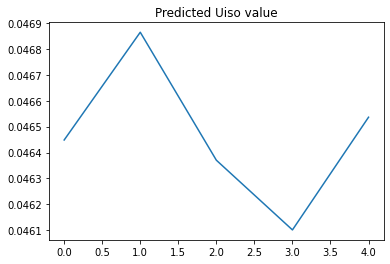

7
7
7
7
7
7
7


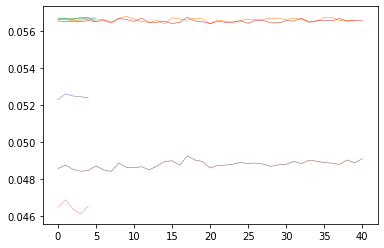

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


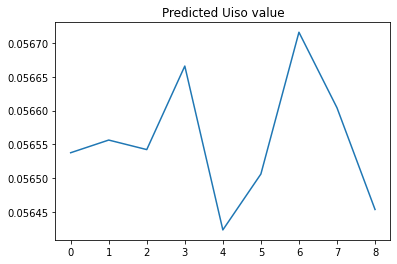

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


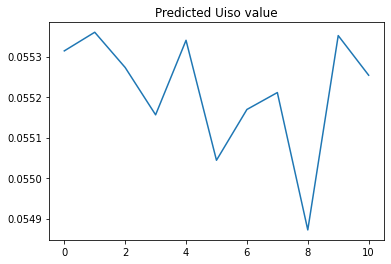

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

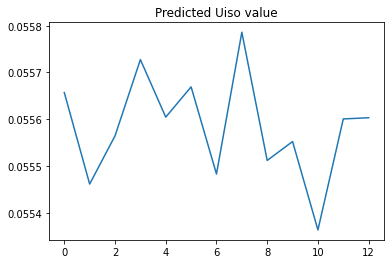

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

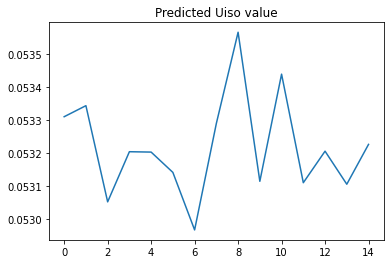

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

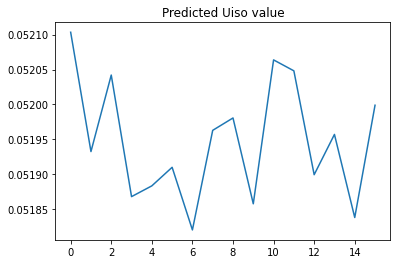

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

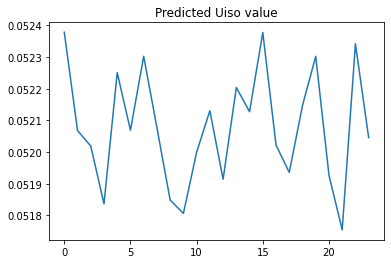

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

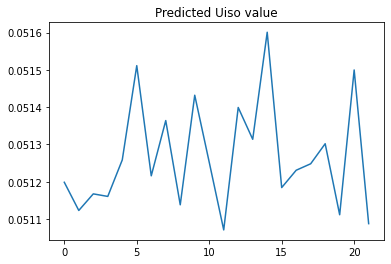

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

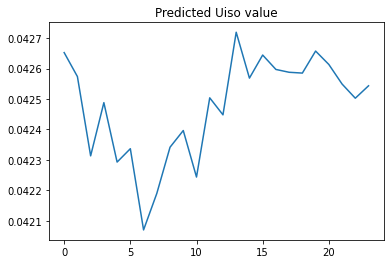

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

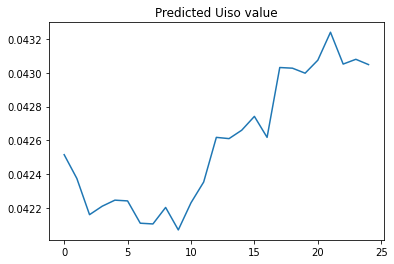

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

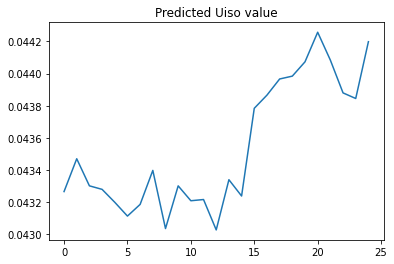

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

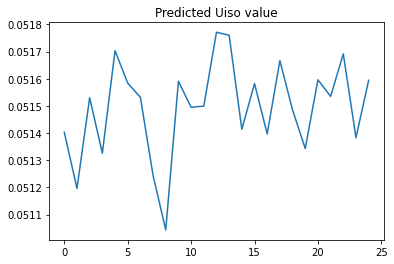

11
11
11
11
11
11
11
11
11
11
11


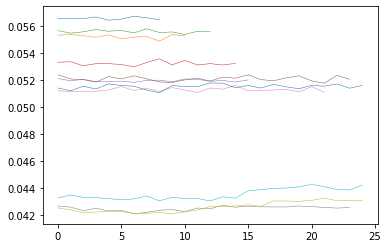

0.0015
20
----RETRIEVING DATA----
0.0%
20.0%
40.0%
60.0%
80.0%
----DONE----


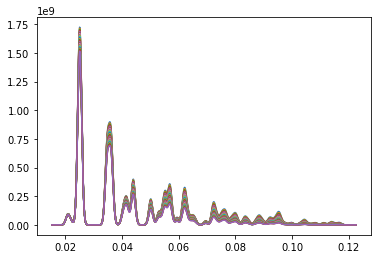

Have 25 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
20.0%
40.0%
60.0%
80.0%
----DONE----
6000
(6000, 150, 150, 1)
(6000, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
180/180 [==============================] - 3s 13ms/step - loss: 46.1188 - linear_regression_equality: 0.0035 - val_loss: 3.4755e-04 - val_linear_regression_equality: 0.0050
Epoch 2/10
180/180 [==============================] - 2s 12ms/step - loss: 2.2847e-04 - linear_regression_equality: 0.0126 - val_loss: 1.1863e-04 - val_linear_regression_equality: 0.0033
Epoch 3/10
180/180 [==============================] - 2s 12ms/step - loss: 1.2500e-04 - linear_regression_equality: 0.0135 - val_loss: 1.1936e-04 - val_linear_regression_equality: 0.0000e+00
Epoch 4/10
180/180 [==============================] - 2s 12ms/step - loss: 1.2074e-04 - linear_regression_equality: 0.0131 - val_loss: 1.2085e-04 - val_linear_regression_equality: 0.0000e+00
Epoch 5/10
180/180 [===========

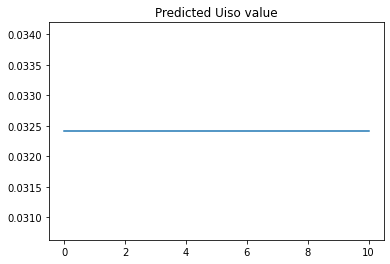

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


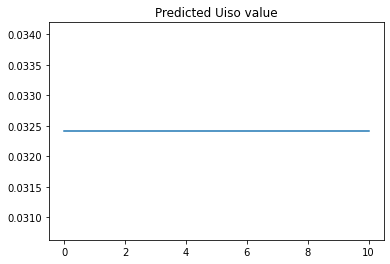

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

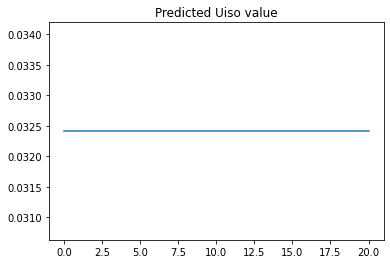

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

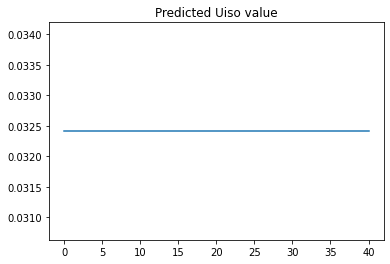

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

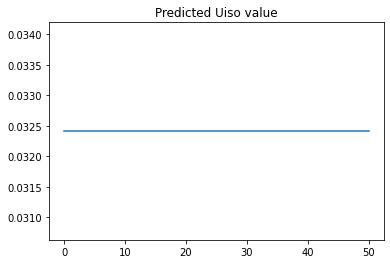

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


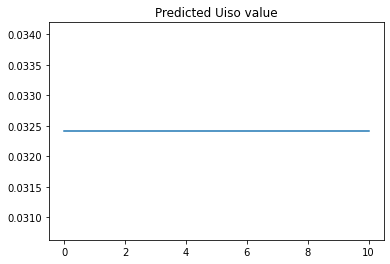

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

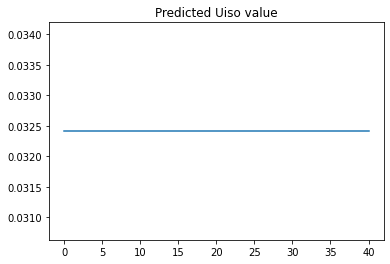

7
7
7
7
7
7
7


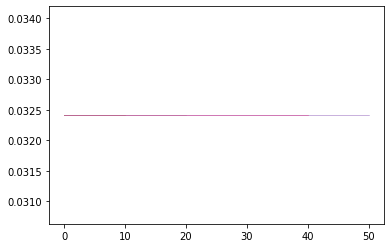

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


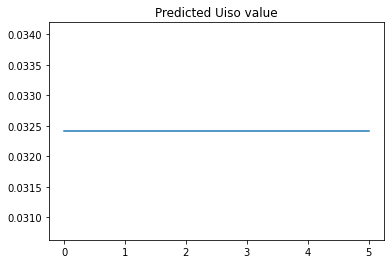

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

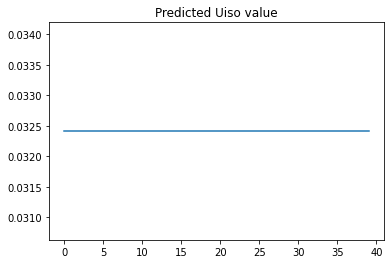

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


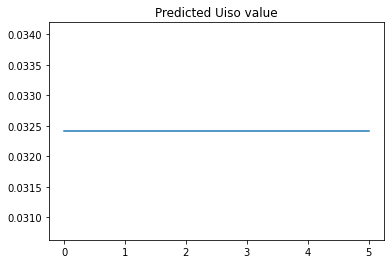

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

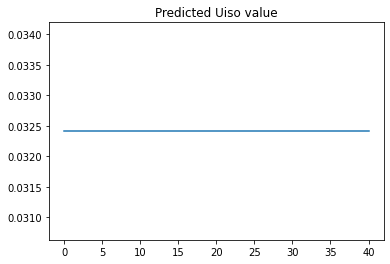

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


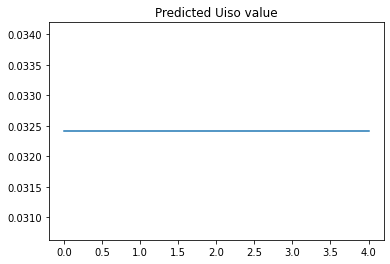

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

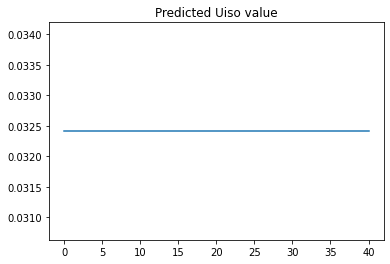

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


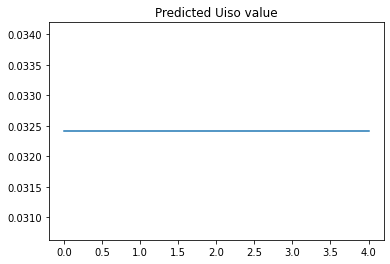

7
7
7
7
7
7
7


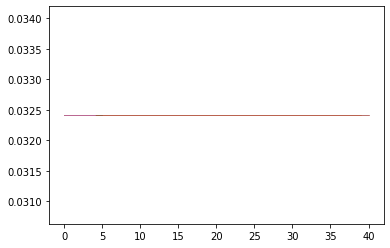

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


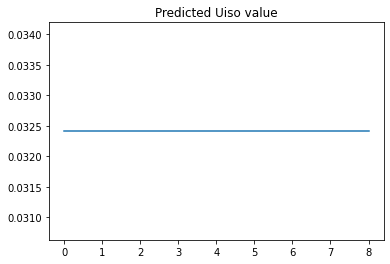

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


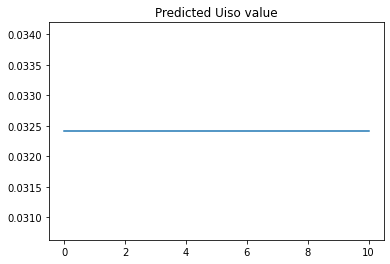

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

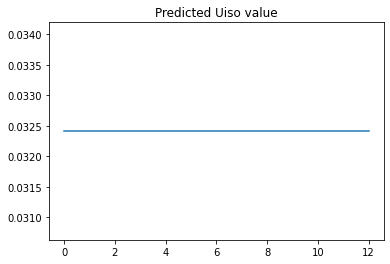

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

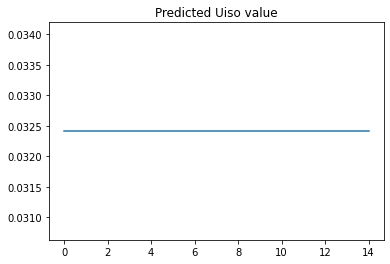

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

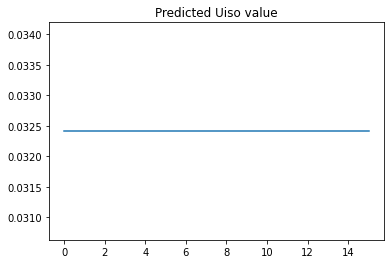

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

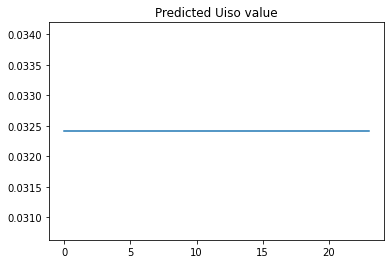

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

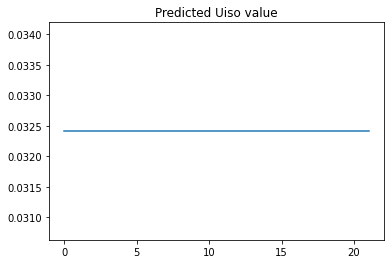

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

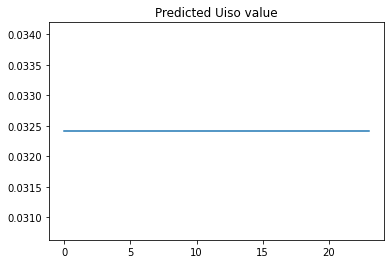

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

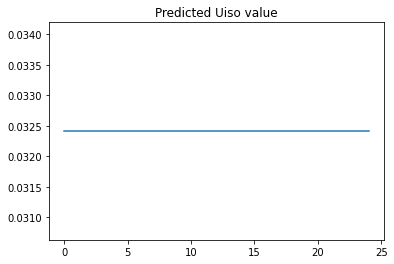

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

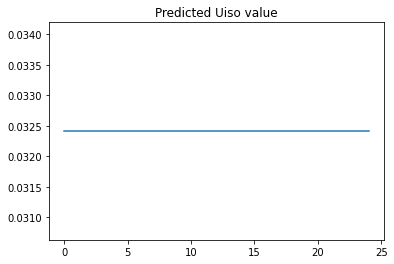

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

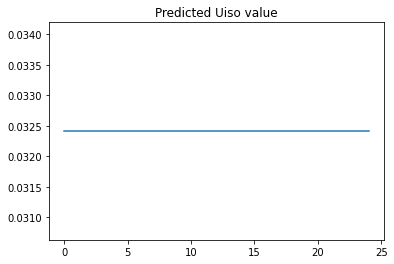

11
11
11
11
11
11
11
11
11
11
11


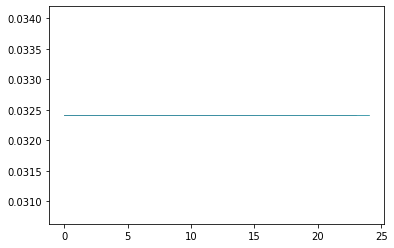

0.0015
50
----RETRIEVING DATA----
0.0%
20.0%
40.0%
60.0%
80.0%
----DONE----


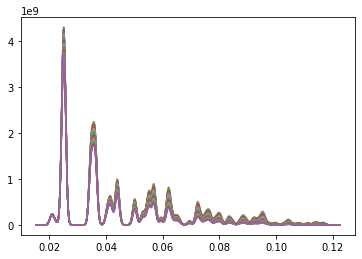

Have 25 datapoints for training
----GENERATING DIFFRACTION PATTERNS----
0.0%
20.0%
40.0%
60.0%
80.0%
----DONE----
6000
(6000, 150, 150, 1)
(6000, 1)
Model has been compiled
-------------STARTING EPOCH 1-------------
Epoch 1/10
180/180 [==============================] - 3s 13ms/step - loss: 49.5507 - linear_regression_equality: 0.0035 - val_loss: 5.2356e-04 - val_linear_regression_equality: 0.0083
Epoch 2/10
180/180 [==============================] - 2s 12ms/step - loss: 2.8867e-04 - linear_regression_equality: 0.0130 - val_loss: 0.0015 - val_linear_regression_equality: 0.0017
Epoch 3/10
180/180 [==============================] - 2s 12ms/step - loss: 1.3306e-04 - linear_regression_equality: 0.0141 - val_loss: 1.1815e-04 - val_linear_regression_equality: 0.0417
Epoch 4/10
180/180 [==============================] - 2s 12ms/step - loss: 1.2041e-04 - linear_regression_equality: 0.0106 - val_loss: 1.1746e-04 - val_linear_regression_equality: 0.0000e+00
Epoch 5/10
180/180 [===================

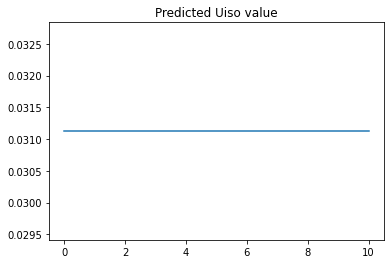

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images
['/2021-02-16/scans/scan1/scan1_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000004_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000006_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000008_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000010_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000014_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000016_gl-1_035000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000018_gl-1_040000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000020_gl-1_045000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan1/scan1_000022_gl-1_050000_fs_on_nan_md_.npy']


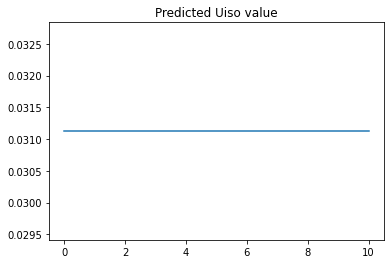

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images
['/2021-02-16/scans/scan2/scan2_000002_gl-1_020000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000004_gl-1_021000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000006_gl-1_022000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000008_gl-1_023000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000010_gl-1_024000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000012_gl-1_025000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000014_gl-1_026000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000016_gl-1_027000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000018_gl-1_028000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000020_gl-1_029000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000022_gl-1_030000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000024_gl-1_031000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan2/scan2_000026_gl-1_032000_f

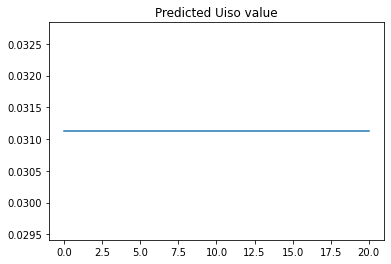

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images
['/2021-02-16/scans/scan3/scan3_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan3/scan3_000026_gl-1_001000_f

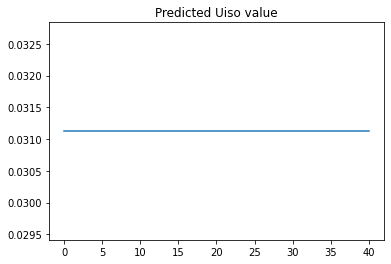

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images
['/2021-02-16/scans/scan4/scan4_000002_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000004_gl-1_000200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000006_gl-1_000400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000008_gl-1_000600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000010_gl-1_000800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000012_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000014_gl-1_001200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000016_gl-1_001400_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000018_gl-1_001600_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000020_gl-1_001800_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000022_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000024_gl-1_002200_fs_on_nan_md_.npy', '/2021-02-16/scans/scan4/scan4_000026_gl-1_002400_f

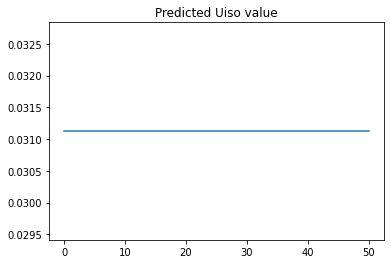

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images
['/2021-02-16/scans/scan5/scan5_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000004_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000006_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000008_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000010_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000014_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000016_gl-1_009000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000018_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000020_gl-1_013000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan5/scan5_000022_gl-1_015000_fs_on_nan_md_.npy']


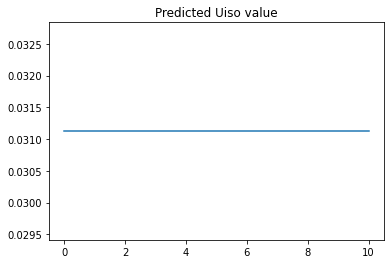

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images
['/2021-02-16/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-16/scans/scan6/scan6_000026_gl-1_001000_f

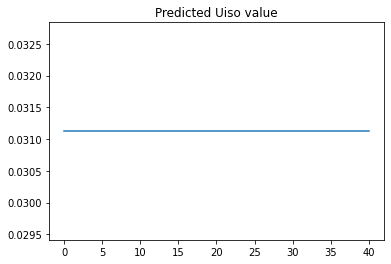

7
7
7
7
7
7
7


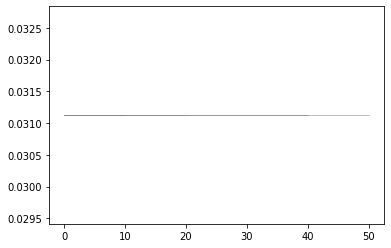

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
[]
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images
['/2021-02-17/scans/scan7/scan7_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan7/scan7_000012_gl-1_015000_fs_on_nan_md_.npy']


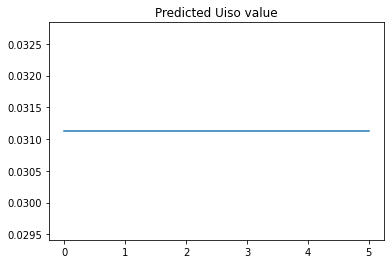

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images
['/2021-02-17/scans/scan8/scan8_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan8/scan8_000026_gl-1_001000_f

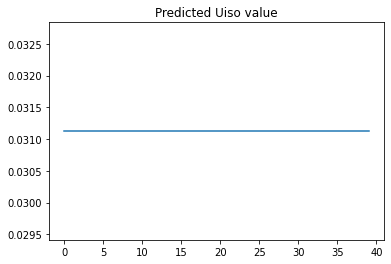

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images
['/2021-02-17/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000010_gl-1_011000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan10/scan10_000012_gl-1_015000_fs_on_nan_md_.npy']


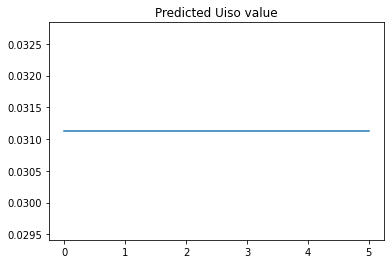

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images
['/2021-02-17/scans/scan11/scan11_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/scan11_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan11/

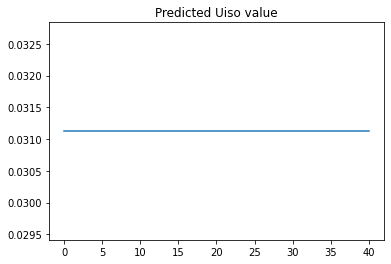

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images
['/2021-02-17/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan12/scan12_000010_gl-1_011000_fs_on_nan_md_.npy']


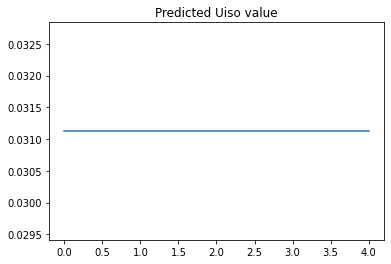

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images
['/2021-02-17/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000004_gl-1_-04500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000006_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000008_gl-1_-03500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000010_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000012_gl-1_-02500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000014_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000016_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000018_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000020_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/scan13_000024_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-17/scans/scan13/

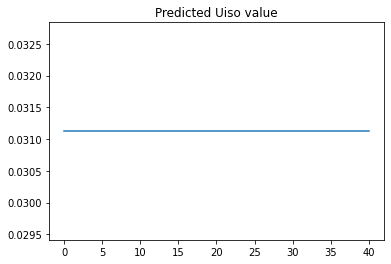

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images
['/2021-02-17/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000004_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000006_gl-1_003000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000008_gl-1_007000_fs_on_nan_md_.npy', '/2021-02-17/scans/scan14/scan14_000010_gl-1_011000_fs_on_nan_md_.npy']


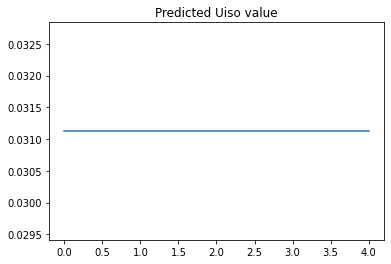

7
7
7
7
7
7
7


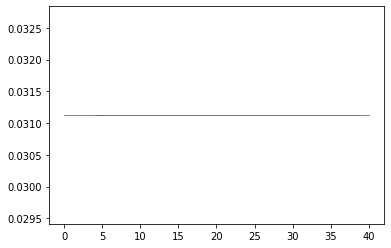

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images
['/2021-02-21/scans/scan0/scan0_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000006_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000008_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000010_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000012_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000014_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000016_gl-1_015000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan0/scan0_000018_gl-1_020000_fs_on_nan_md_.npy']


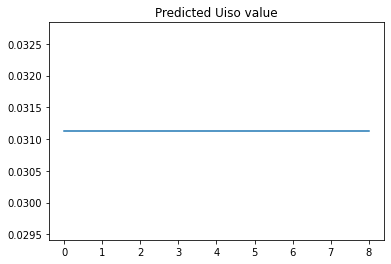

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images
['/2021-02-21/scans/scan1/scan1_000002_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000004_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000006_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000008_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000010_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000012_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000014_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000016_gl-1_004000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000018_gl-1_006000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000020_gl-1_008000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan1/scan1_000022_gl-1_010000_fs_on_nan_md_.npy']


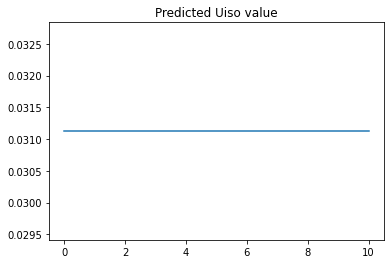

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images
['/2021-02-21/scans/scan2/scan2_000002_gl-1_-100000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000004_gl-1_-90000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000006_gl-1_-80000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000008_gl-1_-70000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000010_gl-1_-60000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000012_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000014_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000016_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000018_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000020_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000024_gl-1_010000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan2/scan2_000026_gl-1_020000_

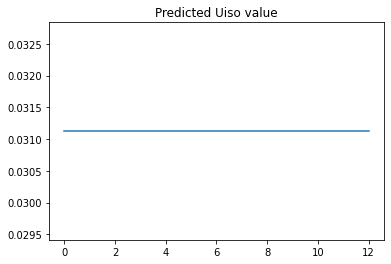

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images
['/2021-02-21/scans/scan3/scan3_000002_gl-1_-50000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000004_gl-1_-45000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000006_gl-1_-40000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000008_gl-1_-35000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000010_gl-1_-30000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000012_gl-1_-25000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000014_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000016_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000018_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000020_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000024_gl-1_005000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan3/scan3_000026_gl-1_010000_f

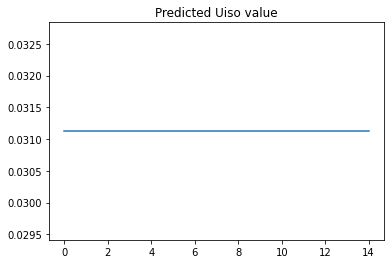

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images
['/2021-02-21/scans/scan4/scan4_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000004_gl-1_-18000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000006_gl-1_-16000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000008_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000012_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000014_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000016_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000018_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000020_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000022_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan4/scan4_000026_gl-1_004000_f

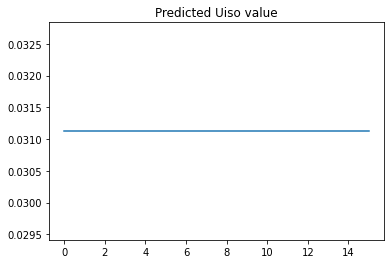

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images
['/2021-02-21/scans/scan5/scan5_000002_gl-1_-20000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000004_gl-1_-15000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000006_gl-1_-14000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000008_gl-1_-13000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000010_gl-1_-12000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000012_gl-1_-11000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000014_gl-1_-10000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000016_gl-1_-09000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000018_gl-1_-08000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000020_gl-1_-07000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000022_gl-1_-06000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000024_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan5/scan5_000026_gl-1_-04000_f

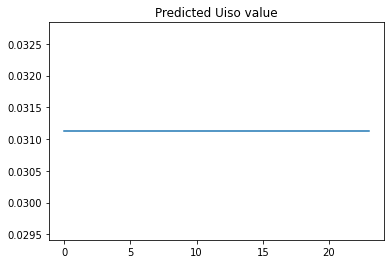

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images
['/2021-02-21/scans/scan6/scan6_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000004_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000006_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000008_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000010_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000012_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000014_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000016_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000018_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000020_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000022_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000024_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scans/scan6/scan6_000026_gl-1_nan_fs_on_nan_md_.npy', '/2021-02-21/scan

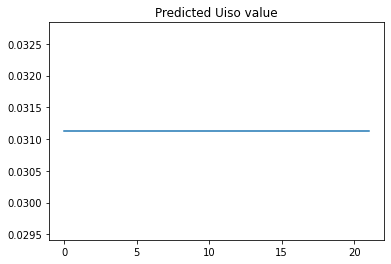

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
['/2021-02-21/scans/scan7/scan7_000002_gl-1_nan_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
['/2021-02-21/scans/scan8/scan8_000002_gl-1_001000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
['/2021-02-21/scans/scan9/scan9_000002_gl-1_002000_fs_on_nan_md_.npy']
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images
['/2021-02-21/scans/scan10/scan10_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan10/scan10_000010_gl-1_-01500_fs_on_nan_md_.npy',

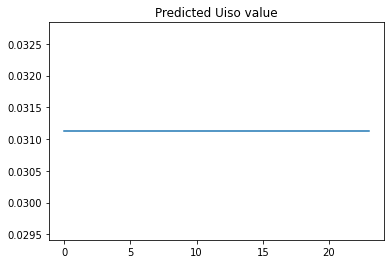

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images
['/2021-02-21/scans/scan12/scan12_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/scan12_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan12/

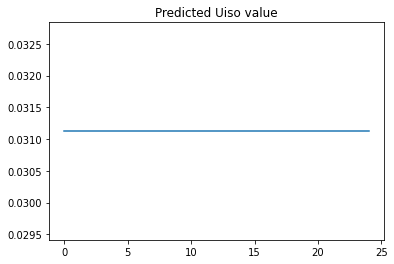

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images
['/2021-02-21/scans/scan13/scan13_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/scan13_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan13/

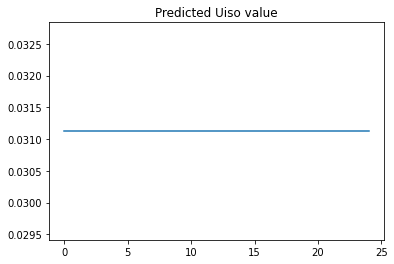

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images
['/2021-02-21/scans/scan14/scan14_000002_gl-1_-05000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000004_gl-1_-04000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000006_gl-1_-03000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000008_gl-1_-02000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000010_gl-1_-01500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000012_gl-1_-01000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000014_gl-1_-00500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000016_gl-1_000000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000018_gl-1_000500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000020_gl-1_001000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000022_gl-1_001500_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/scan14_000024_gl-1_002000_fs_on_nan_md_.npy', '/2021-02-21/scans/scan14/

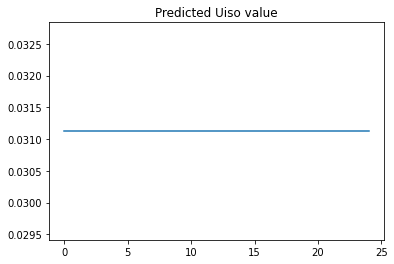

11
11
11
11
11
11
11
11
11
11
11


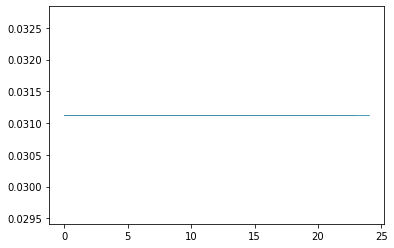

In [ ]:
increments = [0.0005,0.001,0.0015]
scaling = [5,10,20,50]
for increment in increments:
  for scales in scaling:
    print(increment)
    print(scales)
    X = []
    Y = []
    X_array = []
    Y_array = []

    #Calling functions to generate diffraction data
    uiso_labels, radii, intensities = retrieve_data(uiso_lower_bound = 0.0138, uiso_increment=increment,uiso_upper_bound=0.05,intensity_scale=scales)
    images = generate_diffraction_patterns(uiso_labels,radii,intensities,False)
    print(len(images))
    X,Y = zip(*images)
    X_array = np.array(X).reshape(-1,int(resolution),int(resolution),1)
    Y_array = np.array(Y).reshape(-1,1)
    X = []
    Y = []
    #Array shape is checked to ensure they are of equal length and of correct size
    print(X_array.shape)
    print(Y_array.shape)

    #epoch_to_load = int(input("what epoch to load?"))
    #base_type = int(input("Normal base (0)? or Inverse Square base (1)?"))
    epoch_to_load = 0
    base_type = 0
    model = None
    if epoch_to_load == 0:
      #Building and compiling CNN
      model = compile_cnn(build_cnn_model(),0.001)
      #Defining a decaying learning rate
      epoch_to_save = 10
    else:
      model = load_model(epoch_to_load)
      epoch_to_save = 5
    print("Model has been compiled")

    EPOCHS = 50#int(input("how many epochs to train?"))
    #EPOCHS = 150

    #Defining lists to store accuracy and loss values over the course of training 
    accuracy_values = []
    validation_accuracy_values= []
    loss_values = []
    validation_loss_values = []



    #Training Neural Net
    for epoch in range(epoch_to_load+1,5+1):#epoch_to_load+EPOCHS+1):
      
      print("-------------STARTING EPOCH {}-------------".format(epoch))
      history = model.fit(X_array,Y_array,batch_size=30,epochs=10,validation_split=0.1)
      #Storing accuracy and loss values
      accuracy_values.append(history.history['linear_regression_equality'][0])
      validation_accuracy_values.append(history.history['val_linear_regression_equality'][0])
      loss_values.append(history.history['loss'][0])
      validation_loss_values.append(history.history['val_loss'][0])

      #if epoch % epoch_to_save == 0:    
      print("SAVING NETWORK")
      if base_type == 0:
        weights_file_name = "/content/drive/MyDrive/Bismuth_Data_Processed/CNN_weights_normal_1_scaled{}.ckpt".format(epoch)
      elif base_type == 1:
        weights_file_name = "/content/drive/MyDrive/Bismuth_Data_Processed/CNN_weights_inv_sq_1_scaled{}.ckpt".format(epoch)
      else:
        weights_file_name = "/content/drive/MyDrive/Bismuth_Data_Processed/CNN_weights_unspecified_fn_1_scaled{}.ckpt".format(epoch)
      model.save_weights(weights_file_name)
      #if epoch > epoch_to_load + 1:
      """
      #Plotting NN performance
      f1 = plt.figure()
      f2 = plt.figure()
      ax1 = f1.add_subplot(111)

      ax1.plot(accuracy_values, "-b",label = "train accuracy")
      ax1.plot(validation_accuracy_values, "-r",label = "test accuracy")
      ax1.legend()
      ax2 = f2.add_subplot(111)
      ax2.plot(loss_values, "-b",label = "train loss")
      ax2.plot(validation_loss_values, "-r",label = "test loss")
      ax2.set_ylim([0,validation_loss_values[1]])
      ax2.legend()
      plt.show()
      """
    X_array = []
    Y_array = []

    dates = [16,17,21]


    Y,X = np.ogrid[:resolution,:resolution]
    centre_val = resolution/2

    dist_from_center = np.sqrt((X-78)**2+(Y-79)**2)
    mask = (dist_from_center > 13)      

    #opens scans 0-15
    dirs_to_open=range(0,15)
    data_dir = '/content/drive/MyDrive/Bismuth_Data_Processed/'
    for date in dates:
      date = "2021-02-" + str(date) + "/scans/scan"
      series_arr = []
      for i in dirs_to_open:
        #print("----------STARTING NEW TEST------")
        scan_num = str(i)
        dir_name = data_dir + date + scan_num + "/"
        if os.path.exists(dir_name):
          print("Directory name: "+dir_name)
          file_name_array, data_dict = process_data(dir_name)
          file_name_array.sort()
          data_arr = []
          print(file_name_array)

          for file_name in file_name_array:
            data_arr.append([data_dict[file_name],file_name])     
            

          try:
            X_test,labels = zip(*data_arr)        
            X_test_arr = np.expand_dims(np.array(X_test),-1)
            predictions = model.predict(X_test_arr)
            reg_preds = []
            for prediction in predictions:
              reg_preds.append(prediction)
            if len(reg_preds) > 1:
              series_arr.append(reg_preds)
              
              plt.plot(reg_preds)
              plt.title("Predicted Uiso value")
              plt.show()          
                          
            #if i train for many epochs, maybe it overfits because of relatively small basis of original data points in dataset, but trend of predicted uiso values doesn't show any increase
          except:
            print("Couldn't load")
          
      
      #plt.title("Predicted Uiso value")
      for series in series_arr:
        print(len(series_arr))
        plt.plot(series, linewidth=0.5)
      plt.show()
      



Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/
Done! Added 11 images


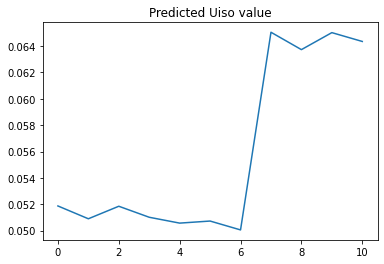

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images


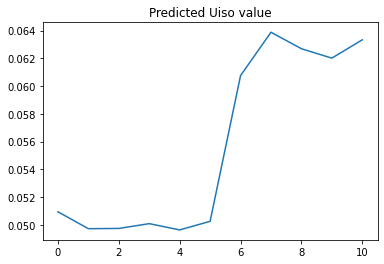

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images


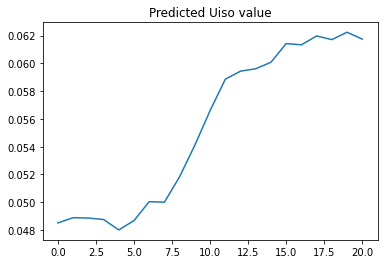

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images


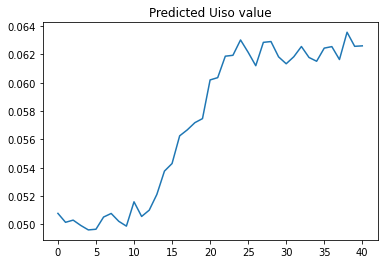

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images


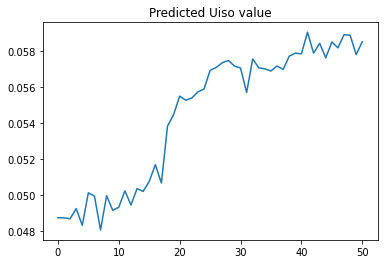

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images


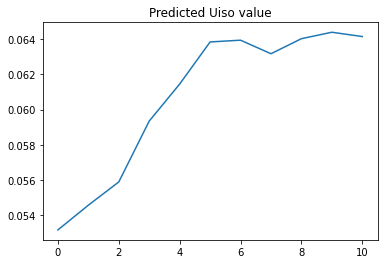

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images


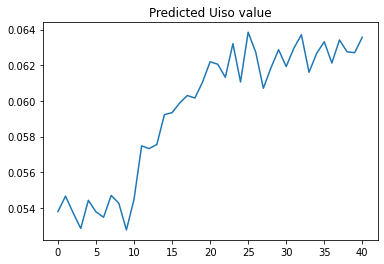

7
7
7
7
7
7
7


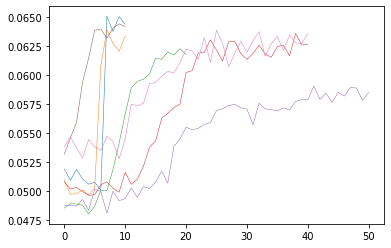

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images


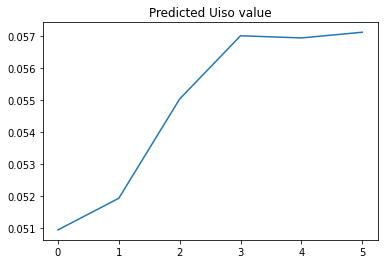

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images


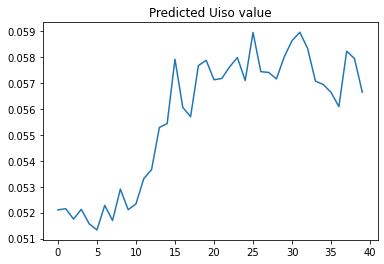

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images


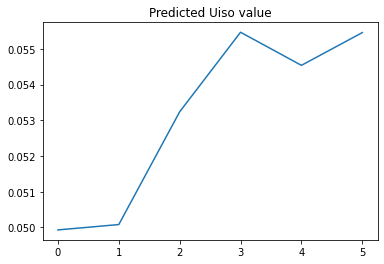

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images


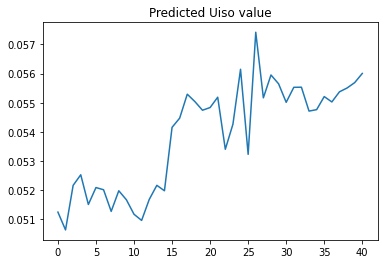

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images


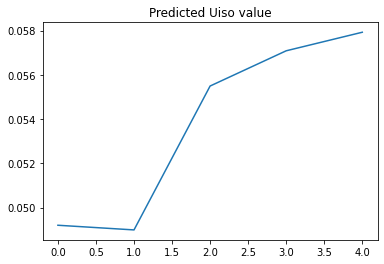

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images


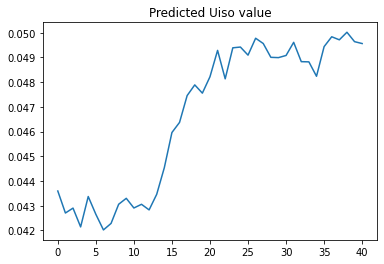

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images


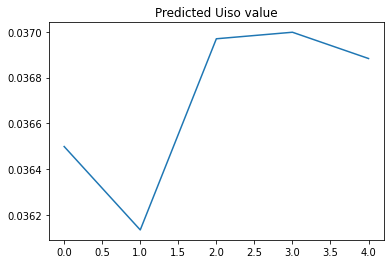

7
7
7
7
7
7
7


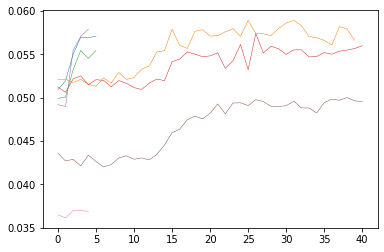

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images


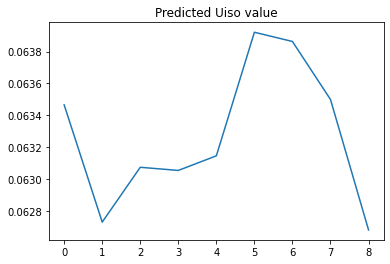

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images


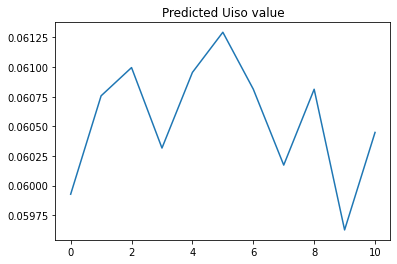

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images


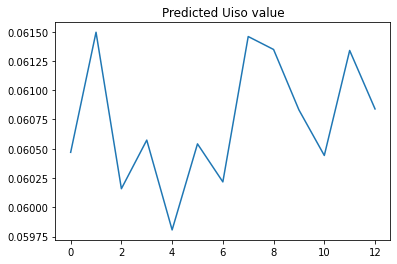

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images


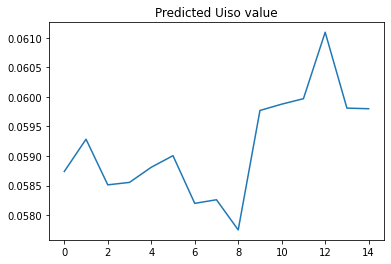

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images


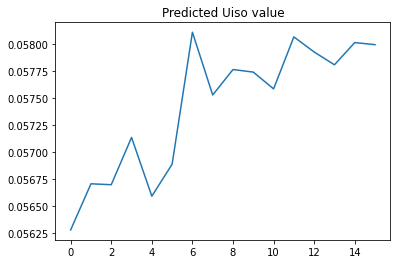

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images


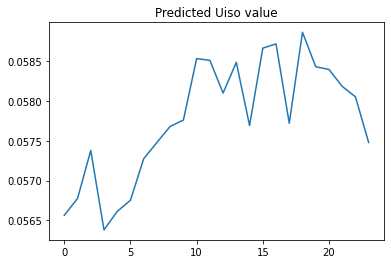

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images


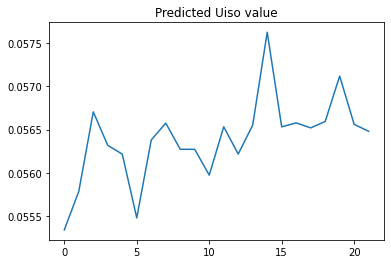

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images


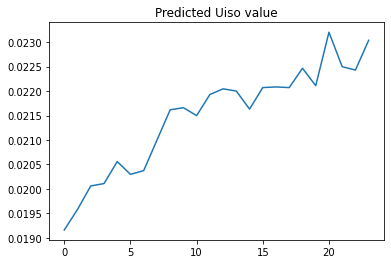

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images


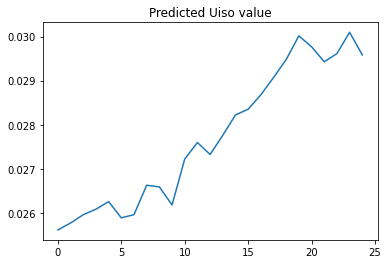

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images


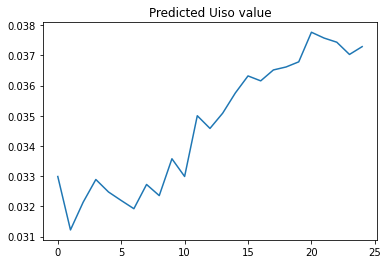

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images


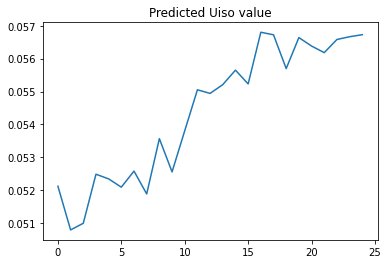

11
11
11
11
11
11
11
11
11
11
11


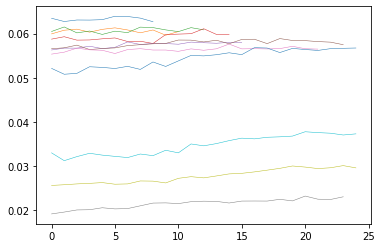

In [ ]:
#epoch_to_load = int(input("what epoch to load?"))
#base_type = int(input("Normal base (0)? or Inverse Square base (1)?"))
#model = load_model(epoch_to_load,base_type)


#array of dates of scans to be opened
dates = [16,17,21]


Y,X = np.ogrid[:resolution,:resolution]
centre_val = resolution/2

dist_from_center = np.sqrt((X-78)**2+(Y-79)**2)
mask = (dist_from_center > 13)      

#opens scans 0-15
dirs_to_open=range(0,15)
data_dir = '/content/drive/MyDrive/Bismuth_Data_Processed/'
for date in dates:
  date = "2021-02-" + str(date) + "/scans/scan"
  series_arr = []
  for i in dirs_to_open:
    #print("----------STARTING NEW TEST------")
    scan_num = str(i)
    dir_name = data_dir + date + scan_num + "/"
    if os.path.exists(dir_name):
      print("Directory name: "+dir_name)
      file_name_array, data_dict = process_data(dir_name)
      file_name_array.sort()
      data_arr = []


      for file_name in file_name_array:
        data_arr.append([data_dict[file_name],file_name])     
        

      try:
        X_test,labels = zip(*data_arr)        
        X_test_arr = np.expand_dims(np.array(X_test),-1)
        predictions = model.predict(X_test_arr)
        reg_preds = []
        for prediction in predictions:
          reg_preds.append(prediction)
        if len(reg_preds) > 1:
          series_arr.append(reg_preds)
          
          plt.plot(reg_preds)
          plt.title("Predicted Uiso value")
          plt.show()          
                      
        #if i train for many epochs, maybe it overfits because of relatively small basis of original data points in dataset, but trend of predicted uiso values doesn't show any increase
      except:
        print("Couldn't load")
      
  
  #plt.title("Predicted Uiso value")
  for series in series_arr:
    print(len(series_arr))
    plt.plot(series, linewidth=0.5)
  plt.show()
  


Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/scan0_000003_GL-1_-80000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/scan0_000001_GL-1_-100000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/scan0_000007_GL-1_-40000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/scan0_000009_GL-1_-20000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/scan0_000005_GL-1_-60000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/scan0_000011_GL-1_000000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/scan0_000013_GL-1_020000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/scan0_000015_GL-1_040000_fs_Off_

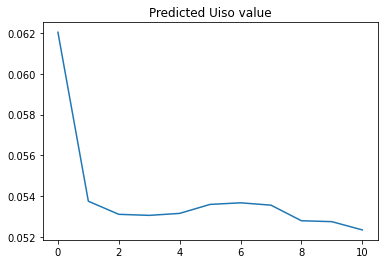

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/scan1_000001_GL-1_000000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/scan1_000005_GL-1_010000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/scan1_000003_GL-1_005000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/scan1_000009_GL-1_020000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/scan1_000007_GL-1_015000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/scan1_000013_GL-1_030000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/scan1_000011_GL-1_025000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/scan1_000015_GL-1_035000_fs_Off_ 

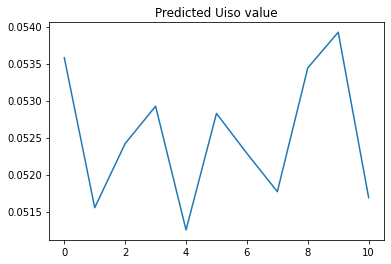

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/scan2_000003_GL-1_021000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/scan2_000001_GL-1_020000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/scan2_000007_GL-1_023000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/scan2_000005_GL-1_022000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/scan2_000009_GL-1_024000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/scan2_000013_GL-1_026000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/scan2_000011_GL-1_025000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/scan2_000015_GL-1_027000_fs_Off_ 

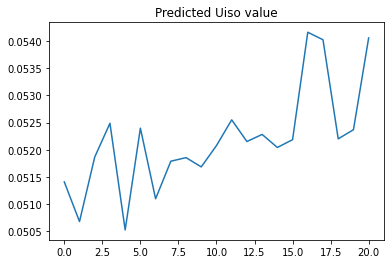

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/scan3_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/scan3_000007_GL-1_-03500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/scan3_000005_GL-1_-04000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/scan3_000003_GL-1_-04500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/scan3_000009_GL-1_-03000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/scan3_000011_GL-1_-02500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/scan3_000013_GL-1_-02000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/scan3_000015_GL-1_-01500_fs_Off_ 

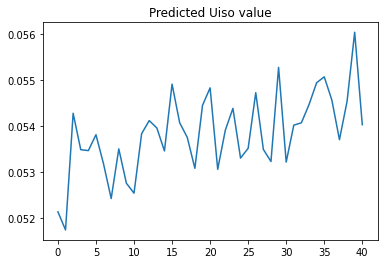

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/scan4_000001_GL-1_000000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/scan4_000003_GL-1_000200_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/scan4_000005_GL-1_000400_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/scan4_000007_GL-1_000600_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/scan4_000009_GL-1_000800_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/scan4_000011_GL-1_001000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/scan4_000013_GL-1_001200_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/scan4_000015_GL-1_001400_fs_Off_ 

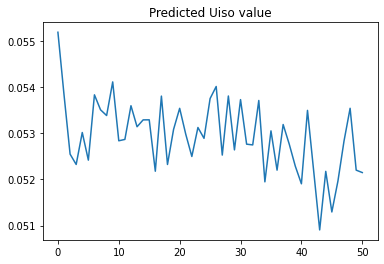

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/scan5_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/scan5_000005_GL-1_-01000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/scan5_000007_GL-1_001000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/scan5_000003_GL-1_-03000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/scan5_000009_GL-1_003000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/scan5_000013_GL-1_007000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/scan5_000011_GL-1_005000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/scan5_000015_GL-1_009000_fs_Off_ 

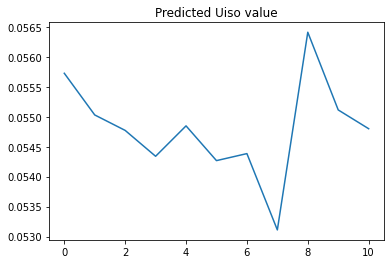

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/scan6_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/scan6_000003_GL-1_-04500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/scan6_000011_GL-1_-02500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/scan6_000005_GL-1_-04000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/scan6_000009_GL-1_-03000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/scan6_000007_GL-1_-03500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/scan6_000013_GL-1_-02000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/scan6_000019_GL-1_-00500_fs_Off_ 

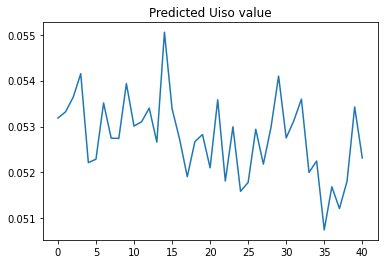

7
7
7
7
7
7
7


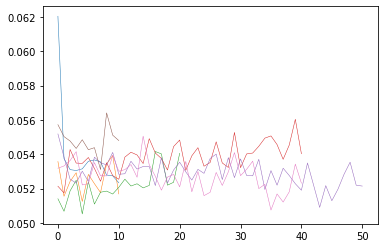

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/scan7_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/scan7_000003_GL-1_-01000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/scan7_000005_GL-1_003000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/scan7_000009_GL-1_011000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/scan7_000007_GL-1_007000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/scan7_000011_GL-1_015000_fs_Off_   NaN_md_.npy
Done! Added 6 images


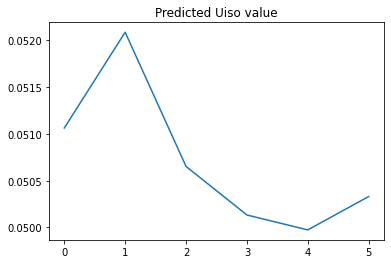

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/scan8_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/scan8_000005_GL-1_-04000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/scan8_000003_GL-1_-04500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/scan8_000007_GL-1_-03500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/scan8_000011_GL-1_-02500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/scan8_000009_GL-1_-03000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/scan8_000013_GL-1_-02000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/scan8_000017_GL-1_-01000_fs_Off_ 

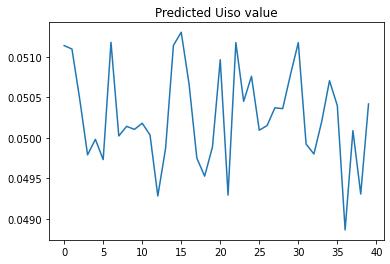

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/scan10_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/scan10_000003_GL-1_-01000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/scan10_000007_GL-1_007000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/scan10_000005_GL-1_003000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/scan10_000009_GL-1_011000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/scan10_000011_GL-1_015000_fs_Off_   NaN_md_.npy
Done! Added 6 images


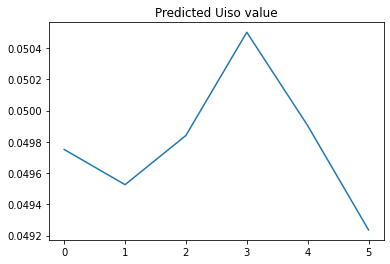

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/scan11_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/scan11_000003_GL-1_-04500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/scan11_000005_GL-1_-04000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/scan11_000009_GL-1_-03000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/scan11_000007_GL-1_-03500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/scan11_000011_GL-1_-02500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/scan11_000013_GL-1_-02000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/scan11_000017_GL-

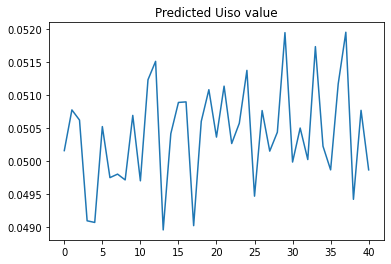

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/scan12_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/scan12_000003_GL-1_-01000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/scan12_000007_GL-1_007000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/scan12_000005_GL-1_003000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/scan12_000009_GL-1_011000_fs_Off_   NaN_md_.npy
Done! Added 5 images


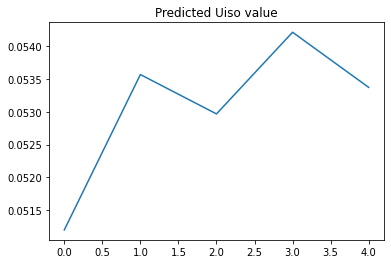

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/scan13_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/scan13_000003_GL-1_-04500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/scan13_000005_GL-1_-04000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/scan13_000007_GL-1_-03500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/scan13_000009_GL-1_-03000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/scan13_000011_GL-1_-02500_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/scan13_000013_GL-1_-02000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/scan13_000015_GL-

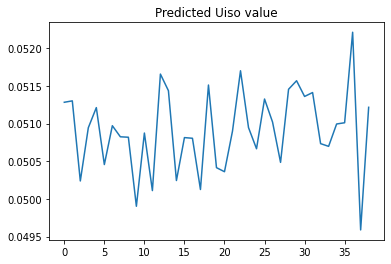

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/scan14_000005_GL-1_003000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/scan14_000003_GL-1_-01000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/scan14_000001_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/scan14_000007_GL-1_007000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/scan14_000009_GL-1_011000_fs_Off_   NaN_md_.npy
Done! Added 5 images


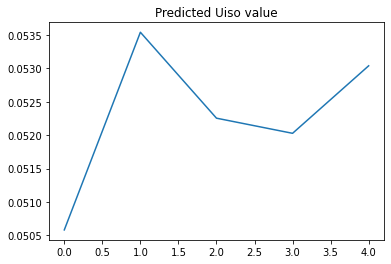

7
7
7
7
7
7
7


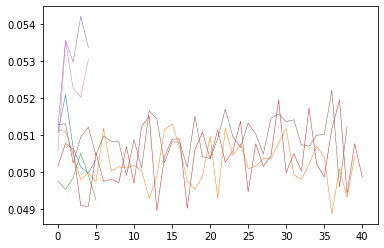

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/scan0_000001_GL-1_-20000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/scan0_000003_GL-1_-15000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/scan0_000005_GL-1_-10000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/scan0_000007_GL-1_-05000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/scan0_000009_GL-1_000000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/scan0_000011_GL-1_005000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/scan0_000013_GL-1_010000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/scan0_000015_GL-1_015000_fs_Off_ 

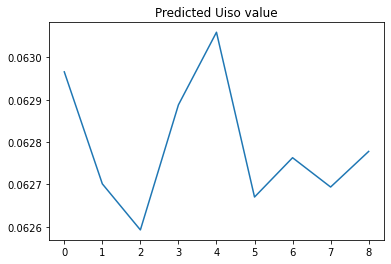

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/scan1_000001_GL-1_-10000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/scan1_000003_GL-1_-08000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/scan1_000005_GL-1_-06000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/scan1_000007_GL-1_-04000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/scan1_000011_GL-1_000000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/scan1_000009_GL-1_-02000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/scan1_000013_GL-1_002000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/scan1_000017_GL-1_006000_fs_Off_ 

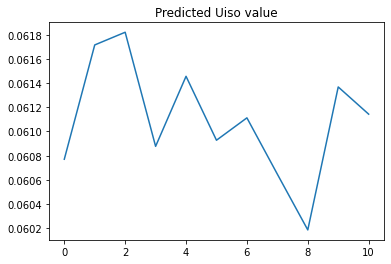

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/scan2_000001_GL-1_-100000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/scan2_000003_GL-1_-90000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/scan2_000005_GL-1_-80000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/scan2_000007_GL-1_-70000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/scan2_000009_GL-1_-60000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/scan2_000011_GL-1_-50000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/scan2_000013_GL-1_-40000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/scan2_000015_GL-1_-30000_fs_Off_

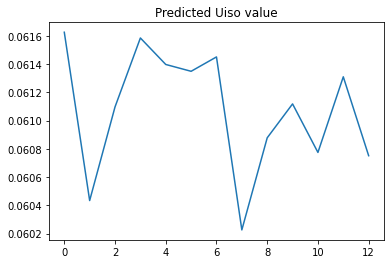

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/scan3_000001_GL-1_-50000_fs_Off_   NaN_md_.npy
/content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/scan3_000003_GL-1_-45000_fs_Off_   NaN_md_.npy


KeyboardInterrupt: ignored

In [ ]:
#loading OFF images
#epoch_to_load = int(input("what epoch to load?"))
#base_type = int(input("Normal base (0)? or Inverse Square base (1)?"))
#model = load_model(epoch_to_load,base_type)


#array of dates of scans to be opened
dates = [16,17,21]


Y,X = np.ogrid[:resolution,:resolution]
centre_val = resolution/2

dist_from_center = np.sqrt((X-78)**2+(Y-79)**2)
mask = (dist_from_center > 13)      

#opens scans 0-15
dirs_to_open=range(0,15)
data_dir = '/content/drive/MyDrive/Bismuth_Data_Processed/'
for date in dates:
  date = "2021-02-" + str(date) + "/scans/scan"
  series_arr = []
  for i in dirs_to_open:
    #print("----------STARTING NEW TEST------")
    scan_num = str(i)
    dir_name = data_dir + date + scan_num + "/"
    if os.path.exists(dir_name):
      print("Directory name: "+dir_name)
      file_name_array, data_dict = process_data(dir_name,keep_on_only=False)
      file_name_array.sort()
      data_arr = []


      for file_name in file_name_array:
        data_arr.append([data_dict[file_name],file_name])     
        

      try:
        X_test,labels = zip(*data_arr)        
        X_test_arr = np.expand_dims(np.array(X_test),-1)
        predictions = model.predict(X_test_arr)
        reg_preds = []
        for prediction in predictions:
          reg_preds.append(prediction)
        if len(reg_preds) > 1:
          series_arr.append(reg_preds)
          
          plt.plot(reg_preds)
          plt.title("Predicted Uiso value")
          plt.show()          
                      
        #if i train for many epochs, maybe it overfits because of relatively small basis of original data points in dataset, but trend of predicted uiso values doesn't show any increase
      except:
        print("Couldn't load")
      
  
  #plt.title("Predicted Uiso value")
  for series in series_arr:
    print(len(series_arr))
    plt.plot(series, linewidth=0.5)
  plt.show()
  

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan0/
Done! Added 11 images


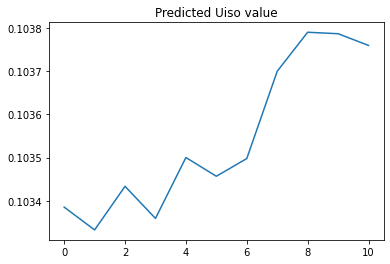

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan1/
Done! Added 11 images


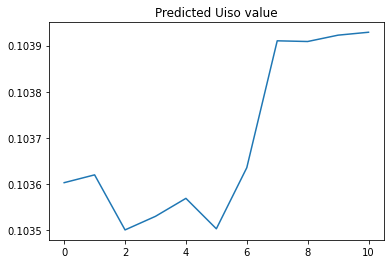

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan2/
Done! Added 21 images


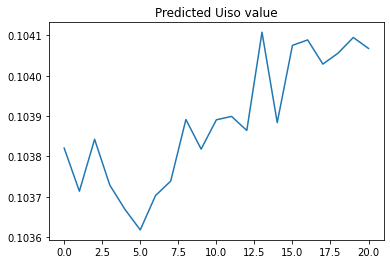

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan3/
Done! Added 41 images


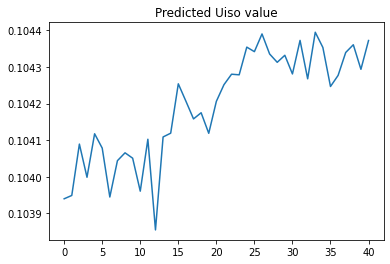

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan4/
Done! Added 51 images


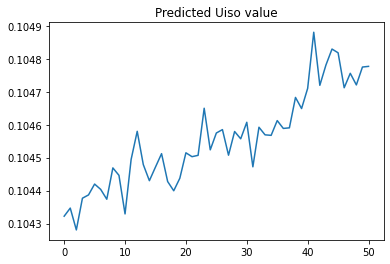

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan5/
Done! Added 11 images


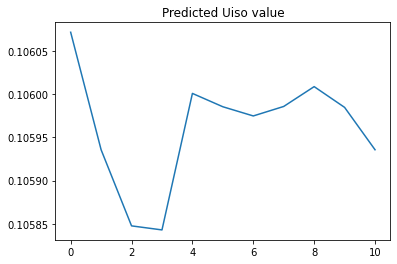

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-16/scans/scan6/
Done! Added 41 images


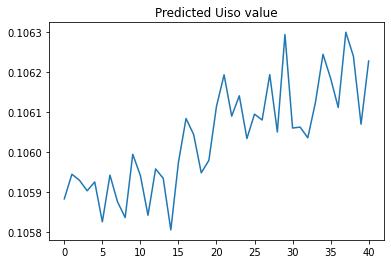

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan0/
Done! Added 0 images
Couldn't load
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan7/
Done! Added 6 images


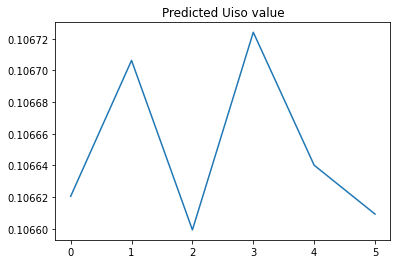

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan8/
Done! Added 40 images


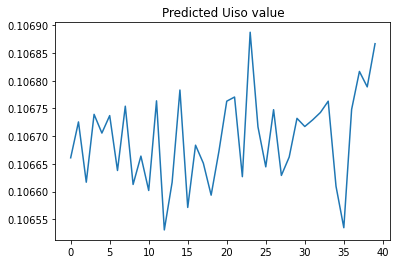

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan10/
Done! Added 6 images


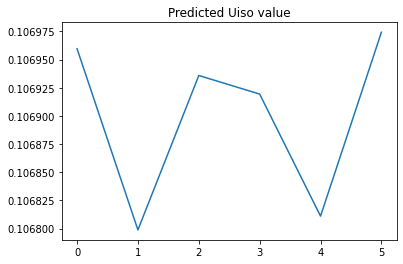

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan11/
Done! Added 41 images


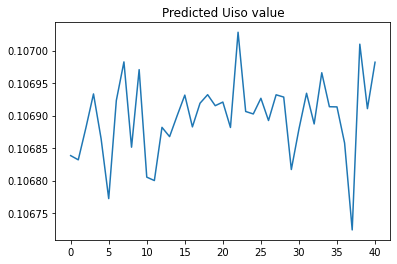

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan12/
Done! Added 5 images


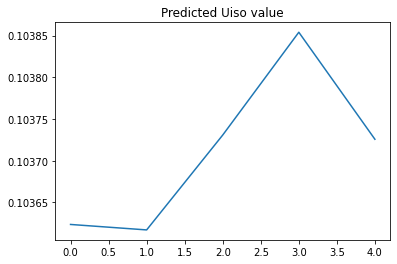

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan13/
Done! Added 41 images


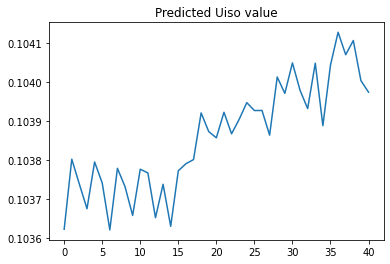

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-17/scans/scan14/
Done! Added 5 images


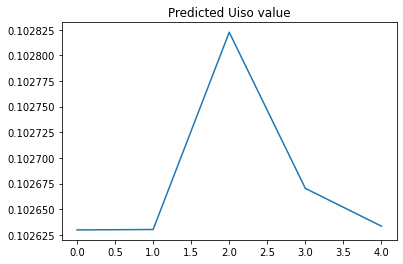

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan0/
Done! Added 9 images


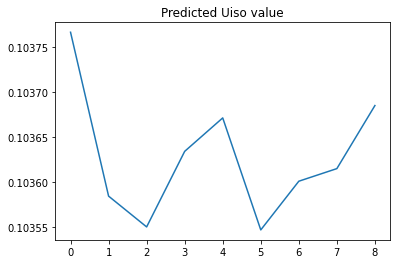

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan1/
Done! Added 11 images


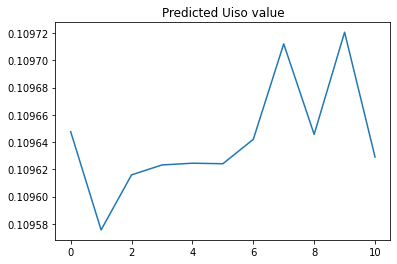

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan2/
Done! Added 13 images


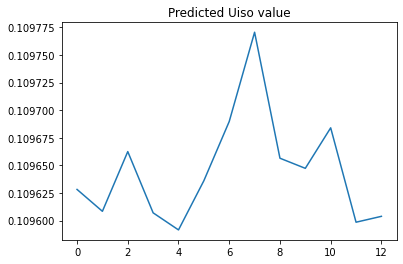

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan3/
Done! Added 15 images


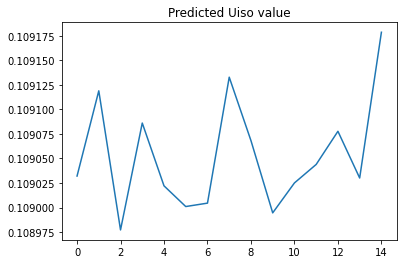

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan4/
Done! Added 16 images


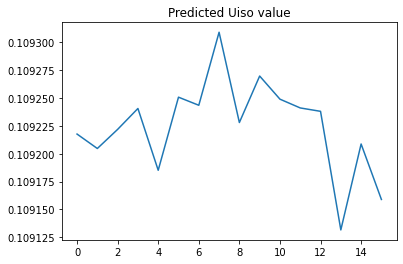

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan5/
Done! Added 24 images


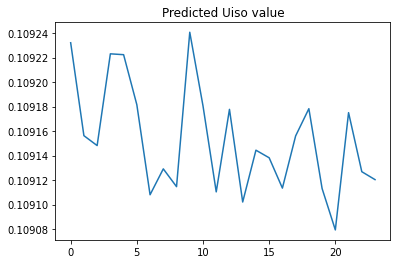

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan6/
Done! Added 22 images


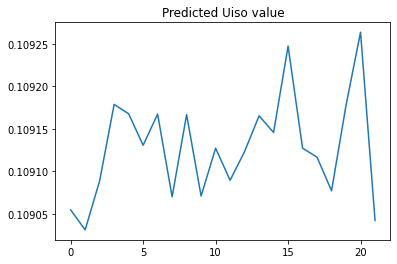

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan7/
Done! Added 1 images
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan8/
Done! Added 1 images
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan9/
Done! Added 1 images
Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan10/
Done! Added 24 images


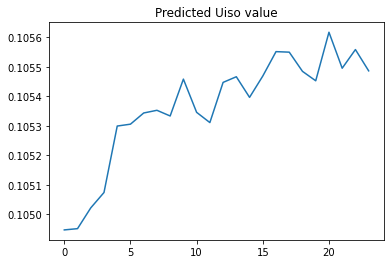

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan12/
Done! Added 25 images


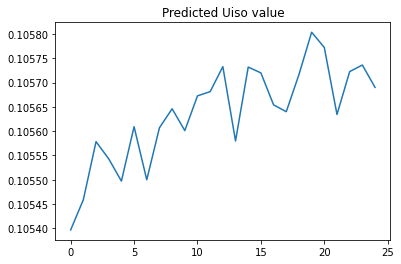

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan13/
Done! Added 25 images


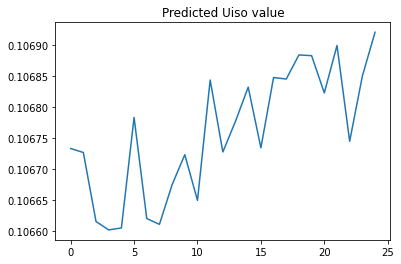

Directory name: /content/drive/MyDrive/Bismuth_Data_Processed/2021-02-21/scans/scan14/
Done! Added 25 images


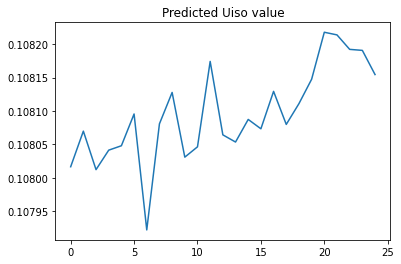

In [ ]:
#Scans from previous iteration kept as a reference